In [82]:
import numpy as np
from numba import jit
import time
import matplotlib.pyplot as plt
import ctypes
import os

TESTS_AMOUNT = 10

# Реализация на Python с использованием Numba

In [83]:
@jit(nopython=True)
def firefly_algorithm(function, dimensions, bounds_array,
                      fireflies_number,
                      max_iteration, alpha, beta,
                      random_movement_possibilities=10):
    # Initialize the swarm:
    fireflies = []

    for firefly_number in range(fireflies_number):
        new_firefly = []
        for dimension_number in range(dimensions):
            parameter = np.random.uniform(bounds_array[dimension_number][0],
                                          bounds_array[dimension_number][1])
            new_firefly.append(parameter)
        fireflies.append(new_firefly)

    fireflies = np.array(fireflies)
    intensities = []

    for firefly in fireflies:
        intensities.append(function(firefly))
    intensities = np.array(intensities)
    # print(fireflies)

    best_values = np.array([0.0 for i in range(max_iteration)])

    # Main loop
    for iteration in range(max_iteration):
        for i in range(fireflies_number):
            has_moved = False
            for j in range(fireflies_number):
                if intensities[j] > intensities[i]:  # Moving firefly
                    distance = np.sum(np.square(fireflies[i] - fireflies[j]),
                                      axis=-1)
                    a0 = intensities[j] / intensities[i] if \
                        intensities[i] != 0.0 else 1.0
                    new_position = fireflies[i] + a0 * np.exp(
                        -beta * distance) * (
                                           fireflies[j] - fireflies[i]) + (
                                           alpha * np.random.rand(dimensions))
                    for dimension_number in range(dimensions):
                        if new_position[dimension_number] > \
                                bounds_array[dimension_number][1]:
                            new_position[dimension_number] = \
                                bounds_array[dimension_number][1]
                        elif new_position[dimension_number] < \
                                bounds_array[dimension_number][0]:
                            new_position[dimension_number] = \
                                bounds_array[dimension_number][0]
                    fireflies[i] = new_position
                    intensities[i] = function(new_position)
                    has_moved = True
            if not has_moved:
                for random_try in range(random_movement_possibilities):
                    random_direction = np.random.rand(dimensions)
                    new_possible_position = fireflies[
                                                i] + alpha * random_direction
                    for dimension_number in range(dimensions):
                        if new_possible_position[dimension_number] > \
                                bounds_array[dimension_number][1]:
                            new_possible_position[dimension_number] = \
                                bounds_array[dimension_number][1]
                        elif new_possible_position[dimension_number] < \
                                bounds_array[dimension_number][0]:
                            new_possible_position[dimension_number] = \
                                bounds_array[dimension_number][0]
                    new_possible_intensity = function(new_possible_position)
                    if new_possible_intensity > intensities[i]:
                        # If new position is brighter
                        fireflies[i] = new_possible_position
                        intensities[i] = new_possible_intensity
                        break
        best_values[iteration] = np.max(intensities)
        # If we didn't find any better direction, we left this firefly

    best_intensity = intensities[0]
    best_solution = fireflies[0]

    for number, intensity in enumerate(intensities):
        if intensity > best_intensity:
            best_intensity = intensity
            best_solution = fireflies[number]

    return best_solution, best_intensity, best_values

In [84]:
@jit(nopython=True)
def firefly_algorithm_performance_graph(function, dimensions, bounds_array, fireflies_number,
                      max_iteration, alpha, beta,
                      random_movement_possibilities=10):
    # Initialize the swarm:
    fireflies = []

    for firefly_number in range(fireflies_number):
        new_firefly = []
        for dimension_number in range(dimensions):
            parameter = np.random.uniform(bounds_array[dimension_number][0],
                                          bounds_array[dimension_number][1])
            new_firefly.append(parameter)
        fireflies.append(new_firefly)

    fireflies = np.array(fireflies)
    intensities = []

    for firefly in fireflies:
        intensities.append(function(firefly))
    intensities = np.array(intensities)
    # print(fireflies)
    
    best_values = []

    # Main loop
    for iteration in range(max_iteration):
        for i in range(fireflies_number):
            has_moved = False
            for j in range(fireflies_number):
                if intensities[j] > intensities[i]:  # Moving firefly
                    distance = np.sum(np.square(fireflies[i] - fireflies[j]),
                                      axis=-1)
                    a0 = intensities[j] / intensities[i] if \
                        intensities[i] != 0.0 else 1.0
                    new_position = fireflies[i] + a0 * np.exp(
                        -beta * distance) * (
                                           fireflies[j] - fireflies[i]) + (
                                           alpha * np.random.rand(dimensions))
                    for dimension_number in range(dimensions):
                        if new_position[dimension_number] > \
                                bounds_array[dimension_number][1]:
                            new_position[dimension_number] = \
                                bounds_array[dimension_number][1]
                        elif new_position[dimension_number] < \
                                bounds_array[dimension_number][0]:
                            new_position[dimension_number] = \
                                bounds_array[dimension_number][0]
                    fireflies[i] = new_position
                    intensities[i] = function(new_position)
                    has_moved = True
            if not has_moved:
                for random_try in range(random_movement_possibilities):
                    random_direction = np.random.rand(dimensions)
                    new_possible_position = fireflies[
                                                i] + alpha * random_direction
                    for dimension_number in range(dimensions):
                        if new_possible_position[dimension_number] > \
                                bounds_array[dimension_number][1]:
                            new_possible_position[dimension_number] = \
                                bounds_array[dimension_number][1]
                        elif new_possible_position[dimension_number] < \
                                bounds_array[dimension_number][0]:
                            new_possible_position[dimension_number] = \
                                bounds_array[dimension_number][0]
                    new_possible_intensity = function(new_possible_position)
                    if new_possible_intensity > intensities[i]:
                        # If new position is brighter
                        fireflies[i] = new_possible_position
                        intensities[i] = new_possible_intensity
                        break
                # If we didn't find any better direction, we left this firefly

    best_intensity = intensities[0]
    best_solution = fireflies[0]

    for number, intensity in enumerate(intensities):
        if intensity > best_intensity:
            best_intensity = intensity
            best_solution = fireflies[number]

    return best_solution, best_intensity


In [85]:
def draw_graphic(best_values, iterations_number, function_name):
    x = np.array([i for i in range(1, iterations_number + 1)])
    plt.title("Performance of " + function_name)
    plt.xlabel("Iteration number")
    plt.ylabel("Functional value")
    plt.plot(x, best_values)
    plt.grid(color="green", linestyle="--", linewidth=0.5)
    plt.show()

In [86]:
def draw_distribution_graphic(best_values, tests_number, function_name):
    x = np.array([i for i in range(1, tests_number + 1)])
    plt.title("Distribution of " + function_name)
    plt.xlabel("Test number")
    plt.ylabel("Best found value")
    plt.scatter(x, best_values, c="blue")
    average = np.average(best_values)
    dispersion = np.sqrt(np.var(best_values))
    average_list = [average for i in range(1, tests_number + 1)]
    plt.plot(x, average_list, c="red")
    plt.fill_between(x, average_list - dispersion, average_list + dispersion, color="red", alpha=0.2)
    plt.show()

In [87]:
def perform_test(function_name, function, min_argument, max_argument, fireflies_number, iterations_number, alpha, beta, draw_graph=True):
    bonds = [(min_argument, max_argument), (min_argument, max_argument)]

    start_time = time.perf_counter_ns()
    best_solution, best_intensity, best_values = firefly_algorithm(function, 2,
                                                      np.array(bonds),
                                                      fireflies_number, iterations_number, alpha, beta)
    time_elapsed = time.perf_counter_ns() - start_time
    print("Best solution found is: ", best_solution)
    print("And function result for this solution is: ", best_intensity)
    print("Totally elapsed ", time_elapsed / 1_000_000_000, " seconds")
    if draw_graph:
        draw_graphic(best_values, iterations_number, function_name)
    return best_intensity, time_elapsed / 1_000_000_000

## Тестирование функции Де Джонга

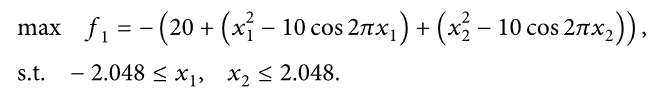

In [8]:
@jit(nopython=True)
def second_de_jong_function(arguments):
    return -1.0 * ( 20 + (np.power(arguments[0], 2) - 10*(np.cos(2*np.pi * arguments[0]))) + (np.power(arguments[1], 2) - 10*(np.cos(2*np.pi * arguments[1]))))

-->Test number 0
Best solution found is:  [-1.27640895e-04  1.00940426e+00]
And function result for this solution is:  -1.03635251718892
Totally elapsed  4.5486391  seconds


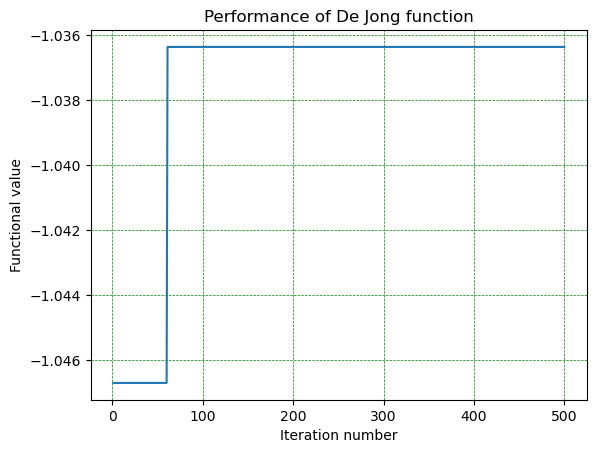

-->Test number 1
Best solution found is:  [-0.0016763   0.03136326]
And function result for this solution is:  -0.1950790969834042
Totally elapsed  0.116158  seconds


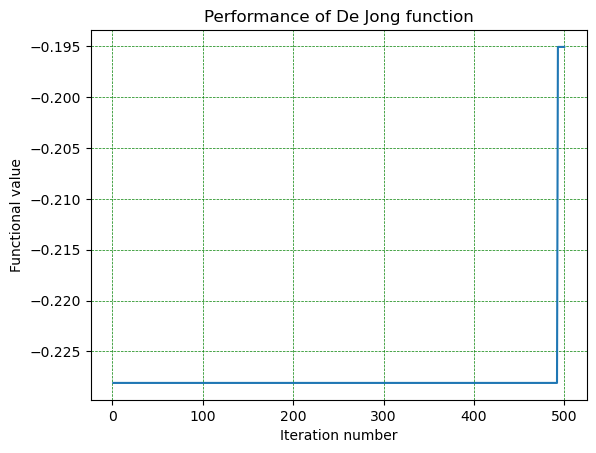

-->Test number 2
Best solution found is:  [0.03863188 1.02968283]
And function result for this solution is:  -1.5283006635094036
Totally elapsed  0.7503048  seconds


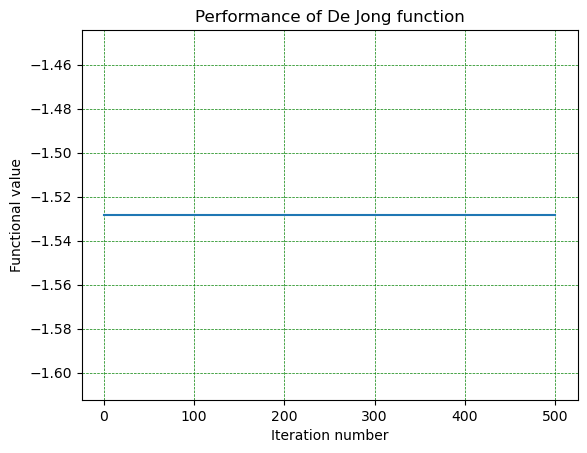

-->Test number 3
Best solution found is:  [0.02619715 0.0003326 ]
And function result for this solution is:  -0.13587100556739173
Totally elapsed  0.1257363  seconds


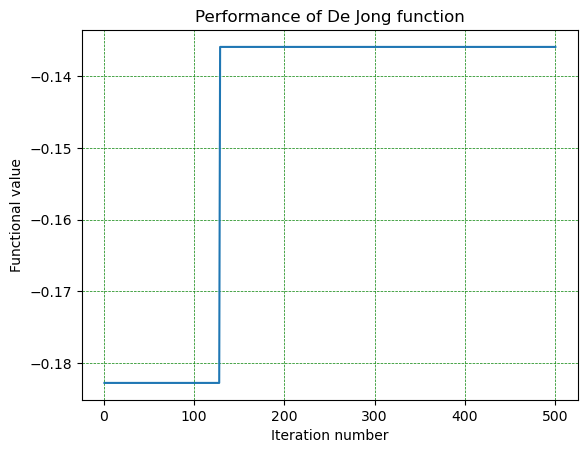

-->Test number 4
Best solution found is:  [0.02446966 0.00905811]
And function result for this solution is:  -0.13483107454879928
Totally elapsed  0.1042293  seconds


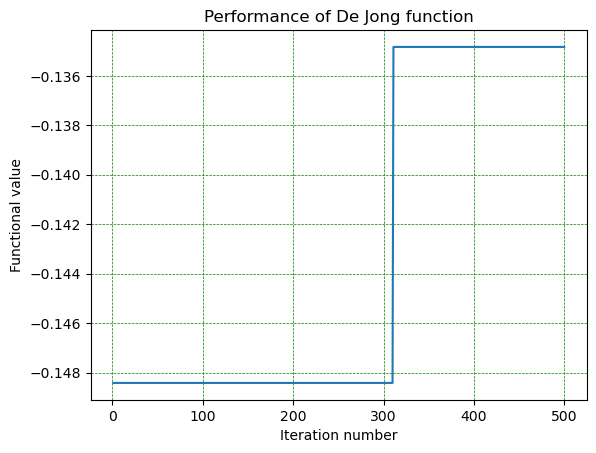

-->Test number 5
Best solution found is:  [0.00400807 0.04038536]
And function result for this solution is:  -0.32503618328310857
Totally elapsed  0.1648625  seconds


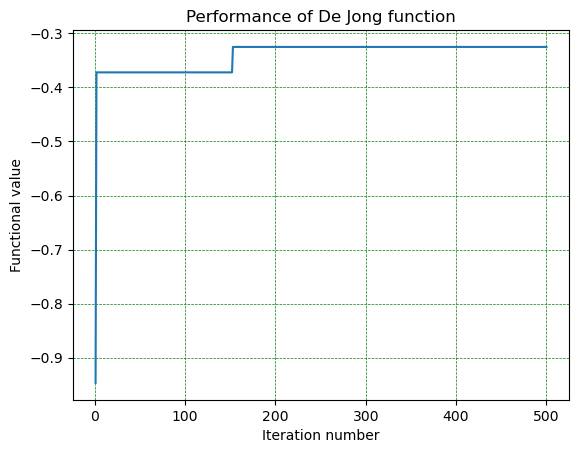

-->Test number 6
Best solution found is:  [0.00796759 1.0099286 ]
And function result for this solution is:  -1.0519996323620724
Totally elapsed  0.448021  seconds


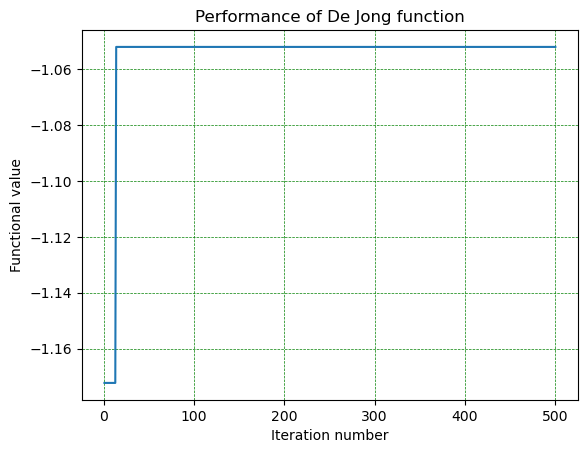

-->Test number 7
Best solution found is:  [0.02102014 0.01174902]
And function result for this solution is:  -0.11490571198003074
Totally elapsed  0.0834762  seconds


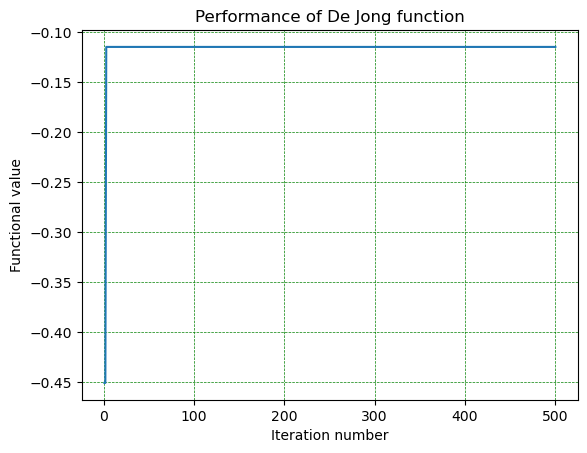

-->Test number 8
Best solution found is:  [0.02898425 0.02728679]
And function result for this solution is:  -0.31356565359567057
Totally elapsed  0.1482782  seconds


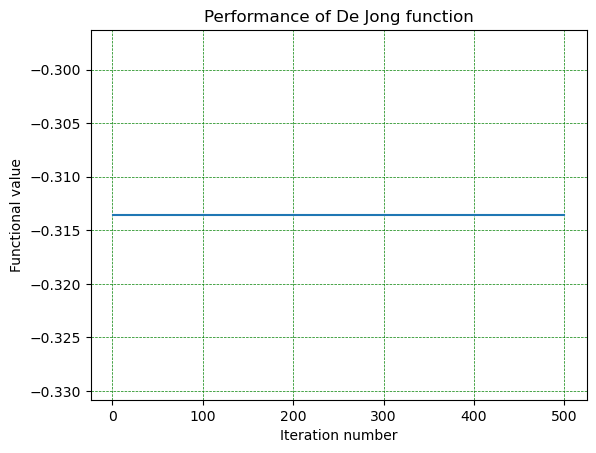

-->Test number 9
Best solution found is:  [0.0664421  0.01176065]
And function result for this solution is:  -0.8906578158548726
Totally elapsed  0.3552997  seconds


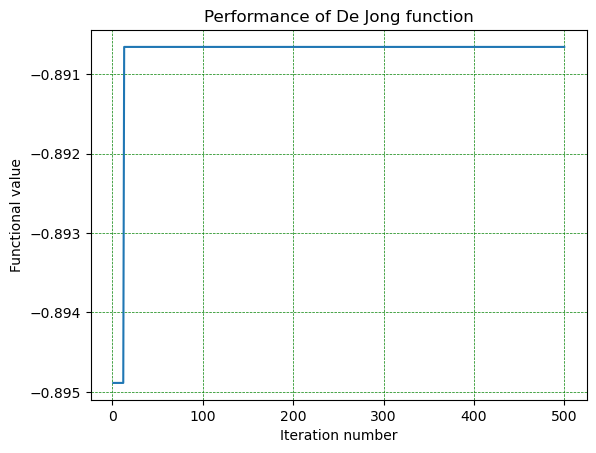

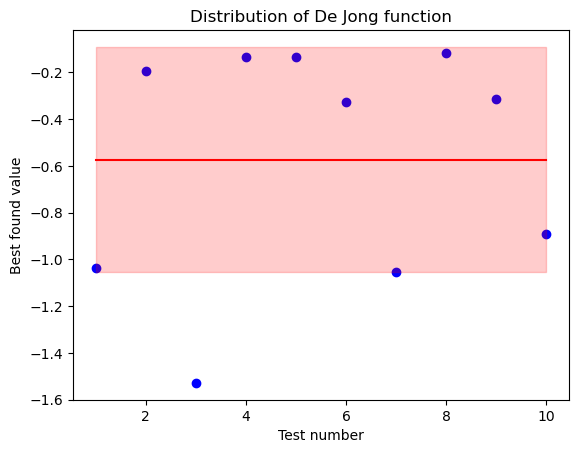

Dispersion is 0.2322181477377951


In [9]:
function_name = "De Jong function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_de_jong_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test(function_name, second_de_jong_function, -2.048, 2.048, 100, 500, 0.4, 0.3, draw_graph=True)
    average_de_jong_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_de_jong_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Есома

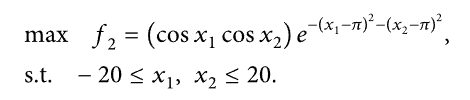

In [9]:
@jit(nopython=True)
def esom_function(arguments):
    return (np.cos(arguments[0]) * np.cos(arguments[1]) * np.exp(
        -1 * np.power((arguments[0] - np.pi), 2) - np.power(
            (arguments[1] - np.pi), 2)))

-->Test number 0
Best solution found is:  [3.79224338 4.58504461]
And function result for this solution is:  0.008237895946024748
Totally elapsed  2.3477952  seconds


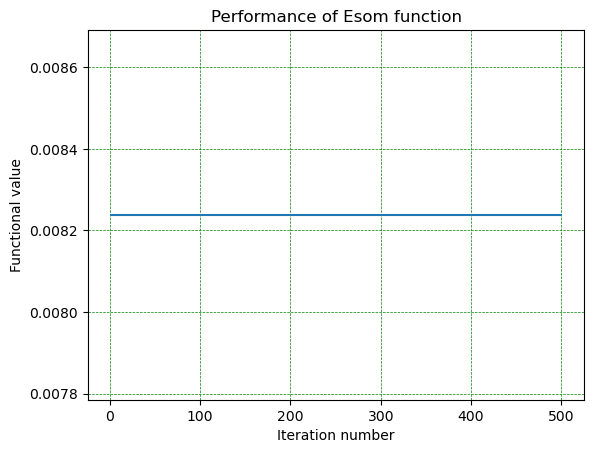

-->Test number 1
Best solution found is:  [4.40010989 3.15769847]
And function result for this solution is:  0.06301270440650424
Totally elapsed  1.5575287  seconds


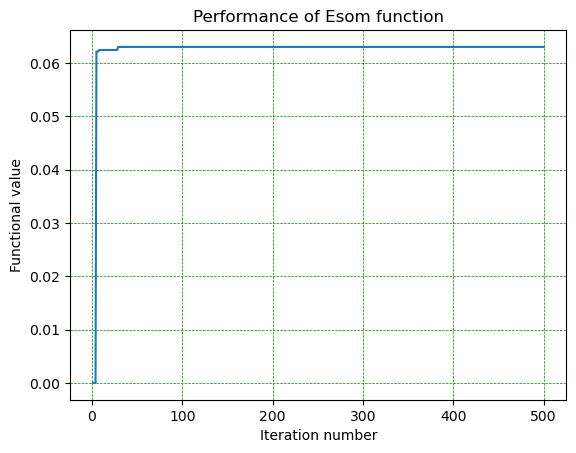

-->Test number 2
Best solution found is:  [3.55245643 3.93109381]
And function result for this solution is:  0.29237837516137716
Totally elapsed  1.5092636  seconds


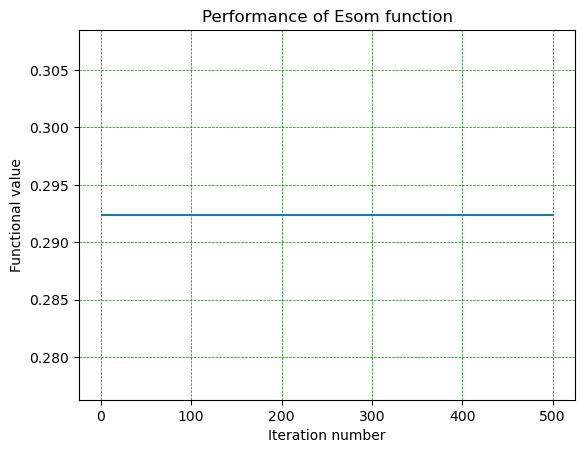

-->Test number 3
Best solution found is:  [4.02699557 3.13269943]
And function result for this solution is:  0.28898596266223453
Totally elapsed  0.6910943  seconds


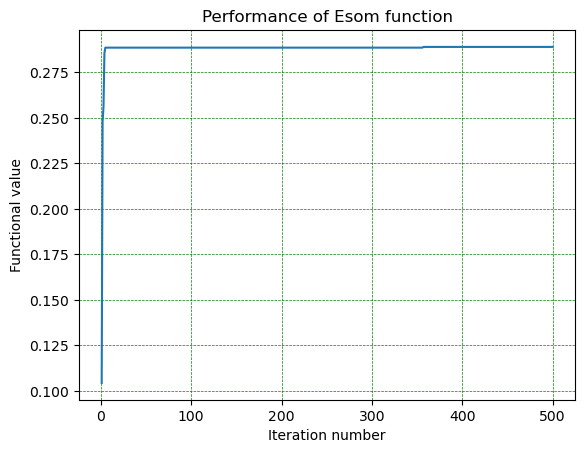

-->Test number 4
Best solution found is:  [4.02351854 4.27241759]
And function result for this solution is:  0.03462567753288838
Totally elapsed  1.5723393  seconds


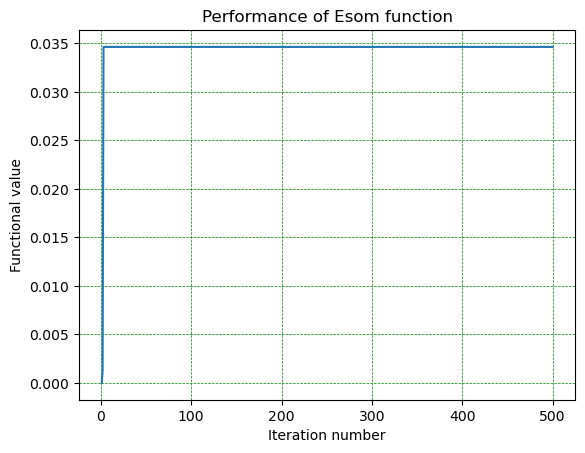

-->Test number 5
Best solution found is:  [3.15436069 4.06003313]
And function result for this solution is:  0.2610861639624642
Totally elapsed  1.6093541  seconds


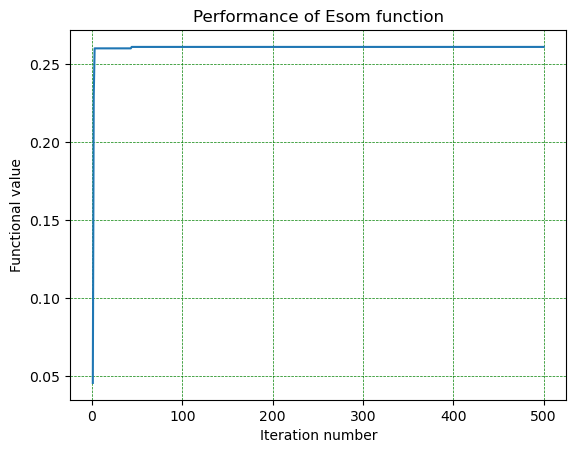

-->Test number 6
Best solution found is:  [3.64631692 3.10296778]
And function result for this solution is:  0.6769456943877166
Totally elapsed  1.5060572  seconds


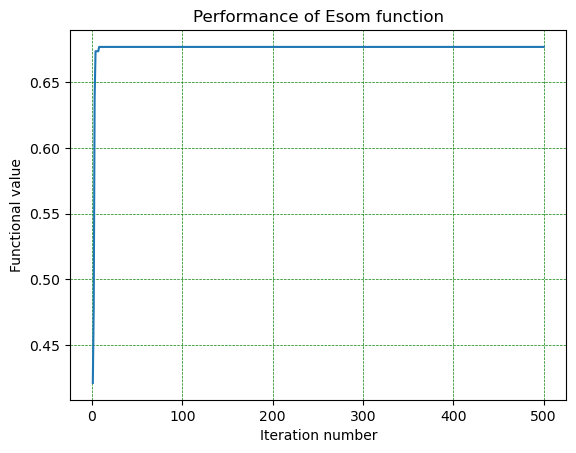

-->Test number 7
Best solution found is:  [3.20867924 3.26135578]
And function result for this solution is:  0.9721116416280946
Totally elapsed  0.8854778  seconds


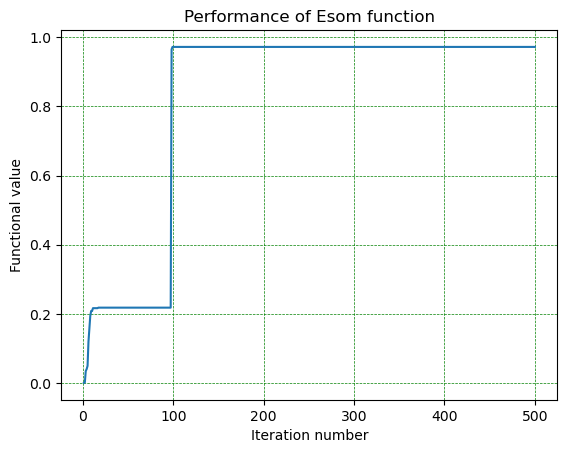

-->Test number 8
Best solution found is:  [3.16598176 4.15519776]
And function result for this solution is:  0.18911039324987355
Totally elapsed  1.5178671  seconds


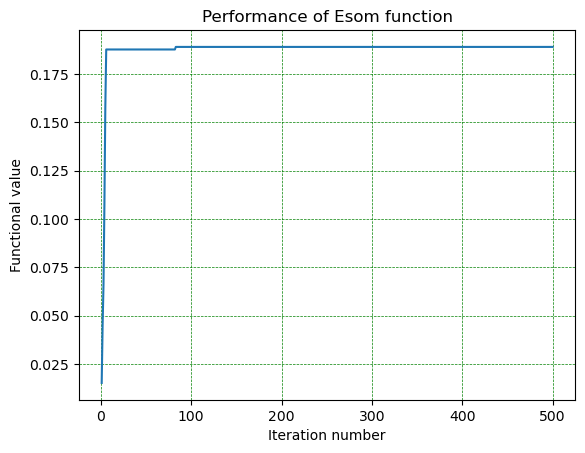

-->Test number 9
Best solution found is:  [4.45057739 4.13223665]
And function result for this solution is:  0.009584567717553337
Totally elapsed  0.7313262  seconds


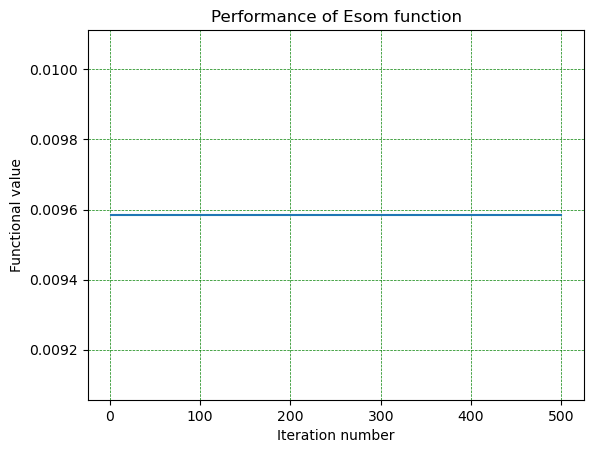

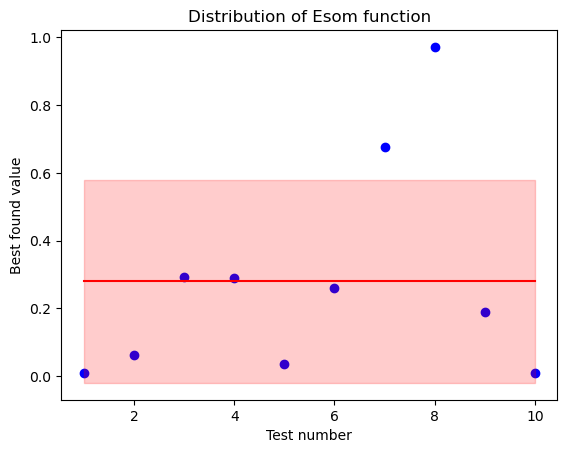

Dispersion is 0.0899706688703064


In [10]:
function_name = "Esom function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_esom_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test(function_name, esom_function, -20.0, 20.0, 100, 500, 0.4, 0.3, draw_graph=True)
    average_esom_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_esom_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Прерывистый тест

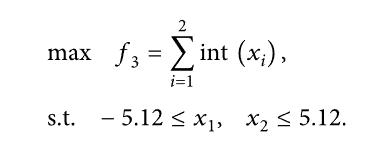

In [34]:
@jit(nopython=True)
def discontinuous_test(arguments):
    return int(arguments[0]) + int(arguments[1])

-->Test number 0
Best solution found is:  [5.10062492 5.12      ]
And function result for this solution is:  10
Totally elapsed  1.5888974  seconds


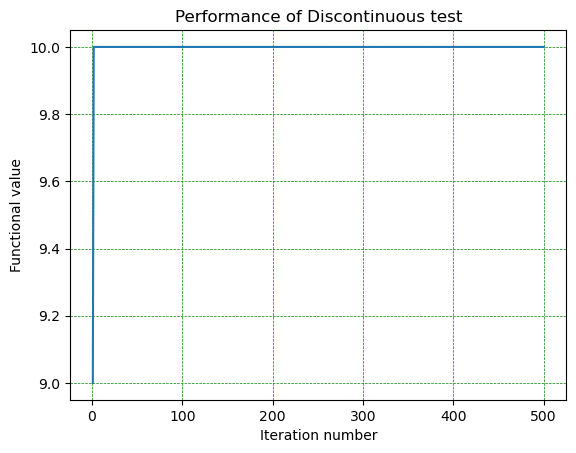

-->Test number 1
Best solution found is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed  0.0886723  seconds


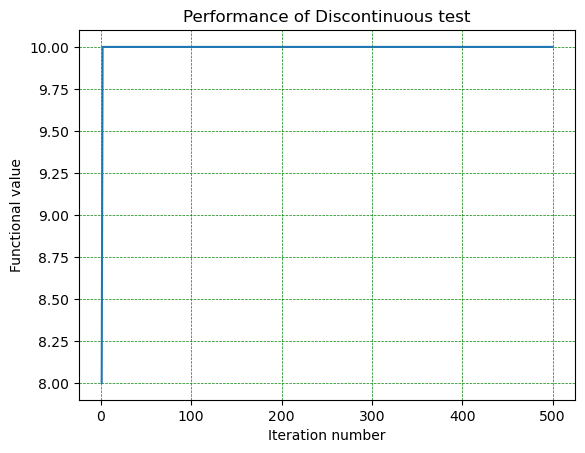

-->Test number 2
Best solution found is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed  0.082027  seconds


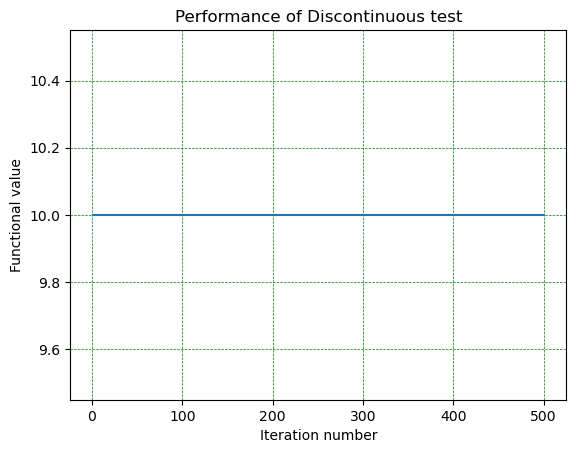

-->Test number 3
Best solution found is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed  0.0896262  seconds


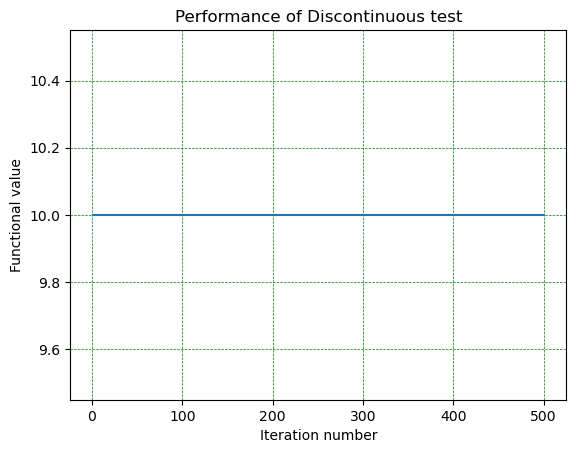

-->Test number 4
Best solution found is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed  0.0826776  seconds


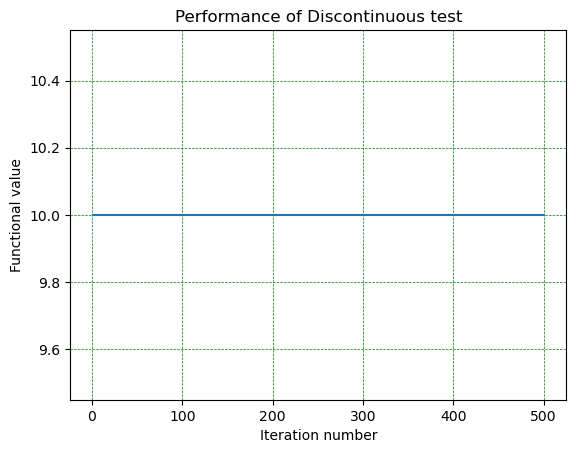

-->Test number 5
Best solution found is:  [5.10889363 5.12      ]
And function result for this solution is:  10
Totally elapsed  0.0894334  seconds


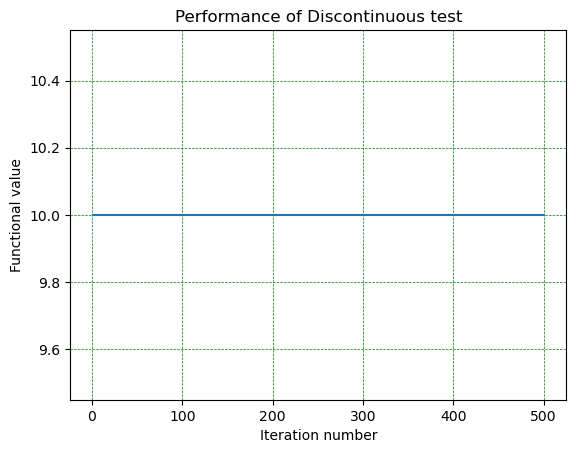

-->Test number 6
Best solution found is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed  0.0833285  seconds


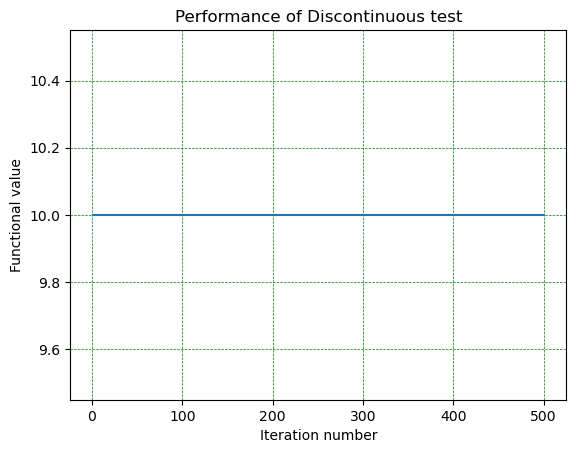

-->Test number 7
Best solution found is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed  0.0893988  seconds


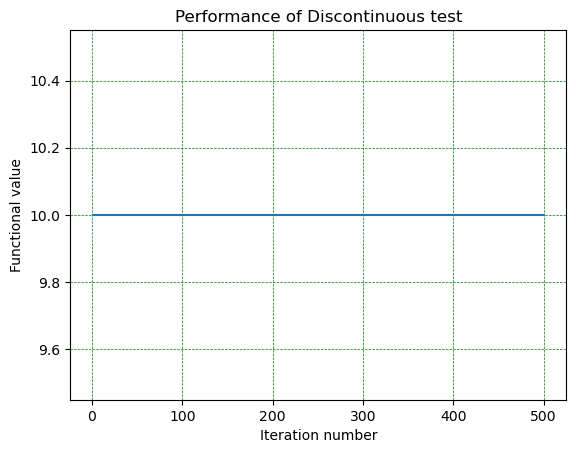

-->Test number 8
Best solution found is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed  0.089341  seconds


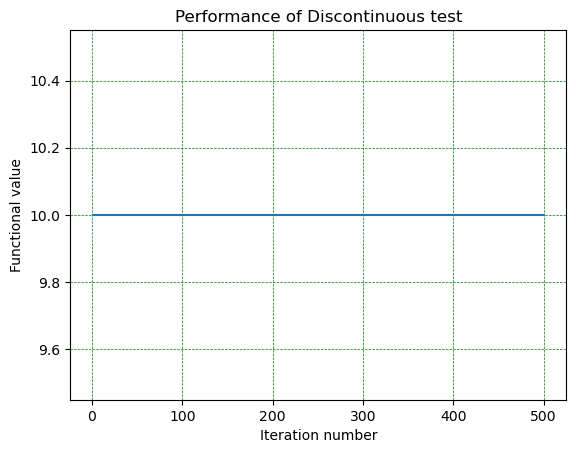

-->Test number 9
Best solution found is:  [5.03496302 5.1012927 ]
And function result for this solution is:  10
Totally elapsed  0.0894084  seconds


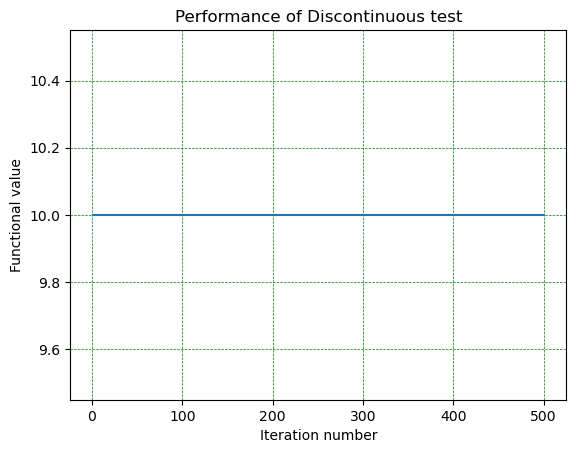

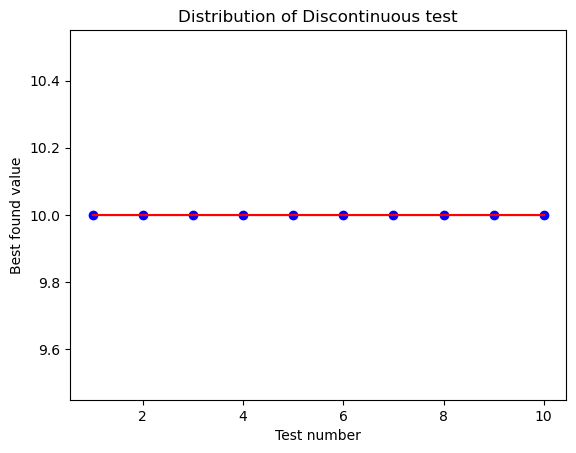

Dispersion is 0.0


In [12]:
function_name = "Discontinuous test"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_discontinuous_test_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test(function_name, discontinuous_test, -5.12, 5.12, 100, 500, 0.4, 0.3, draw_graph=True)
    average_discontinuous_test_python_time += time_elapsed
    best_values[test_number] = best_value
average_discontinuous_test_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Мишры

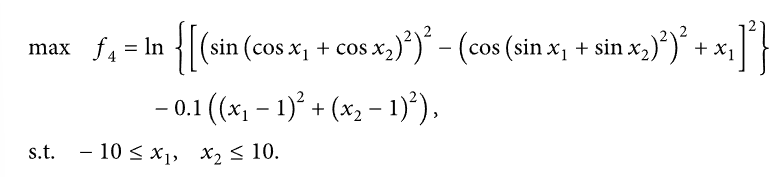

In [72]:
@jit(nopython=True)
def mishra_function(arguments):
    return np.log(
        np.power((
                np.power(np.sin(
                    np.power((np.cos(arguments[0]) + np.cos(arguments[1])), 2)),
                    2) - np.power(
            np.cos(np.power((np.sin(arguments[0]) + np.sin(arguments[1])), 2)),
            2) + arguments[0]
        ), 2)
    ) - 0.1 * (np.power(arguments[0] - 1, 2) + np.power(arguments[1] - 1, 2))

-->Test number 0
Best solution found is:  [3.58681968 1.82335893]
And function result for this solution is:  1.937982198371711
Totally elapsed  2.1953373  seconds


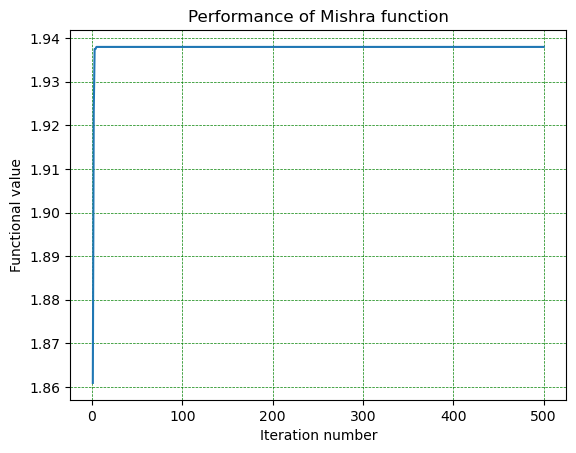

-->Test number 1
Best solution found is:  [2.885816   1.82495016]
And function result for this solution is:  2.2839424374984403
Totally elapsed  0.7072033  seconds


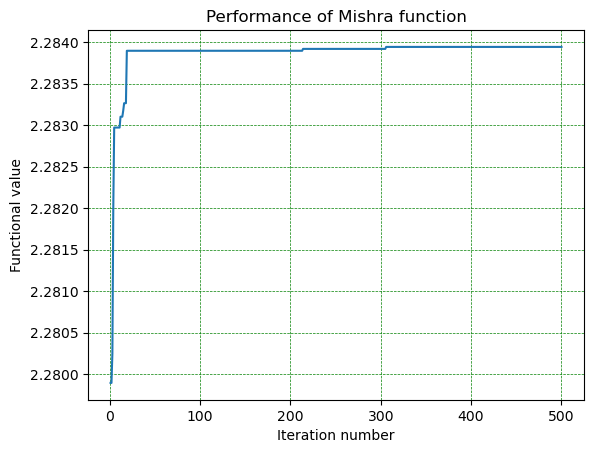

-->Test number 2
Best solution found is:  [ 4.8465527  -0.17876731]
And function result for this solution is:  1.8643334149567088
Totally elapsed  0.5144088  seconds


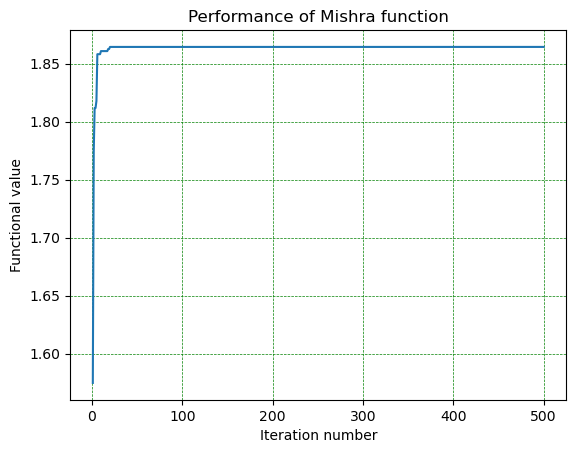

-->Test number 3
Best solution found is:  [3.63645999 1.87611765]
And function result for this solution is:  1.9224317899237533
Totally elapsed  0.7955797  seconds


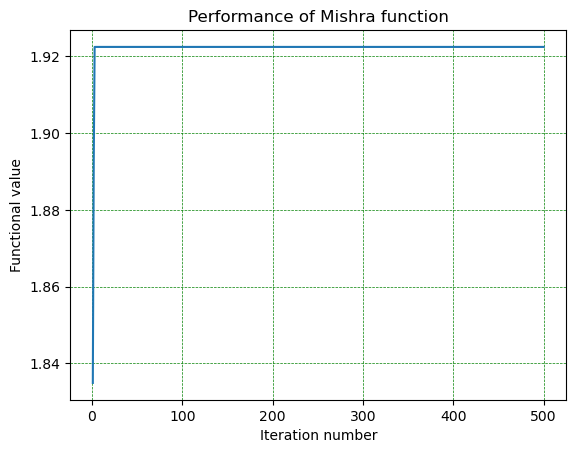

-->Test number 4
Best solution found is:  [2.88731475 1.82282737]
And function result for this solution is:  2.2839472361316218
Totally elapsed  0.9883163  seconds


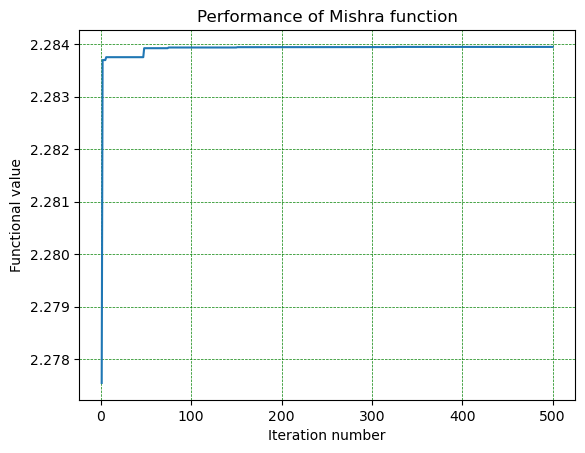

-->Test number 5
Best solution found is:  [2.88621066 1.82322283]
And function result for this solution is:  2.2839497935170696
Totally elapsed  0.6942115  seconds


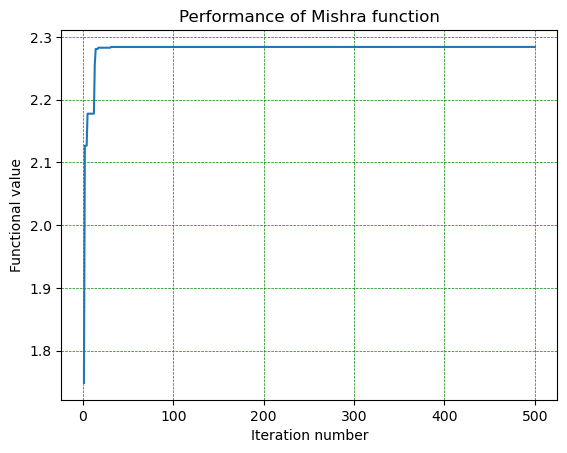

-->Test number 6
Best solution found is:  [2.88486616 1.82379158]
And function result for this solution is:  2.2839444621036096
Totally elapsed  0.7656266  seconds


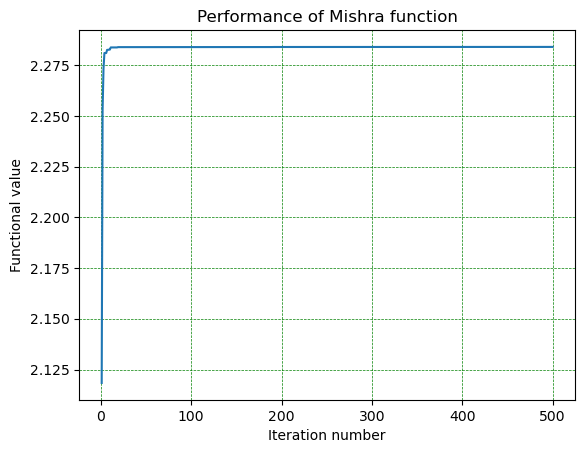

-->Test number 7
Best solution found is:  [2.88850084 1.82186379]
And function result for this solution is:  2.2839370190473267
Totally elapsed  0.8786529  seconds


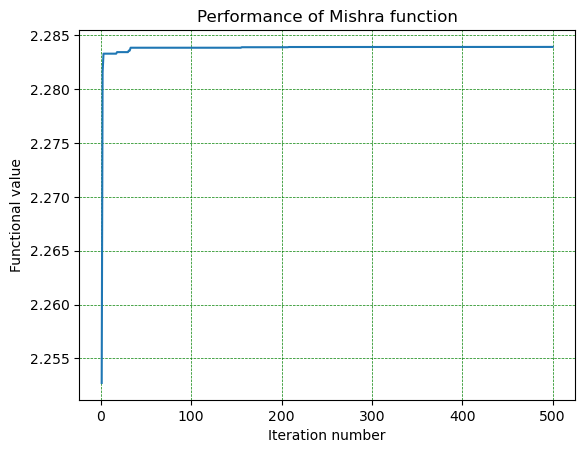

-->Test number 8
Best solution found is:  [2.88451542 1.82471336]
And function result for this solution is:  2.2839403560647487
Totally elapsed  0.7332745  seconds


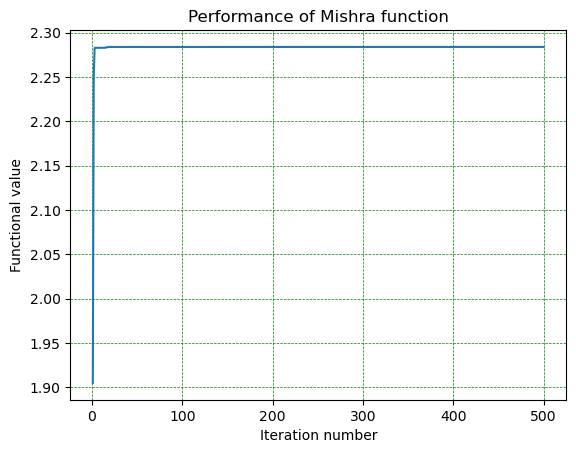

-->Test number 9
Best solution found is:  [ 4.84732211 -0.17843849]
And function result for this solution is:  1.8643337951345358
Totally elapsed  0.6983689  seconds


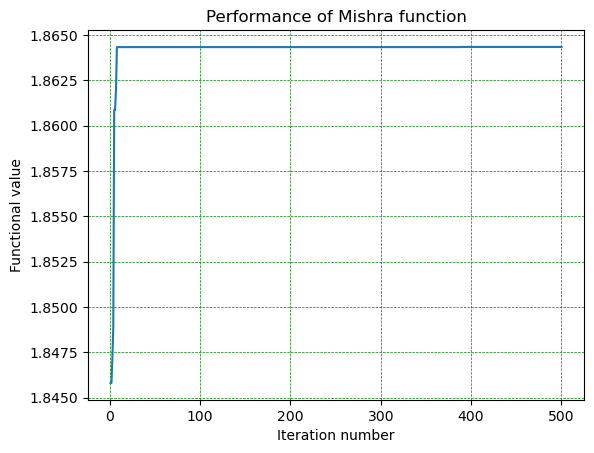

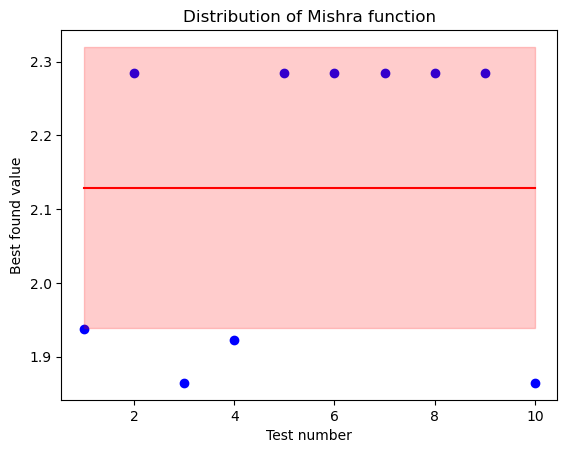

Dispersion is 0.036329909863633006


In [14]:
function_name = "Mishra function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_mishra_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test(function_name, mishra_function, -10.0, 10.0, 100, 500, 0.4, 0.3, draw_graph=True)
    average_mishra_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_mishra_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Стохастический тест

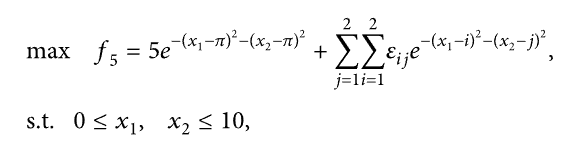

In [36]:
@jit(nopython=True)
def stochastic_test(arguments):
    return 5 * np.exp(-1*np.power((arguments[0] - np.pi), 2) - np.power((arguments[1] - np.pi), 2)) + sum([np.random.rand() * np.exp(-1*np.power((arguments[0] - i), 2) - np.power((arguments[1] - j), 2)) for i in range(2) for j in range(2)])

-->Test number 0
Best solution found is:  [3.14150129 3.14139223]
And function result for this solution is:  5.000103994936757
Totally elapsed  3.9321909  seconds


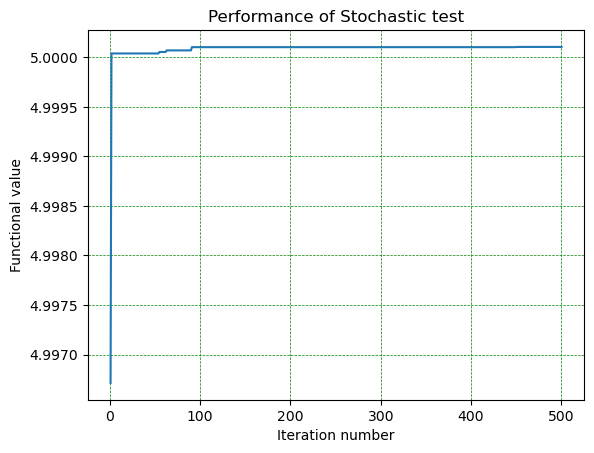

-->Test number 1
Best solution found is:  [3.14181717 3.1414352 ]
And function result for this solution is:  5.000101313410884
Totally elapsed  2.3525995  seconds


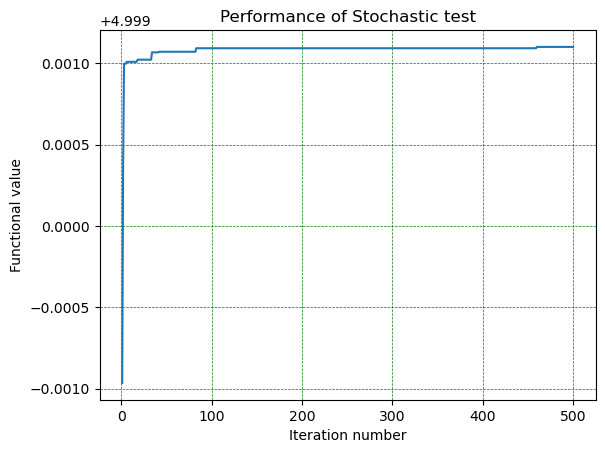

-->Test number 2
Best solution found is:  [3.13986684 3.14129163]
And function result for this solution is:  5.000089729914703
Totally elapsed  2.3146035  seconds


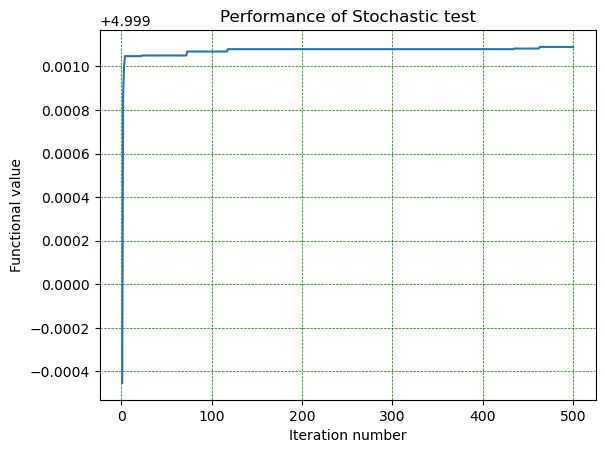

-->Test number 3
Best solution found is:  [3.14110501 3.14220312]
And function result for this solution is:  5.0000945338130895
Totally elapsed  2.3317794  seconds


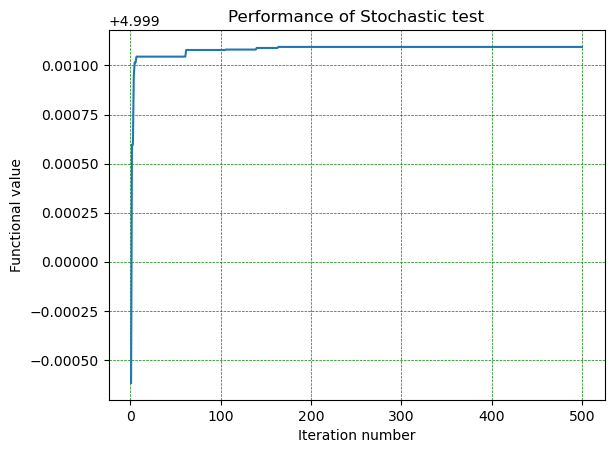

-->Test number 4
Best solution found is:  [3.14097914 3.14096834]
And function result for this solution is:  5.000094057032216
Totally elapsed  2.2967011  seconds


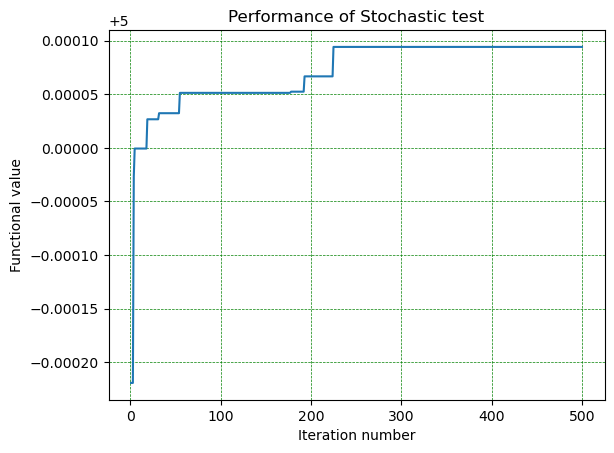

-->Test number 5
Best solution found is:  [3.14199169 3.14248112]
And function result for this solution is:  5.000098272615968
Totally elapsed  2.3214897  seconds


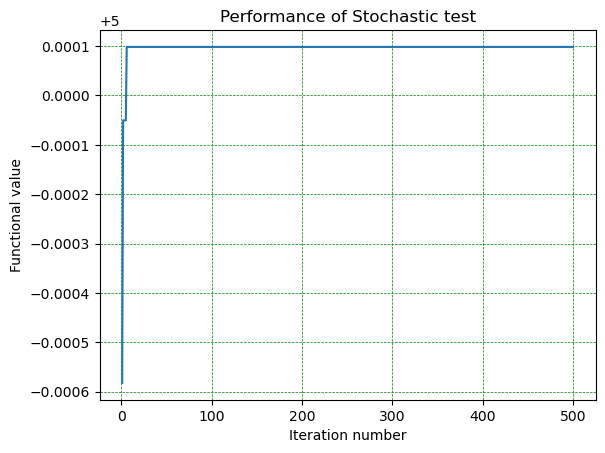

-->Test number 6
Best solution found is:  [3.14233384 3.14122102]
And function result for this solution is:  5.000097988325307
Totally elapsed  2.3443201  seconds


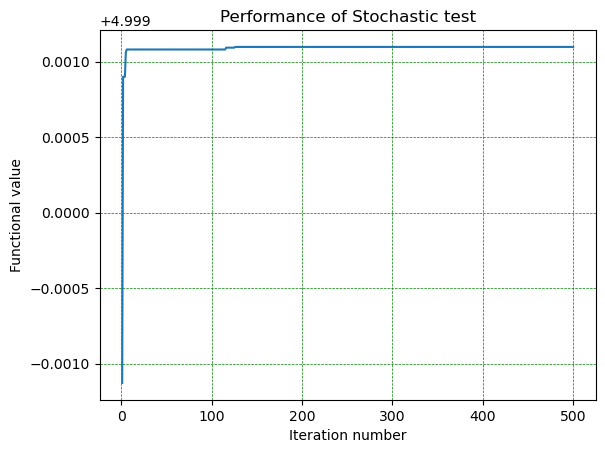

-->Test number 7
Best solution found is:  [3.14277829 3.14103176]
And function result for this solution is:  5.000084216633381
Totally elapsed  2.2210796  seconds


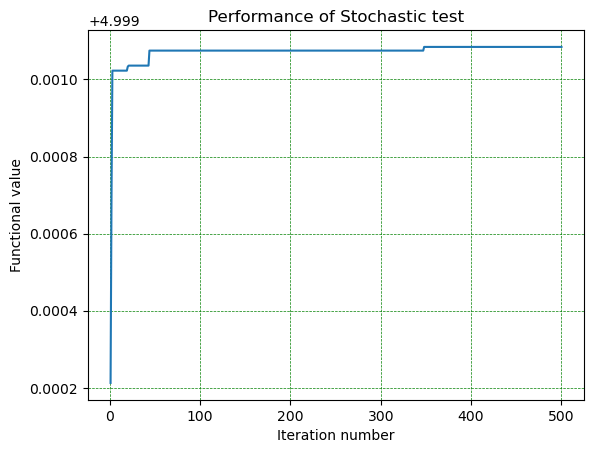

-->Test number 8
Best solution found is:  [3.1413954  3.14052213]
And function result for this solution is:  5.000093020166492
Totally elapsed  2.1443463  seconds


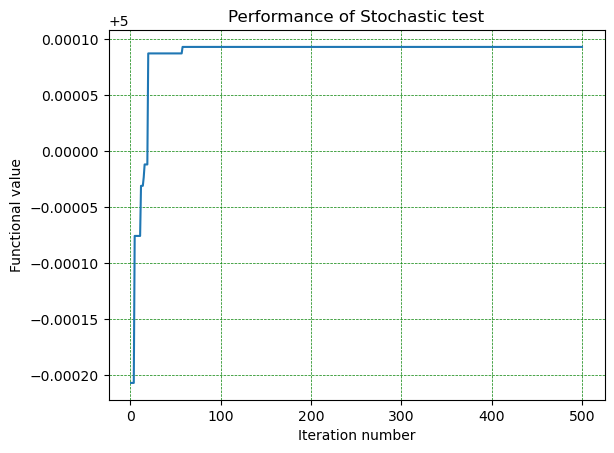

-->Test number 9
Best solution found is:  [3.14138108 3.14167224]
And function result for this solution is:  5.0001007580097
Totally elapsed  2.0784188  seconds


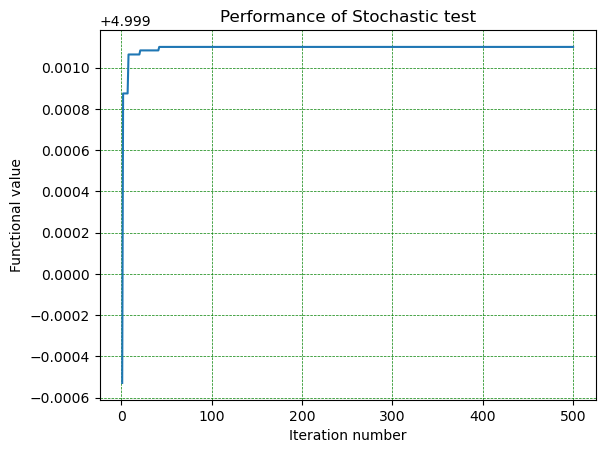

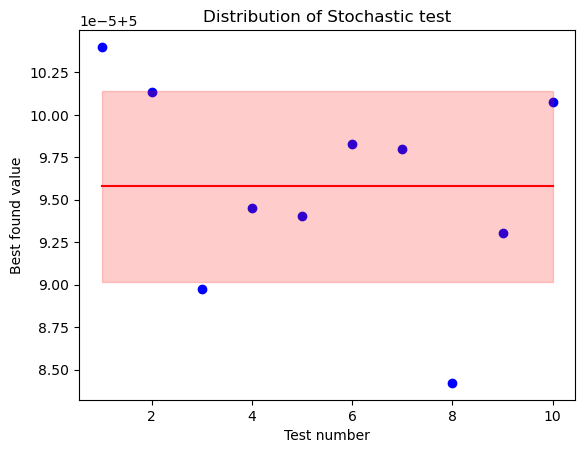

Dispersion is 3.1642677790367315e-11


In [16]:
function_name = "Stochastic test"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_stochastic_test_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test(function_name, stochastic_test, 0.0, 10.0, 100, 500, 0.4, 0.3, draw_graph=True)
    average_stochastic_test_python_time += time_elapsed
    best_values[test_number] = best_value
average_stochastic_test_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Стеблинского

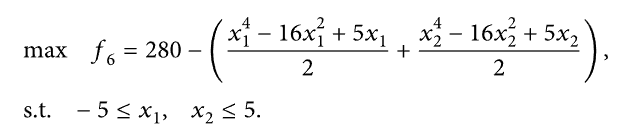

In [17]:
@jit(nopython=True)
def styblinski_function(arguments):
    return 280 - ((arguments[0] ** 4 - 16 * arguments[0] ** 2 + 5 * arguments[
        0]) / 2 + (arguments[1] ** 4 - 16 * arguments[1] ** 2 + 5 * arguments[
        1]) / 2)

-->Test number 0
Best solution found is:  [-2.82158068 -2.86393072]
And function result for this solution is:  358.1926082972762
Totally elapsed  3.0505651  seconds


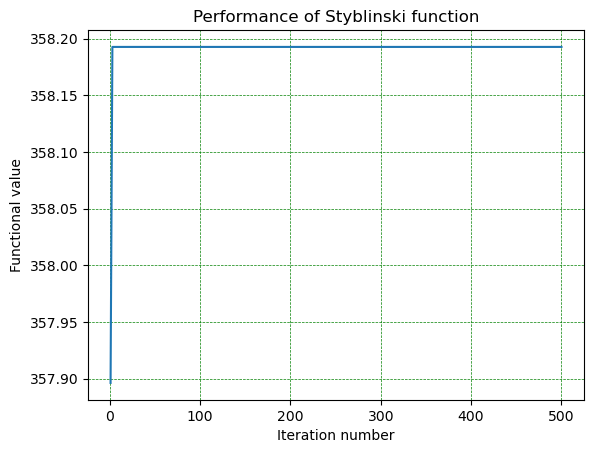

-->Test number 1
Best solution found is:  [-2.86219436 -2.81548649]
And function result for this solution is:  358.1730729422791
Totally elapsed  1.7092021  seconds


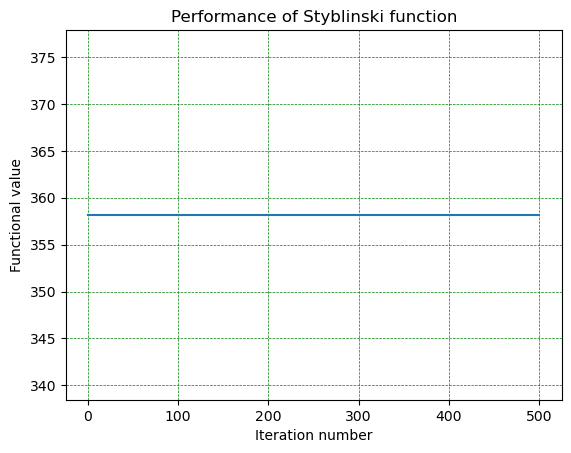

-->Test number 2
Best solution found is:  [-2.81076638 -2.89445953]
And function result for this solution is:  358.186702772746
Totally elapsed  1.9303469  seconds


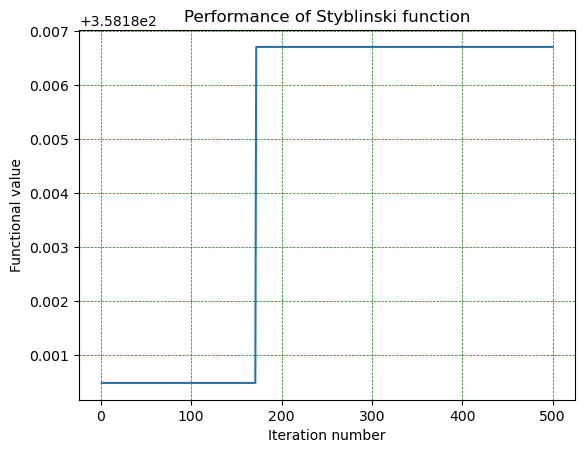

-->Test number 3
Best solution found is:  [-2.82063644 -2.6522858 ]
And function result for this solution is:  357.2153578405401
Totally elapsed  1.6698073  seconds


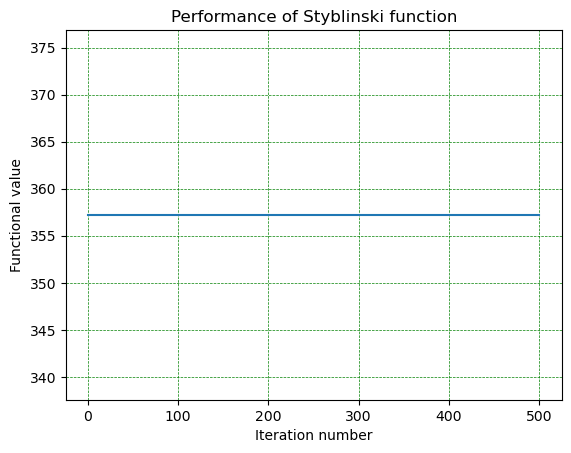

-->Test number 4
Best solution found is:  [-2.86838868 -2.78816085]
And function result for this solution is:  358.0898867774794
Totally elapsed  1.2342131  seconds


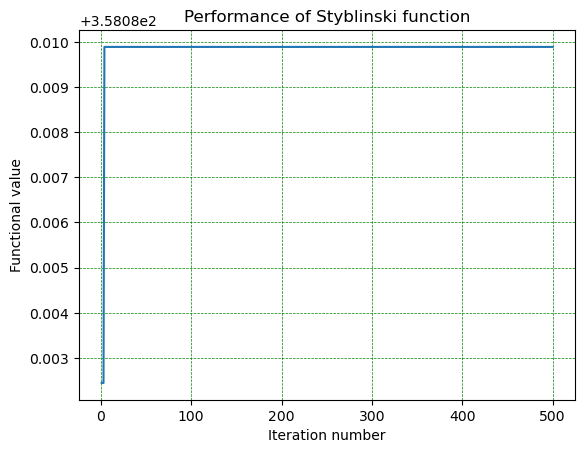

-->Test number 5
Best solution found is:  [-2.81597938 -2.91087046]
And function result for this solution is:  358.2027129386044
Totally elapsed  1.7340941  seconds


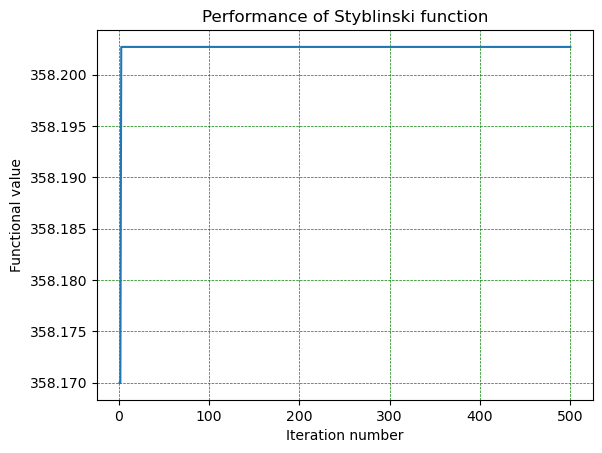

-->Test number 6
Best solution found is:  [-2.80991749 -2.85146522]
And function result for this solution is:  358.1394495049457
Totally elapsed  1.6199697  seconds


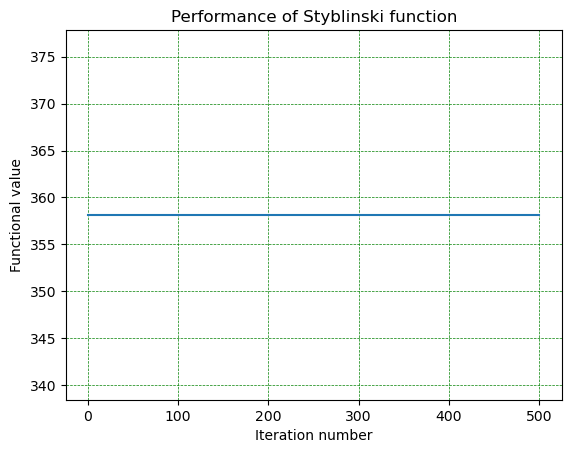

-->Test number 7
Best solution found is:  [-2.77202883 -2.89812701]
And function result for this solution is:  358.0458505853633
Totally elapsed  1.4278246  seconds


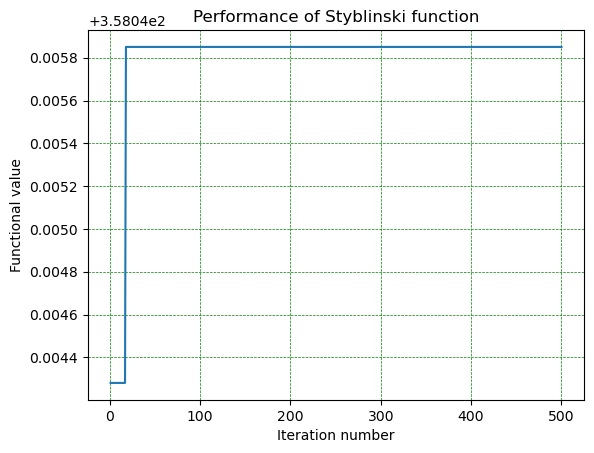

-->Test number 8
Best solution found is:  [-2.8332892  -2.89319236]
And function result for this solution is:  358.2471668984774
Totally elapsed  1.8100561  seconds


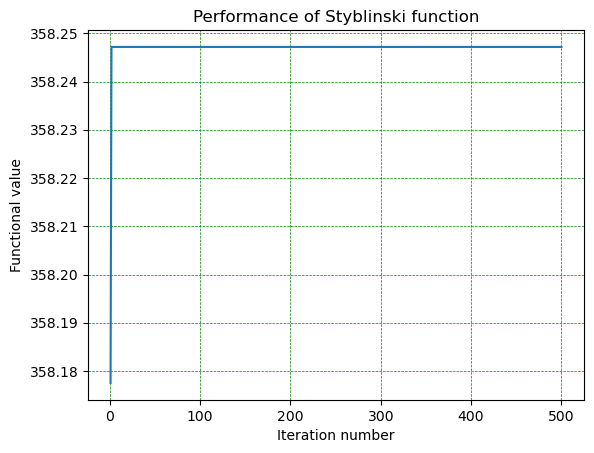

-->Test number 9
Best solution found is:  [-2.87484731 -2.89656279]
And function result for this solution is:  358.31740010925404
Totally elapsed  1.3281551  seconds


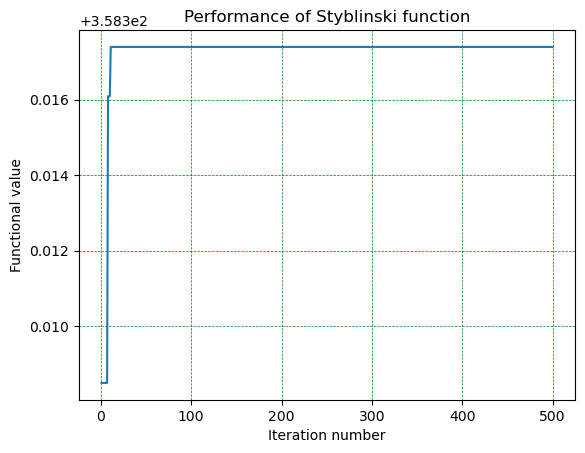

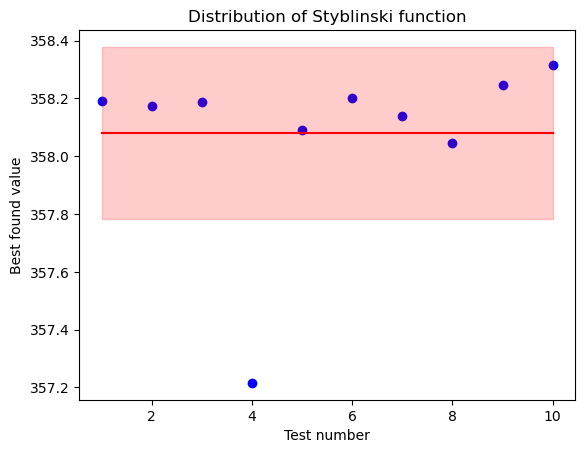

Dispersion is 0.088448454878754


In [18]:
function_name = "Styblinski function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_styblinski_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test(function_name, styblinski_function, -5.0, 5.0, 100, 500, 0.4, 0.3, draw_graph=True)
    average_styblinski_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_styblinski_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Шуберта

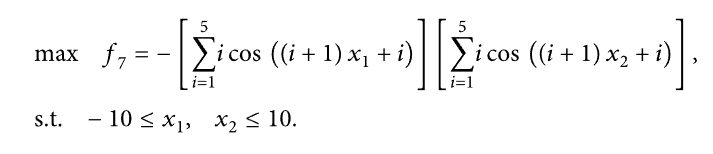

In [6]:
@jit(nopython=True)
def shubert_function(arguments):
    return -1 * sum([i * np.cos((i + 1)*arguments[0] + i) for i in range(1, 6)]) * sum([i * np.cos((i + 1)*arguments[1] + i) for i in range(1, 6)])

-->Test number 0
Best solution found is:  [-1.43527822 -0.76542888]
And function result for this solution is:  183.82581189673294
Totally elapsed  7.0144068  seconds


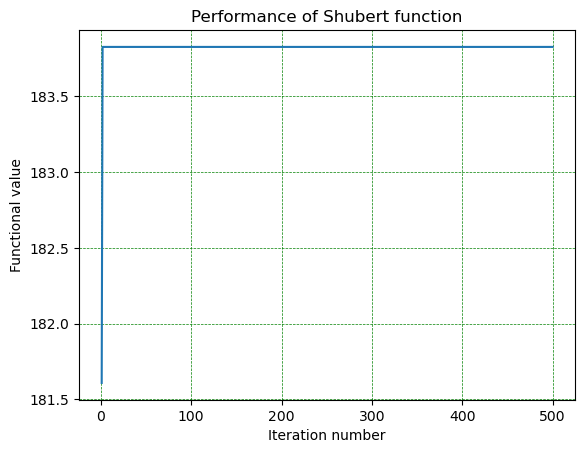

-->Test number 1
Best solution found is:  [-1.39092373  5.56047019]
And function result for this solution is:  171.20037183228928
Totally elapsed  1.6585019  seconds


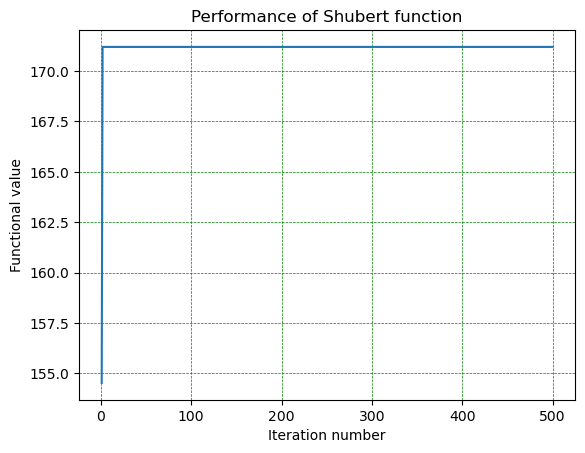

-->Test number 2
Best solution found is:  [-0.79811675 -1.37967502]
And function result for this solution is:  181.86330446171334
Totally elapsed  0.7152862  seconds


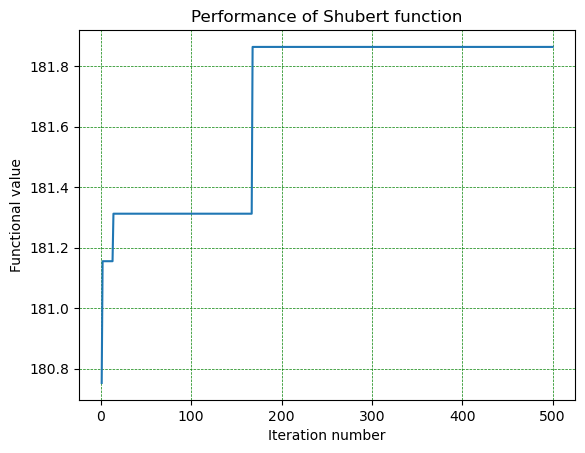

-->Test number 3
Best solution found is:  [-7.06020067 -1.41226   ]
And function result for this solution is:  185.1513572263026
Totally elapsed  1.0281807  seconds


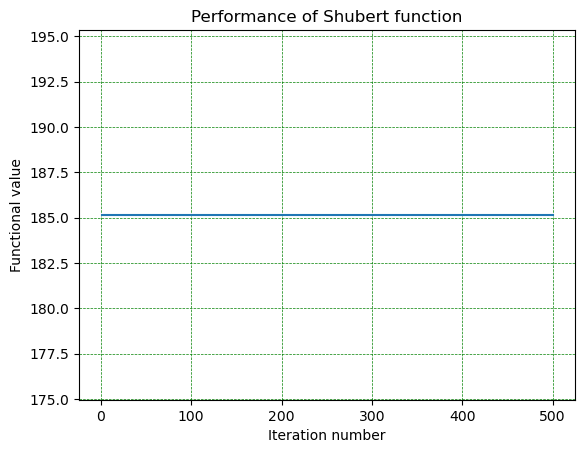

-->Test number 4
Best solution found is:  [ 4.92726654 -0.77605159]
And function result for this solution is:  174.2469040181808
Totally elapsed  1.4757249  seconds


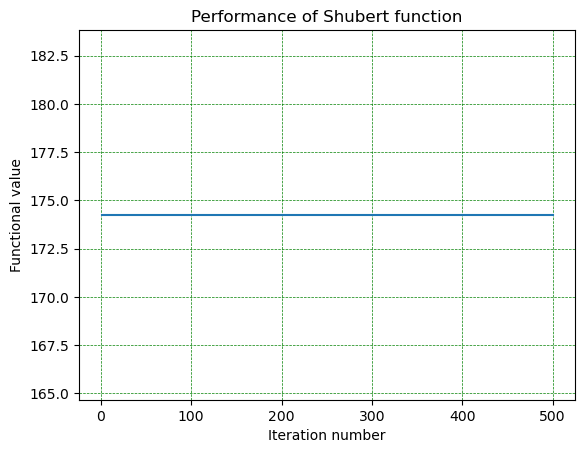

-->Test number 5
Best solution found is:  [4.90132976 5.47365079]
And function result for this solution is:  182.14604951969562
Totally elapsed  1.6695518  seconds


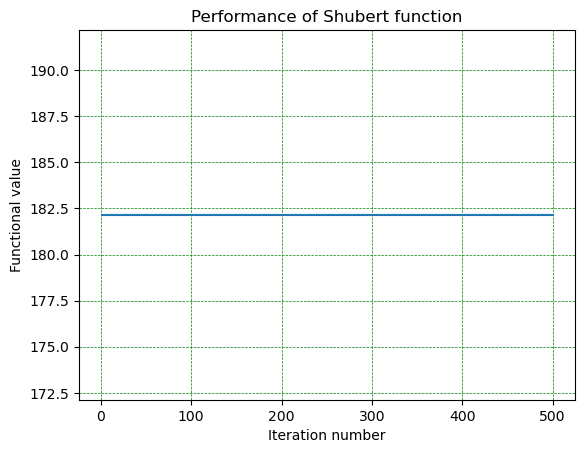

-->Test number 6
Best solution found is:  [ 5.49158132 -7.64052677]
And function result for this solution is:  175.76398620970068
Totally elapsed  1.3581932  seconds


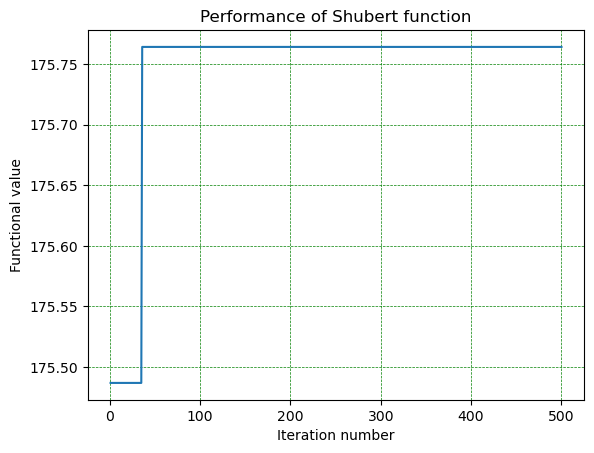

-->Test number 7
Best solution found is:  [ 4.87429163 -0.8065609 ]
And function result for this solution is:  186.02817311698658
Totally elapsed  0.4534637  seconds


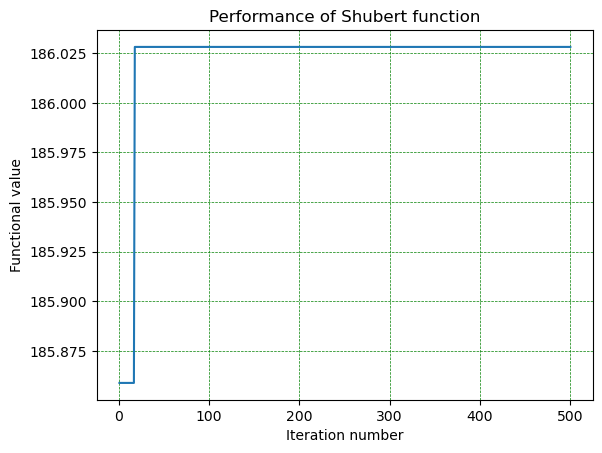

-->Test number 8
Best solution found is:  [-7.01360214  4.85577223]
And function result for this solution is:  176.15239216230512
Totally elapsed  1.7121519  seconds


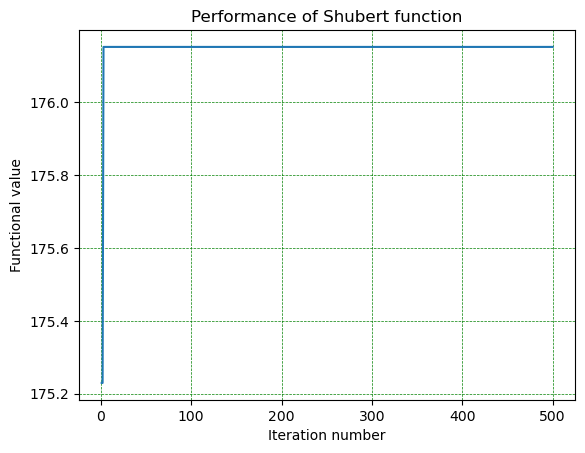

-->Test number 9
Best solution found is:  [-7.69897409 -0.76066664]
And function result for this solution is:  183.08855691950387
Totally elapsed  1.8583408  seconds


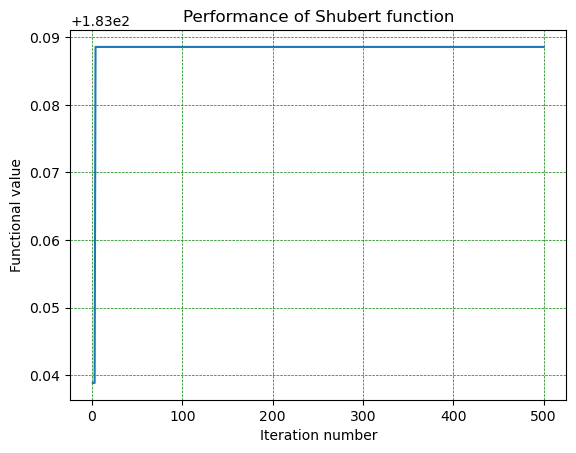

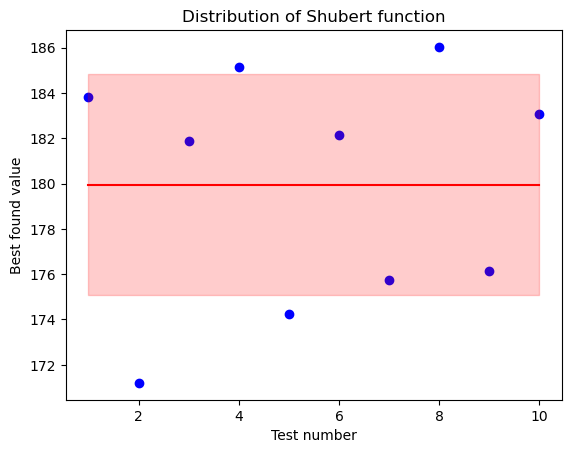

Dispersion is 23.837985436793566


In [88]:
function_name = "Shubert function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_shubert_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test(function_name, shubert_function, -10.0, 10.0, 100, 500, 0.4, 0.3, draw_graph=True)
    average_shubert_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_shubert_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

# Реализация на Си

In [21]:
class Result(ctypes.Structure):
    _fields_ = [
        ("best_solution", ctypes.POINTER(ctypes.c_float)),
        ("best_intensity", ctypes.c_float),
    ]
def c(file, name, types, result):
    path = os.path.abspath(file)
    module = ctypes.cdll.LoadLibrary(path)
    func = module[name]
    func.argtypes = types
    func.restype = result
    return func

MAX_PARTICLES = 100
MAX_DIMENSIONS = 10

#Result firefly_algorithm(float (*function)(float *, int), int dimensions, float bounds_array[MAX_DIMENSIONS][2], int fireflies_number, 
                        #int max_iteration, float alpha, float beta, int random_movement_possibilites)
function_type = ctypes.CFUNCTYPE(ctypes.c_float, ctypes.POINTER(ctypes.c_float))    
firefly_algorithm = c("C:/Users/kd004/Downloads/libcode.dll", "firefly_algorithm", (function_type, ctypes.c_int, (ctypes.c_float * 2) * MAX_DIMENSIONS , ctypes.c_int, ctypes.c_int, ctypes.c_float, ctypes.c_float, ctypes.c_int), Result)

In [22]:
def perform_c_test(function, min_argument, max_argument, fireflies_number, iterations_number, alpha, beta, random_tries_number=100):
    c_objective_function = function_type(function)
    bonds = (ctypes.c_float * 2) * MAX_DIMENSIONS
    bonds = bonds()
    bonds[0][0] = min_argument
    bonds[0][1] = max_argument
    bonds[1][0] = min_argument
    bonds[1][1] = max_argument

    start_time = time.perf_counter_ns()
    result = firefly_algorithm(c_objective_function, 2, bonds, fireflies_number, iterations_number, alpha, beta, random_tries_number)
    time_elapsed = time.perf_counter_ns() - start_time
    best_solution = [result.best_solution[i] for i in range(2)]
    print("Best solution found is: ", best_solution)
    print("And function result for this solution is: ", result.best_intensity)
    print("Totally elapsed ", time_elapsed/1_000_000_000, " seconds")
    
    return result.best_intensity, time_elapsed / 1_000_000_000

## Тестирование функции Де Джонга

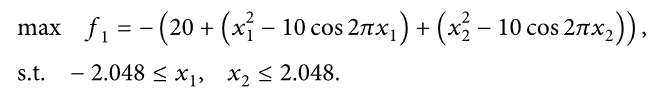

In [23]:
def second_de_jong_function(arguments):
    return -1.0 * ( 20 + (np.power(arguments[0], 2) - 10*(np.cos(2*np.pi * arguments[0]))) + (np.power(arguments[1], 2) - 10*(np.cos(2*np.pi * arguments[1]))))

-->Test number 0
Best solution found is:  [0.011055193841457367, 0.08389995992183685]
And function result for this solution is:  -1.388878345489502
Totally elapsed  3.0106579  seconds
-->Test number 1
Best solution found is:  [0.056607868522405624, -0.0023759230971336365]
And function result for this solution is:  -0.6302173137664795
Totally elapsed  1.9338015  seconds
-->Test number 2
Best solution found is:  [0.9965574741363525, 0.0026881371159106493]
And function result for this solution is:  -0.9968995451927185
Totally elapsed  4.3000872  seconds
-->Test number 3
Best solution found is:  [0.0014773029834032059, 0.017461583018302917]
And function result for this solution is:  -0.060863737016916275
Totally elapsed  0.8724591  seconds
-->Test number 4
Best solution found is:  [0.029774848371744156, 0.011798654682934284]
And function result for this solution is:  -0.20297826826572418
Totally elapsed  1.2678509  seconds
-->Test number 5
Best solution found is:  [0.054271068423986435, -0

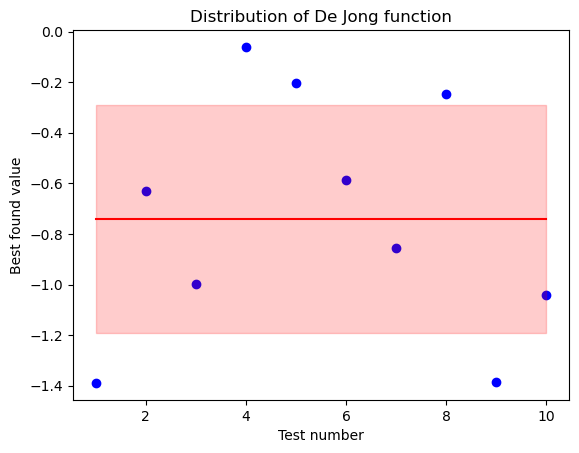

Dispersion is 0.20346522156860622


In [24]:
function_name = "De Jong function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_de_jong_function_c_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_c_test(second_de_jong_function, -2.048, 2.048, 100, 500, 0.4, 0.3)
    average_de_jong_function_c_time += time_elapsed
    best_values[test_number] = best_value
average_de_jong_function_c_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Есома

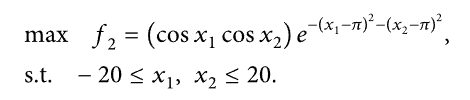

In [25]:
def esom_function(arguments):
    return (np.cos(arguments[0]) * np.cos(arguments[1]) * np.exp(
        -1 * np.power((arguments[0] - np.pi), 2) - np.power(
            (arguments[1] - np.pi), 2)))

-->Test number 0
Best solution found is:  [3.2323246002197266, 3.854159116744995]
And function result for this solution is:  0.4498184025287628
Totally elapsed  0.7355059  seconds
-->Test number 1
Best solution found is:  [3.2323246002197266, 3.854159116744995]
And function result for this solution is:  0.4498184025287628
Totally elapsed  0.7448276  seconds
-->Test number 2
Best solution found is:  [3.1319549083709717, 3.7622978687286377]
And function result for this solution is:  0.553295910358429
Totally elapsed  0.7286552  seconds
-->Test number 3
Best solution found is:  [4.980791091918945, 1.3741631507873535]
And function result for this solution is:  7.739175634924322e-05
Totally elapsed  0.7511983  seconds
-->Test number 4
Best solution found is:  [3.200901508331299, 4.129857063293457]
And function result for this solution is:  0.20607268810272217
Totally elapsed  0.737734  seconds
-->Test number 5
Best solution found is:  [3.200901508331299, 4.129857063293457]
And function resu

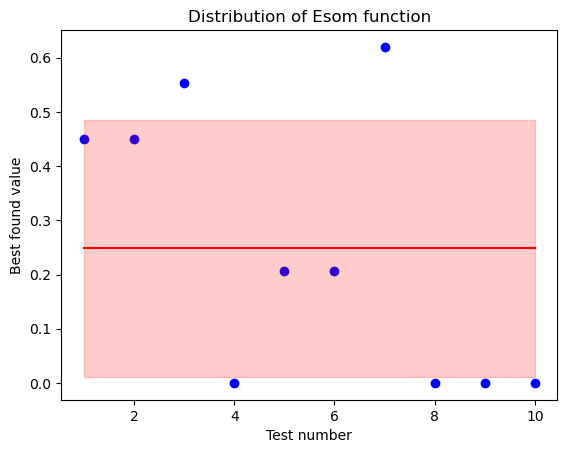

Dispersion is 0.05624545068826834


In [26]:
function_name = "Esom function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_esom_function_c_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_c_test(esom_function, -20.0, 20.0, 100, 500, 0.4, 0.3)
    average_esom_function_c_time += time_elapsed
    best_values[test_number] = best_value
average_esom_function_c_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Прерывистый тест

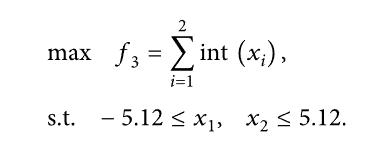

In [27]:
def discontinuous_test(arguments):
    return int(arguments[0]) + int(arguments[1])

-->Test number 0
Best solution found is:  [5.119999885559082, 5.119999885559082]
And function result for this solution is:  10.0
Totally elapsed  2.6630258  seconds
-->Test number 1
Best solution found is:  [5.119999885559082, 5.119999885559082]
And function result for this solution is:  10.0
Totally elapsed  2.6160743  seconds
-->Test number 2
Best solution found is:  [5.119999885559082, 5.119999885559082]
And function result for this solution is:  10.0
Totally elapsed  2.6048684  seconds
-->Test number 3
Best solution found is:  [5.119999885559082, 5.119999885559082]
And function result for this solution is:  10.0
Totally elapsed  2.6446242  seconds
-->Test number 4
Best solution found is:  [5.119999885559082, 5.119999885559082]
And function result for this solution is:  10.0
Totally elapsed  2.5972736  seconds
-->Test number 5
Best solution found is:  [5.119999885559082, 5.119999885559082]
And function result for this solution is:  10.0
Totally elapsed  2.6155689  seconds
-->Test nu

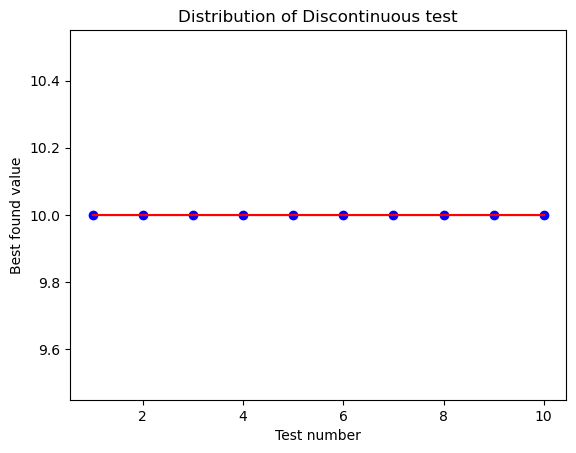

Dispersion is 0.0


In [28]:
function_name = "Discontinuous test"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_discontinuous_test_c_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_c_test(discontinuous_test, -5.12, 5.12, 100, 500, 0.4, 0.3)
    average_discontinuous_test_c_time += time_elapsed
    best_values[test_number] = best_value
average_discontinuous_test_c_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Мишры

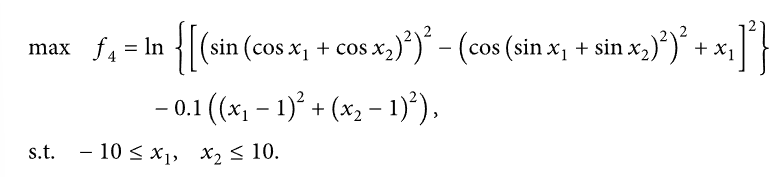

In [29]:
def mishra_function(arguments):
    return np.log(
        np.power((
                np.power(np.sin(
                    np.power((np.cos(arguments[0]) + np.cos(arguments[1])), 2)),
                    2) - np.power(
            np.cos(np.power((np.sin(arguments[0]) + np.sin(arguments[1])), 2)),
            2) + arguments[0]
        ), 2)
    ) - 0.1 * (np.power(arguments[0] - 1, 2) + np.power(arguments[1] - 1, 2))

-->Test number 0
Best solution found is:  [2.887404441833496, 1.8239672183990479]
And function result for this solution is:  2.283942222595215
Totally elapsed  19.2387273  seconds
-->Test number 1
Best solution found is:  [2.8865692615509033, 1.8232789039611816]
And function result for this solution is:  2.283949613571167
Totally elapsed  18.8062559  seconds
-->Test number 2
Best solution found is:  [2.8870465755462646, 1.8230690956115723]
And function result for this solution is:  2.2839484214782715
Totally elapsed  21.117546  seconds
-->Test number 3
Best solution found is:  [2.886326313018799, 1.8227068185806274]
And function result for this solution is:  2.2839488983154297
Totally elapsed  18.4577797  seconds
-->Test number 4
Best solution found is:  [2.8888211250305176, 1.8223795890808105]
And function result for this solution is:  2.283933401107788
Totally elapsed  20.7265477  seconds
-->Test number 5
Best solution found is:  [2.884915590286255, 1.8235986232757568]
And function r

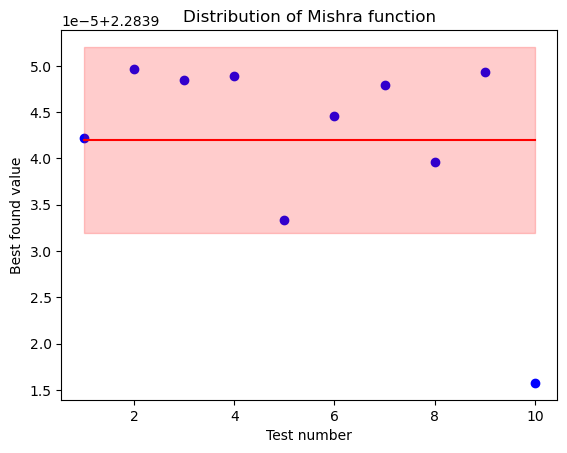

Dispersion is 1.011699168884661e-10


In [30]:
function_name = "Mishra function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_mishra_function_c_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_c_test(mishra_function, -10.0, 10.0, 100, 500, 0.4, 0.3)
    average_mishra_function_c_time += time_elapsed
    best_values[test_number] = best_value
average_mishra_function_c_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Стохастический тест

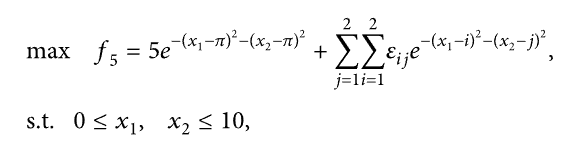

In [31]:
def stochastic_test(arguments):
    return 5 * np.exp(-1*np.power((arguments[0] - np.pi), 2) - np.power((arguments[1] - np.pi), 2)) + sum([np.random.rand() * np.exp(-1*np.power((arguments[0] - i), 2) - np.power((arguments[1] - j), 2)) for i in range(2) for j in range(2)])

-->Test number 0
Best solution found is:  [3.1414506435394287, 3.141256332397461]
And function result for this solution is:  5.000089645385742
Totally elapsed  68.8353771  seconds
-->Test number 1
Best solution found is:  [3.1422858238220215, 3.141862630844116]
And function result for this solution is:  5.000092506408691
Totally elapsed  72.4190813  seconds
-->Test number 2
Best solution found is:  [3.1425769329071045, 3.141309976577759]
And function result for this solution is:  5.000093936920166
Totally elapsed  71.9378184  seconds
-->Test number 3
Best solution found is:  [3.140676736831665, 3.1415371894836426]
And function result for this solution is:  5.000094413757324
Totally elapsed  72.2368077  seconds
-->Test number 4
Best solution found is:  [3.1419482231140137, 3.1424155235290527]
And function result for this solution is:  5.000097751617432
Totally elapsed  70.1151217  seconds
-->Test number 5
Best solution found is:  [3.1411757469177246, 3.142550230026245]
And function resu

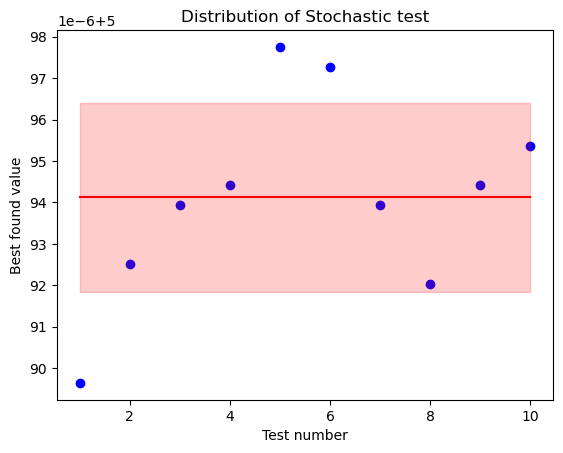

Dispersion is 5.193214747123421e-12


In [32]:
function_name = "Stochastic test"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_stochastic_test_c_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_c_test(stochastic_test, 0.0, 10.0, 100, 500, 0.4, 0.3)
    average_stochastic_test_c_time += time_elapsed
    best_values[test_number] = best_value
average_stochastic_test_c_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Стеблинского

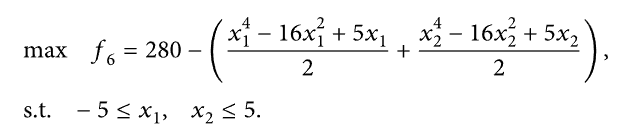

In [33]:
def styblinski_function(arguments):
    return 280 - ((arguments[0] ** 4 - 16 * arguments[0] ** 2 + 5 * arguments[
        0]) / 2 + (arguments[1] ** 4 - 16 * arguments[1] ** 2 + 5 * arguments[
        1]) / 2)

-->Test number 0
Best solution found is:  [-2.6459250450134277, -2.8451364040374756]
And function result for this solution is:  357.2240905761719
Totally elapsed  3.6459445  seconds
-->Test number 1
Best solution found is:  [-2.8966786861419678, -2.7891383171081543]
And function result for this solution is:  358.11383056640625
Totally elapsed  4.2716774  seconds
-->Test number 2
Best solution found is:  [-2.4101431369781494, -2.909959077835083]
And function result for this solution is:  354.79010009765625
Totally elapsed  4.5398614  seconds
-->Test number 3
Best solution found is:  [-2.7746222019195557, -2.9088969230651855]
And function result for this solution is:  358.0567932128906
Totally elapsed  3.7046726  seconds
-->Test number 4
Best solution found is:  [-2.8182549476623535, -2.437969923019409]
And function result for this solution is:  355.02471923828125
Totally elapsed  4.170659  seconds
-->Test number 5
Best solution found is:  [-2.7364695072174072, -2.9021847248077393]
And f

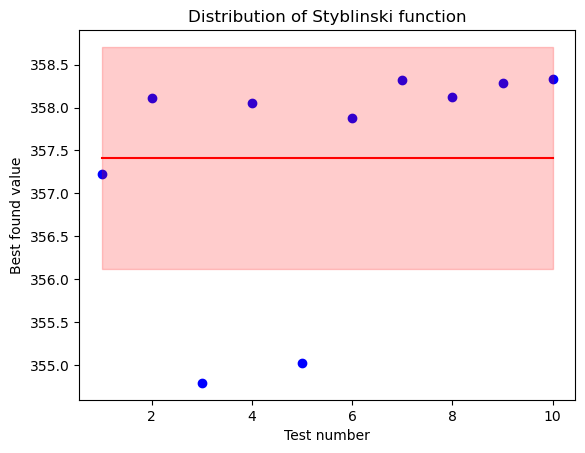

Dispersion is 1.668799107298255


In [34]:
function_name = "Styblinski function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_styblinski_function_c_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_c_test(styblinski_function, -5.0, 5.0, 100, 500, 0.4, 0.3)
    average_styblinski_function_c_time += time_elapsed
    best_values[test_number] = best_value
average_styblinski_function_c_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Шуберта

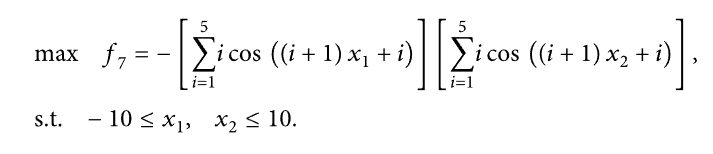

In [35]:
def shubert_function(arguments):
    return -1 * sum([i * np.cos((i + 1)*arguments[0] + i) for i in range(1, 6)]) * sum([i * np.cos((i + 1)*arguments[1] + i) for i in range(1, 6)])

-->Test number 0
Best solution found is:  [-1.4166327714920044, -7.0687947273254395]
And function result for this solution is:  186.085693359375
Totally elapsed  7.3035049  seconds
-->Test number 1
Best solution found is:  [-1.3922934532165527, -0.7775160074234009]
And function result for this solution is:  183.07118225097656
Totally elapsed  3.9391663  seconds
-->Test number 2
Best solution found is:  [-1.3758337497711182, 5.4837870597839355]
And function result for this solution is:  181.01475524902344
Totally elapsed  6.5745752  seconds
-->Test number 3
Best solution found is:  [-1.3965286016464233, 5.505435943603516]
And function result for this solution is:  183.70248413085938
Totally elapsed  7.7068851  seconds
-->Test number 4
Best solution found is:  [5.500401020050049, -1.4224493503570557]
And function result for this solution is:  186.0368194580078
Totally elapsed  3.4114869  seconds
-->Test number 5
Best solution found is:  [-7.063461780548096, -7.702006816864014]
And functi

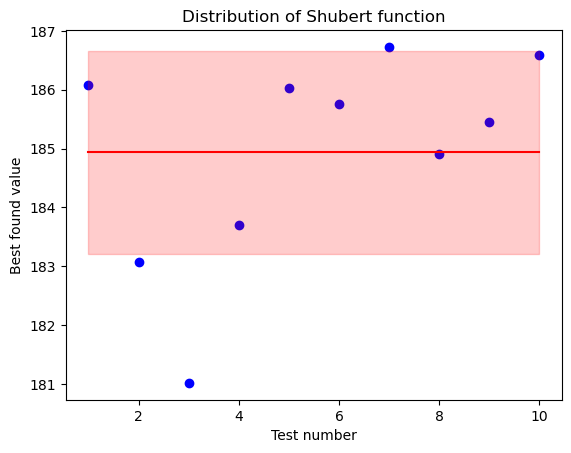

Dispersion is 2.9784825824224384


In [36]:
function_name = "Shubert function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_shubert_function_c_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_c_test(shubert_function, -10.0, 10.0, 100, 500, 0.4, 0.3)
    average_shubert_function_c_time += time_elapsed
    best_values[test_number] = best_value
average_shubert_function_c_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

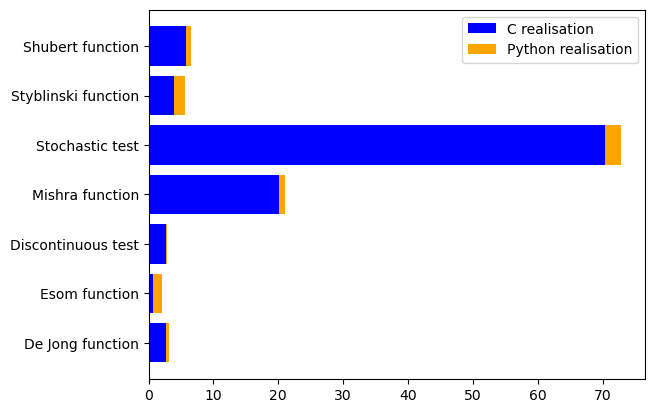

In [37]:
c_times_array = np.array([average_de_jong_function_c_time,
                      average_esom_function_c_time,
                      average_discontinuous_test_c_time,
                      average_mishra_function_c_time,
                      average_stochastic_test_c_time,
                      average_styblinski_function_c_time,
                      average_shubert_function_c_time])
python_times_array = [average_de_jong_function_python_time,
                      average_esom_function_python_time,
                      average_discontinuous_test_python_time,
                      average_mishra_function_python_time,
                      average_stochastic_test_python_time,
                      average_styblinski_function_python_time,
                      average_shubert_function_python_time]
ax1 = plt.subplot()
ax1.set_yticks([1, 2, 3, 4, 5, 6, 7])
ax1.set_yticklabels(["De Jong function",
"Esom function",
"Discontinuous test",
"Mishra function",
"Stochastic test",
"Styblinski function",
"Shubert function"])
ax1.barh([1, 2, 3, 4, 5, 6, 7], c_times_array, color="blue", label="C realisation")
ax1.barh([1, 2, 3, 4, 5, 6, 7], python_times_array, left=c_times_array, color="orange", label="Python realisation")
plt.legend(loc="upper right")

plt.show()

# Модификация Фурлеба

In [60]:
# Boys look for max, girls for minimum
# Discordance = boys/fireflies_number -> can modify to which part algorithm will go better

@jit(nopython=True)
def firefly_algorithm_furleb_modification(function, dimensions, bounds_array,
                                          fireflies_number,
                                          max_iteration, alpha, beta,
                                          discordance,
                                          random_movement_possibilities=10):
    # Initialize the swarm:
    boys_amount = fireflies_number * discordance
    # Firefly is a boy is it's number is < boys_amount
    fireflies = []

    for firefly_number in range(fireflies_number):
        new_firefly = []
        for dimension_number in range(dimensions):
            parameter = np.random.uniform(bounds_array[dimension_number][0],
                                          bounds_array[dimension_number][1])
            new_firefly.append(parameter)
        fireflies.append(new_firefly)

    fireflies = np.array(fireflies)
    intensities = []

    for firefly in fireflies:
        intensities.append(function(firefly))
    intensities = np.array(intensities)
    # print(fireflies)

    best_max_values = np.array([0.0 for i in range(max_iteration)])
    best_min_values = np.array([0.0 for i in range(max_iteration)])

    # Main loop
    for iteration in range(max_iteration):
        for i in range(fireflies_number):
            is_boy = (i < boys_amount)
            if is_boy and intensities[i] == np.max(
                    intensities):  # Boy with a max intensity
                for random_try in range(random_movement_possibilities):
                    random_direction = np.random.rand(dimensions)
                    new_possible_position = fireflies[
                                                i] + alpha * random_direction
                    for dimension_number in range(dimensions):
                        if new_possible_position[dimension_number] > \
                                bounds_array[dimension_number][1]:
                            new_possible_position[dimension_number] = \
                                bounds_array[dimension_number][1]
                        elif new_possible_position[dimension_number] < \
                                bounds_array[dimension_number][0]:
                            new_possible_position[dimension_number] = \
                                bounds_array[dimension_number][0]
                    new_possible_intensity = function(new_possible_position)
                    if new_possible_intensity > intensities[i]:
                        # If new position is brighter
                        fireflies[i] = new_possible_position
                        intensities[i] = new_possible_intensity
                        break
                continue
            elif not is_boy and intensities[i] == np.min(
                    intensities):  # Girl with min intensity
                for random_try in range(random_movement_possibilities):
                    random_direction = np.random.rand(dimensions)
                    new_possible_position = fireflies[
                                                i] + alpha * random_direction
                    for dimension_number in range(dimensions):
                        if new_possible_position[dimension_number] > \
                                bounds_array[dimension_number][1]:
                            new_possible_position[dimension_number] = \
                                bounds_array[dimension_number][1]
                        elif new_possible_position[dimension_number] < \
                                bounds_array[dimension_number][0]:
                            new_possible_position[dimension_number] = \
                                bounds_array[dimension_number][0]
                    new_possible_intensity = function(new_possible_position)
                    if new_possible_intensity < intensities[i]:
                        # If new position is less bright
                        fireflies[i] = new_possible_position
                        intensities[i] = new_possible_intensity
                        break
                continue
            for j in range(fireflies_number):
                if is_boy and j < boys_amount:  # They both are boys and we will check the condition
                    if intensities[j] > intensities[i]:  # Moving firefly
                        distance = np.sum(
                            np.square(fireflies[i] - fireflies[j]),
                            axis=-1)
                        a0 = intensities[j] / intensities[i] if \
                            intensities[i] != 0.0 else 1.0
                        new_position = fireflies[i] + a0 * np.exp(
                            -beta * distance) * (
                                               fireflies[j] - fireflies[i]) + (
                                               alpha * np.random.rand(
                                           dimensions))
                        for dimension_number in range(dimensions):
                            if new_position[dimension_number] > \
                                    bounds_array[dimension_number][1]:
                                new_position[dimension_number] = \
                                    bounds_array[dimension_number][1]
                            elif new_position[dimension_number] < \
                                    bounds_array[dimension_number][0]:
                                new_position[dimension_number] = \
                                    bounds_array[dimension_number][0]
                        fireflies[i] = new_position
                        intensities[i] = function(new_position)
                elif is_boy and j > boys_amount:  # It's a boy and we saw a girl - going away from her
                    if intensities[i] == np.max(
                            intensities):
                        continue
                    distance = np.sum(
                        np.square(fireflies[i] - fireflies[j]),
                        axis=-1)
                    a0 = intensities[j] / intensities[i] if \
                        intensities[i] != 0.0 else 1.0
                    new_position = fireflies[i] - a0 * np.exp(
                        -beta * distance) * (
                                           fireflies[j] - fireflies[i]) - (
                                           alpha * np.random.rand(
                                       dimensions))
                    for dimension_number in range(dimensions):
                        if new_position[dimension_number] > \
                                bounds_array[dimension_number][1]:
                            new_position[dimension_number] = \
                                bounds_array[dimension_number][1]
                        elif new_position[dimension_number] < \
                                bounds_array[dimension_number][0]:
                            new_position[dimension_number] = \
                                bounds_array[dimension_number][0]
                    fireflies[i] = new_position
                    intensities[i] = function(new_position)
                elif not is_boy and j < boys_amount:  # It's a girl and we see a boy - going away from him
                    if intensities[i] == np.min(
                            intensities):
                        continue
                    distance = np.sum(
                        np.square(fireflies[i] - fireflies[j]),
                        axis=-1)
                    a0 = intensities[i] / intensities[j] if \
                        intensities[j] != 0.0 else 1.0
                    new_position = fireflies[i] - a0 * np.exp(
                        -beta * distance) * (
                                           fireflies[j] - fireflies[i]) - (
                                           alpha * np.random.rand(
                                       dimensions))
                    for dimension_number in range(dimensions):
                        if new_position[dimension_number] > \
                                bounds_array[dimension_number][1]:
                            new_position[dimension_number] = \
                                bounds_array[dimension_number][1]
                        elif new_position[dimension_number] < \
                                bounds_array[dimension_number][0]:
                            new_position[dimension_number] = \
                                bounds_array[dimension_number][0]
                    fireflies[i] = new_position
                    intensities[i] = function(new_position)
                else:  # It's a girl and we saw a girl - going to her
                    if intensities[j] < intensities[i]:  # Moving firefly
                        distance = np.sum(
                            np.square(fireflies[i] - fireflies[j]),
                            axis=-1)
                        a0 = intensities[i] / intensities[j] if \
                            intensities[j] != 0.0 else 1.0
                        new_position = fireflies[i] + a0 * np.exp(
                            -beta * distance) * (
                                               fireflies[j] - fireflies[i]) + (
                                               alpha * np.random.rand(
                                           dimensions))
                        for dimension_number in range(dimensions):
                            if new_position[dimension_number] > \
                                    bounds_array[dimension_number][1]:
                                new_position[dimension_number] = \
                                    bounds_array[dimension_number][1]
                            elif new_position[dimension_number] < \
                                    bounds_array[dimension_number][0]:
                                new_position[dimension_number] = \
                                    bounds_array[dimension_number][0]
                        fireflies[i] = new_position
                        intensities[i] = function(new_position)

        best_max_values[iteration] = np.max(intensities)
        best_min_values[iteration] = np.min(intensities)
        # If we didn't find any better direction, we left this firefly

    best_max_intensity = intensities[0]
    best_max_solution = fireflies[0]
    best_min_intensity = intensities[0]
    best_min_solution = fireflies[0]

    for number, intensity in enumerate(intensities):
        if intensity > best_max_intensity:
            best_max_intensity = intensity
            best_max_solution = fireflies[number]
        elif intensity < best_min_intensity:
            best_min_intensity = intensity
            best_min_solution = fireflies[number]

    return best_max_intensity, best_max_solution, best_min_intensity, best_min_solution, best_max_values, best_min_values

In [9]:
def draw_comparsion_graphic(best_values_original, best_values_furleb, iterations_number, function_name):
    x = np.array([i for i in range(1, iterations_number + 1)])
    plt.title("Performance of " + function_name)
    plt.xlabel("Iteration number")
    plt.ylabel("Functional value")
    plt.plot(x, best_values_original, color="blue", label="Original modification")
    plt.plot(x, best_values_furleb, color="red", label="Furleb modification")
    plt.grid(color="green", linestyle="--", linewidth=0.5)
    plt.legend(loc="upper right")
    plt.show()

In [39]:
def draw_graphic_furleb_modification(best_values, min_values, iterations_number, function_name):
    x = np.array([i for i in range(1, iterations_number + 1)])
    plt.title("Performance of " + function_name)
    plt.xlabel("Iteration number")
    plt.ylabel("Functional value")
    plt.plot(x, best_values, color="red", label="Max value")
    plt.plot(x, min_values, color="blue", label="Min value")
    plt.grid(color="green", linestyle="--", linewidth=0.5)
    plt.legend(loc="upper right")
    plt.show()

In [46]:
def perform_test_furleb_modification(function_name, function, min_argument, max_argument, fireflies_number, iterations_number, alpha, beta, discordance, draw_graph=True):
    bonds = [(min_argument, max_argument), (min_argument, max_argument)]

    start_time = time.perf_counter_ns()
    best_max_intensity, best_max_solution, best_min_intensity, best_min_solution, best_max_values, best_min_values = firefly_algorithm_furleb_modification(function, 2,
                                                      np.array(bonds),
                                                      fireflies_number, iterations_number, alpha, beta, discordance)
    time_elapsed = time.perf_counter_ns() - start_time
    print("Best max solution found is: ", best_max_solution)
    print("And function result for this solution is: ", best_max_intensity)
    print("Best min solution found is: ", best_min_solution)
    print("And function result for this solution is: ", best_min_intensity)
    print("Totally elapsed ", time_elapsed / 1_000_000_000, " seconds")
    if draw_graph:
        draw_graphic_furleb_modification(best_max_values, best_min_values, iterations_number, function_name)
    return best_max_intensity, time_elapsed / 1_000_000_000

In [47]:
def perform_comparsion_test(function_name, function, min_argument, max_argument, fireflies_number, iterations_number, alpha, beta, discordance, draw_graph=True):
    bonds = [(min_argument, max_argument), (min_argument, max_argument)]
    
    start_time_furleb = time.perf_counter_ns()
    best_max_intensity, best_max_solution, best_min_intensity, best_min_solution, best_max_values, best_min_values = firefly_algorithm_furleb_modification(function, 2,
                                                      np.array(bonds),
                                                      fireflies_number, iterations_number, alpha, beta, discordance)
    time_elapsed_furleb = time.perf_counter_ns() - start_time_furleb
    start_time = time.perf_counter_ns()
    best_solution, best_intensity, best_values = firefly_algorithm(function, 2,
                                                      np.array(bonds),
                                                      fireflies_number, iterations_number, alpha, beta)
    time_elapsed = time.perf_counter_ns() - start_time
    print("Best solution found by original is: ", best_solution)
    print("And function result for this solution is: ", best_intensity)
    print("Totally elapsed for original ", time_elapsed / 1_000_000_000, " seconds")
    
    print("Best solution found by furleb modification is: ", best_max_intensity)
    print("And function result for this solution is: ", best_max_solution)
    print("Totally elapsed for furleb modification ", time_elapsed_furleb / 1_000_000_000, " seconds")
    
    if draw_graph:
        draw_comparsion_graphic(best_values, best_max_values, iterations_number, function_name)

Best max solution found is:  [-1.42708672 -0.79985579]
And function result for this solution is:  186.721497814776
Best min solution found is:  [-7.08287625 -0.80523657]
And function result for this solution is:  -210.42108145694095
Totally elapsed  1.4884182  seconds


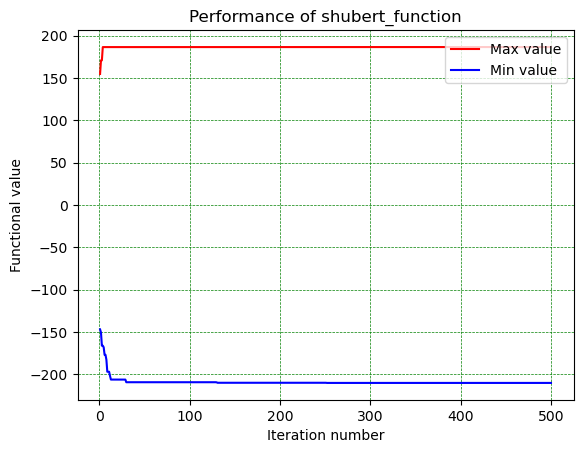

Best max solution found is:  [-7.08148941  4.85815248]
And function result for this solution is:  186.7219000426985
Best min solution found is:  [-7.08060186 -7.07847746]
And function result for this solution is:  -210.39834877860173
Totally elapsed  1.6172565  seconds


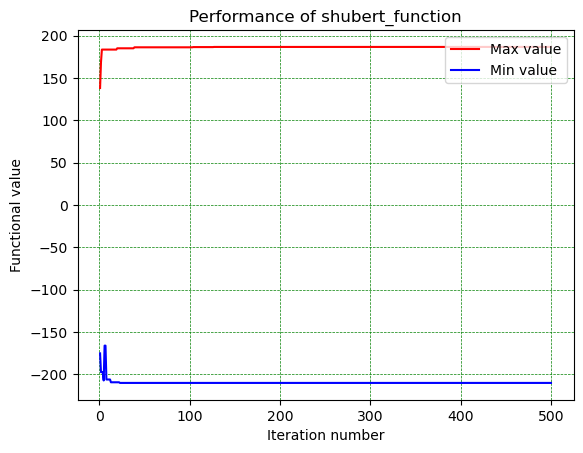

Best max solution found is:  [ 4.85512709 -0.79848905]
And function result for this solution is:  186.7035069429328
Best min solution found is:  [ 5.48934417 -7.08422375]
And function result for this solution is:  -210.37652743337648
Totally elapsed  1.4192518  seconds


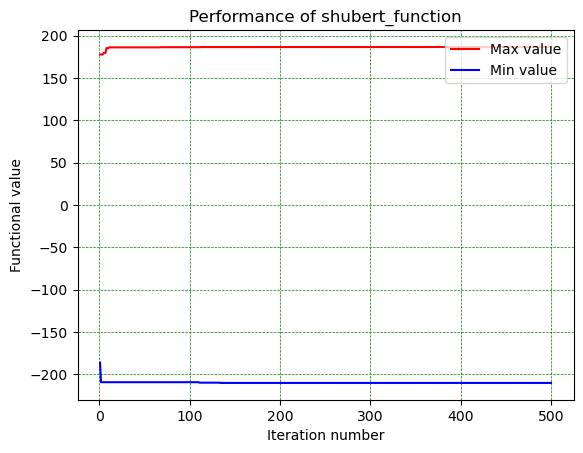

Best max solution found is:  [5.48886861 4.85625433]
And function result for this solution is:  186.64374823183482
Best min solution found is:  [-7.07888884 -0.79610814]
And function result for this solution is:  -210.38504936085698
Totally elapsed  1.4115062  seconds


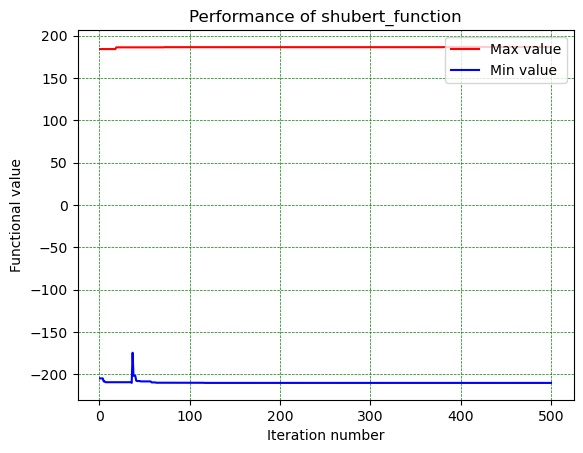

Best max solution found is:  [-7.08469733 -1.42225077]
And function result for this solution is:  186.70845793297326
Best min solution found is:  [5.48964617 5.48108009]
And function result for this solution is:  -210.35992237905722
Totally elapsed  1.5039897  seconds


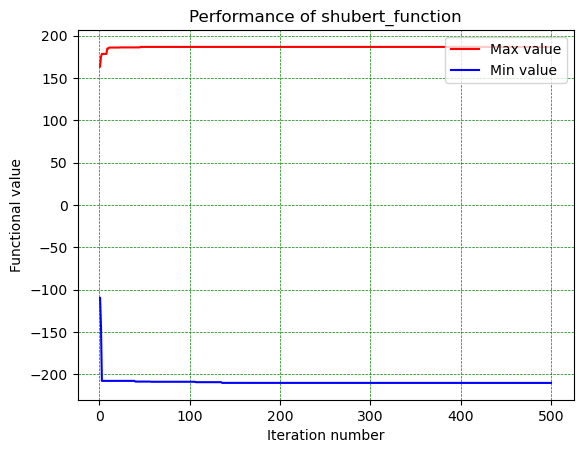

Best max solution found is:  [4.86380869 5.4859131 ]
And function result for this solution is:  186.6331501179206
Best min solution found is:  [-7.08592073 -7.08053545]
And function result for this solution is:  -210.44579491696607
Totally elapsed  1.5319144  seconds


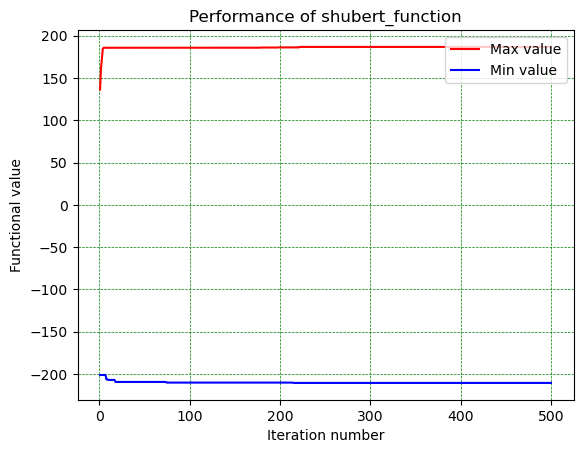

Best max solution found is:  [-1.42912286 -0.79801722]
And function result for this solution is:  186.6820446961475
Best min solution found is:  [-7.08502222 -7.08154527]
And function result for this solution is:  -210.46699238494546
Totally elapsed  1.4535892  seconds


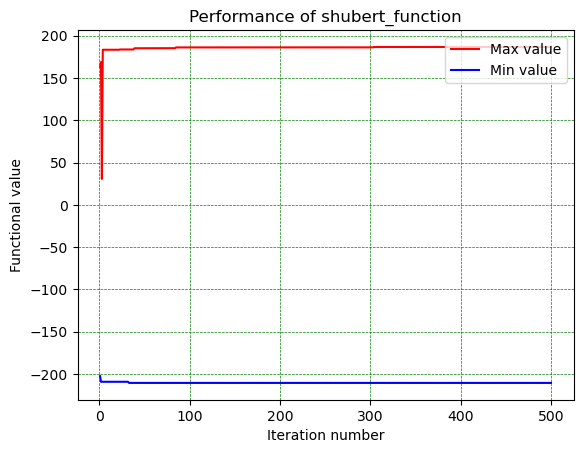

Best max solution found is:  [-7.08330876 -1.42061458]
And function result for this solution is:  186.68327285436254
Best min solution found is:  [-7.081372   -7.07905308]
And function result for this solution is:  -210.42158627624917
Totally elapsed  1.498618  seconds


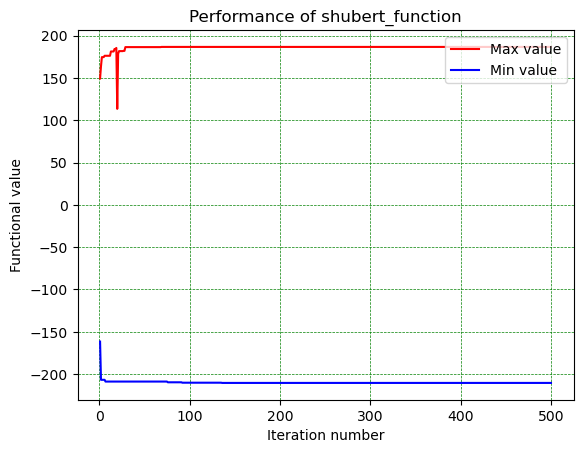

Best max solution found is:  [5.48356359 4.85813893]
And function result for this solution is:  186.7298123332824
Best min solution found is:  [-7.08198921 -7.08377014]
And function result for this solution is:  -210.47638825925537
Totally elapsed  1.4052911  seconds


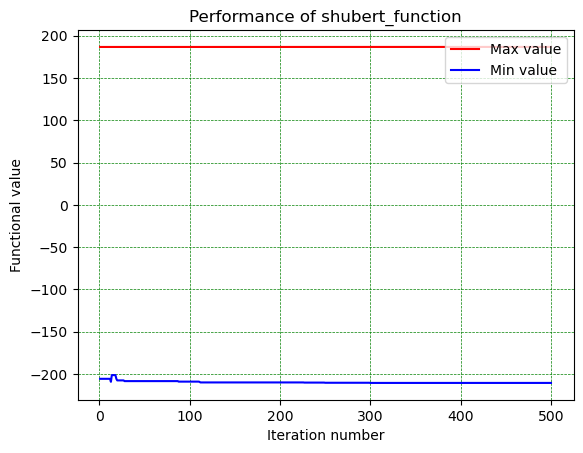

Best max solution found is:  [-7.71058587 -0.79307857]
And function result for this solution is:  186.60311236254506
Best min solution found is:  [-7.0826067  -7.08705354]
And function result for this solution is:  -210.44892227191346
Totally elapsed  1.4496794  seconds


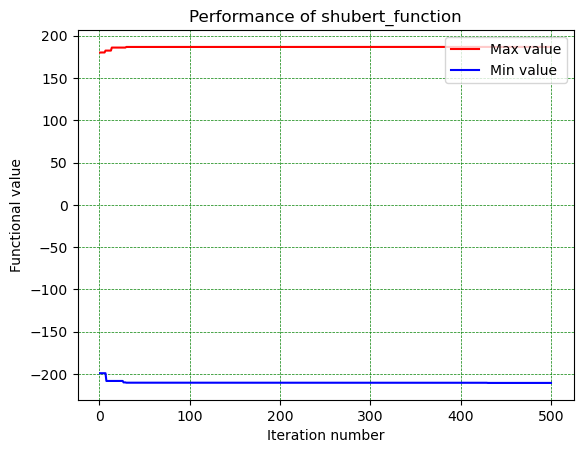

In [48]:
for test_number in range(TESTS_AMOUNT):
    perform_test_furleb_modification("shubert_function", shubert_function, -10.0, 10.0, 50, 500, 0.4, 0.3, 0.50, True)

## Тестирование функции Де Джонга

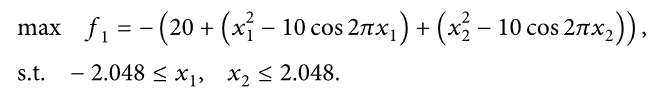

In [50]:
@jit(nopython=True)
def second_de_jong_function(arguments):
    return -1.0 * ( 20 + (np.power(arguments[0], 2) - 10*(np.cos(2*np.pi * arguments[0]))) + (np.power(arguments[1], 2) - 10*(np.cos(2*np.pi * arguments[1]))))

-->Test number 0
Best max solution found is:  [-0.0014703   0.02381691]
And function result for this solution is:  -0.11275704098308026
Best min solution found is:  [-1.50777128  1.50800136]
And function result for this solution is:  -44.52288891528558
Totally elapsed  3.5167607  seconds


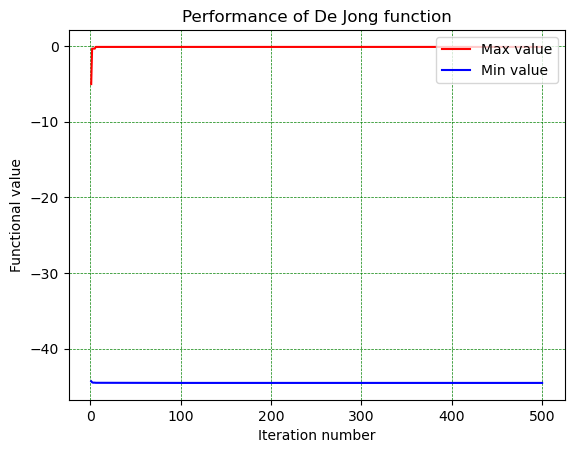

-->Test number 1
Best max solution found is:  [ 0.05499875 -0.98118161]
And function result for this solution is:  -1.62672929850946
Best min solution found is:  [1.50759934 1.50876077]
And function result for this solution is:  -44.52267137589526
Totally elapsed  3.4397577  seconds


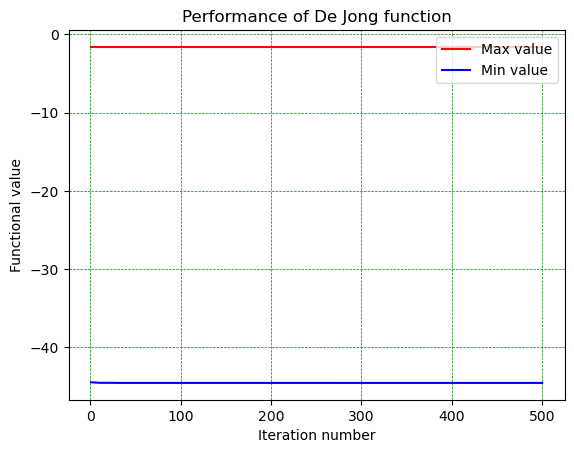

-->Test number 2
Best max solution found is:  [0.03196737 0.04738568]
And function result for this solution is:  -0.6442678997752207
Best min solution found is:  [1.50796256 1.50639174]
And function result for this solution is:  -44.52259140165866
Totally elapsed  3.2381894  seconds


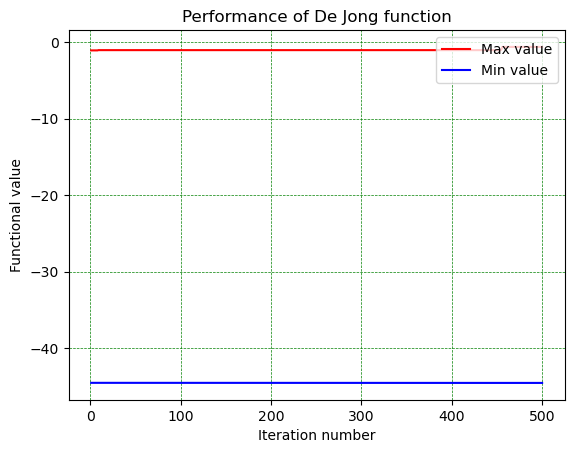

-->Test number 3
Best max solution found is:  [0.01442381 0.05717582]
And function result for this solution is:  -0.6828948219083735
Best min solution found is:  [ 1.5079789 -1.5081068]
And function result for this solution is:  -44.52285272862669
Totally elapsed  3.3360698  seconds


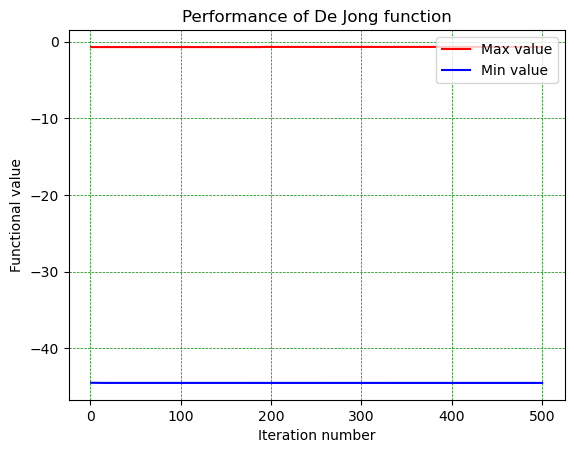

-->Test number 4
Best max solution found is:  [0.04891973 0.03946963]
And function result for this solution is:  -0.7785652535209788
Best min solution found is:  [1.50856465 1.50902917]
And function result for this solution is:  -44.52237223460935
Totally elapsed  2.872011  seconds


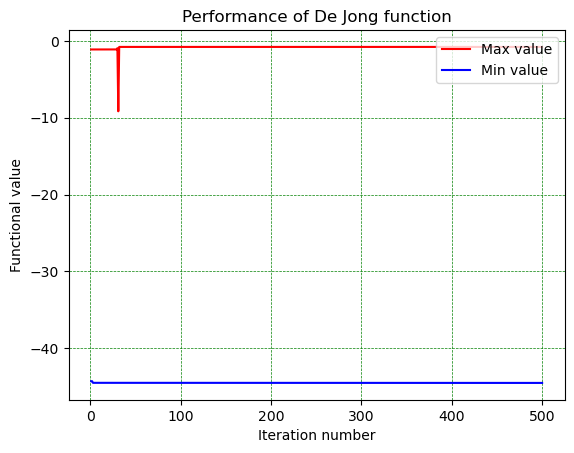

-->Test number 5
Best max solution found is:  [ 9.95772014e-01 -1.68048670e-04]
And function result for this solution is:  -0.9950958533408372
Best min solution found is:  [-1.50743142  1.50838869]
And function result for this solution is:  -44.52279944128625
Totally elapsed  3.1022715  seconds


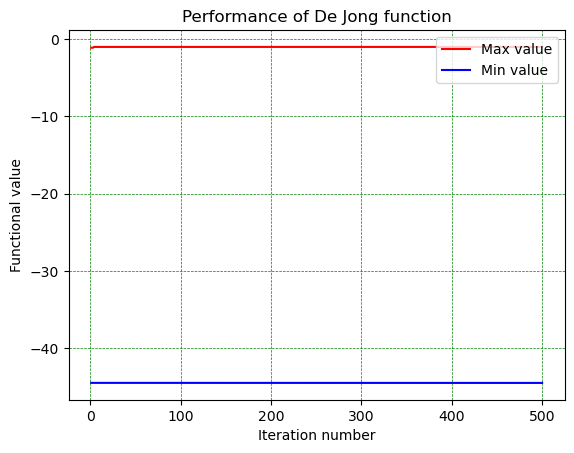

-->Test number 6
Best max solution found is:  [0.05271057 0.0179553 ]
And function result for this solution is:  -0.6101114771210714
Best min solution found is:  [1.50724566 1.5074691 ]
And function result for this solution is:  -44.522881371203056
Totally elapsed  2.9016711  seconds


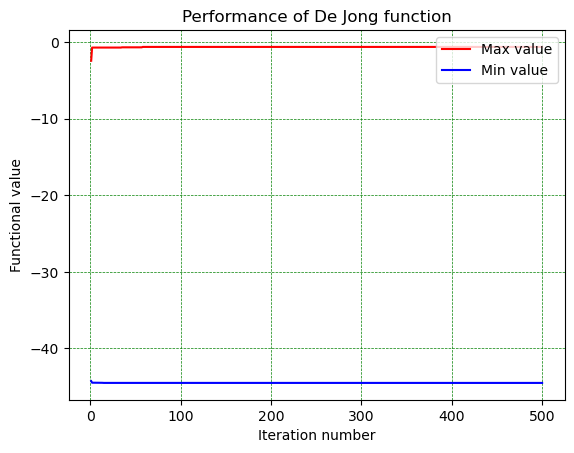

-->Test number 7
Best max solution found is:  [-0.00404353  0.05223222]
And function result for this solution is:  -0.5396817084428722
Best min solution found is:  [ 1.50754997 -1.50819398]
And function result for this solution is:  -44.52285611477152
Totally elapsed  2.8345509  seconds


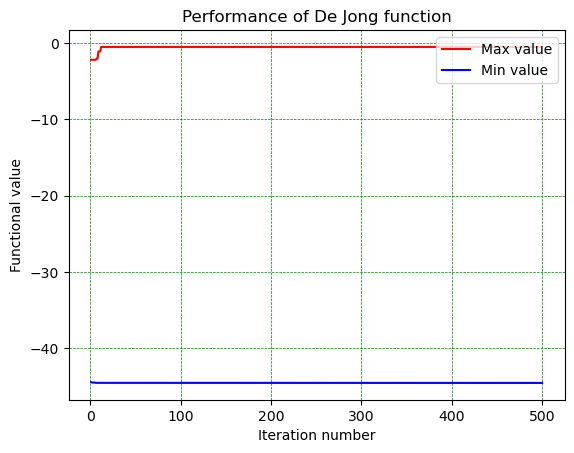

-->Test number 8
Best max solution found is:  [-0.98547031 -0.99870335]
And function result for this solution is:  -2.0105348621505517
Best min solution found is:  [1.507302   1.50738942]
And function result for this solution is:  -44.52288287134766
Totally elapsed  2.9477125  seconds


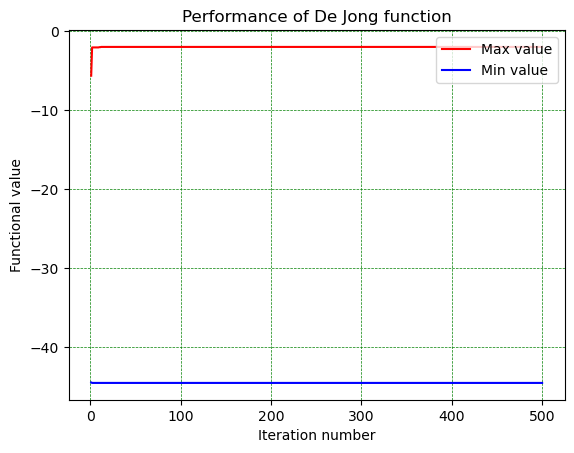

-->Test number 9
Best max solution found is:  [0.02188407 0.04057857]
And function result for this solution is:  -0.41978311719965156
Best min solution found is:  [-1.50774927  1.50802196]
And function result for this solution is:  -44.52288694979511
Totally elapsed  3.4701558  seconds


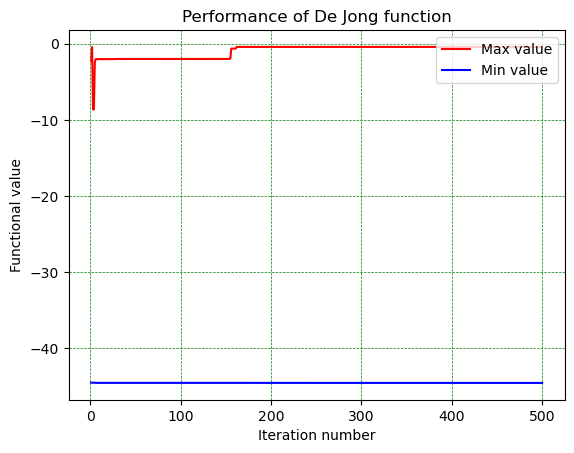

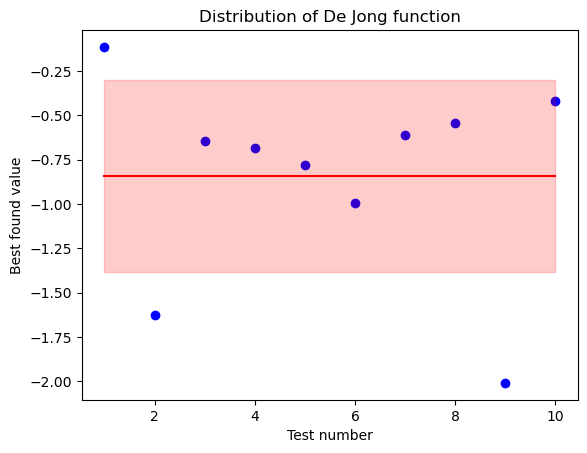

Dispersion is 0.29283795526244877


In [57]:
function_name = "De Jong function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_de_jong_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test_furleb_modification(function_name, second_de_jong_function, -2.048, 2.048, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)
    average_de_jong_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_de_jong_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Есома

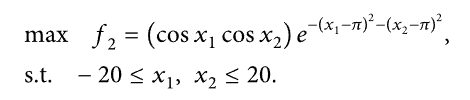

In [58]:
@jit(nopython=True)
def esom_function(arguments):
    return (np.cos(arguments[0]) * np.cos(arguments[1]) * np.exp(
        -1 * np.power((arguments[0] - np.pi), 2) - np.power(
            (arguments[1] - np.pi), 2)))

-->Test number 0
Best max solution found is:  [3.41897279 3.81869065]
And function result for this solution is:  0.43884311163004364
Best min solution found is:  [1.29888416 3.13335385]
And function result for this solution is:  -0.009002024268763459
Totally elapsed  8.3018394  seconds


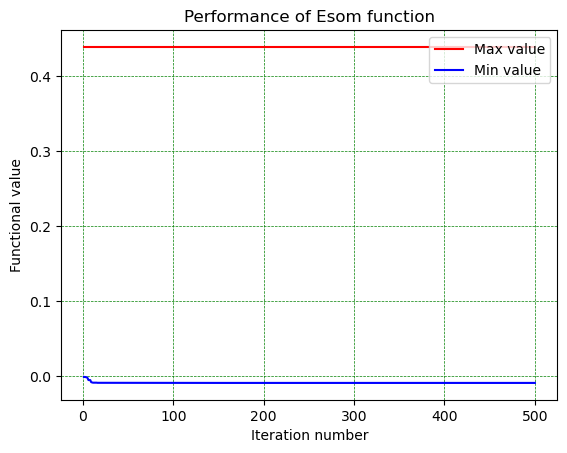

-->Test number 1
Best max solution found is:  [3.51422813 4.48096633]
And function result for this solution is:  0.030920736947525933
Best min solution found is:  [3.14248198 4.98025464]
And function result for this solution is:  -0.00900535226399261
Totally elapsed  3.3502709  seconds


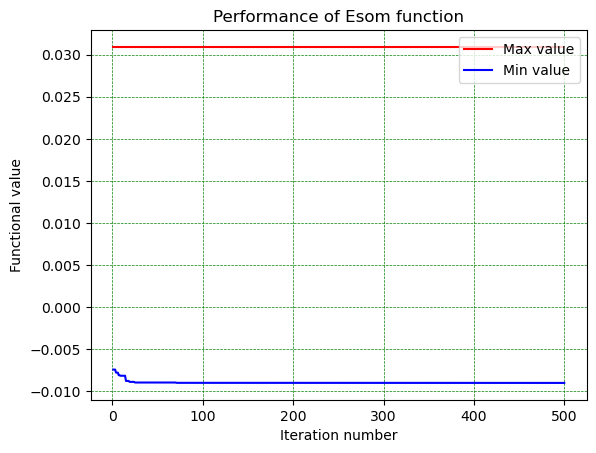

-->Test number 2
Best max solution found is:  [3.38067168 3.12577354]
And function result for this solution is:  0.9172364134837967
Best min solution found is:  [3.15878482 4.97101353]
And function result for this solution is:  -0.008997804029903963
Totally elapsed  3.4262899  seconds


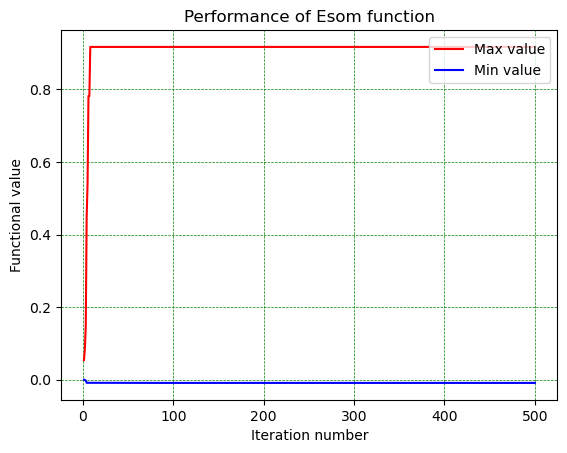

-->Test number 3
Best max solution found is:  [1.31088456 5.72030026]
And function result for this solution is:  9.855404073668232e-06
Best min solution found is:  [1.3047602  3.13650292]
And function result for this solution is:  -0.00900532410311014
Totally elapsed  3.3075408  seconds


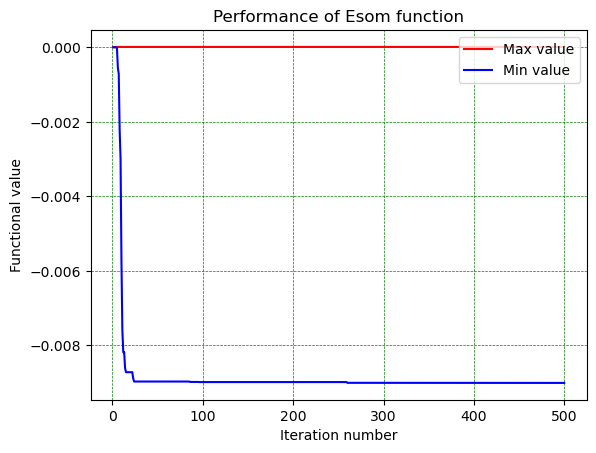

-->Test number 4
Best max solution found is:  [5.71481118 1.38442245]
And function result for this solution is:  9.483569447776133e-06
Best min solution found is:  [4.98401189 3.14827427]
And function result for this solution is:  -0.009002589421177598
Totally elapsed  3.2442837  seconds


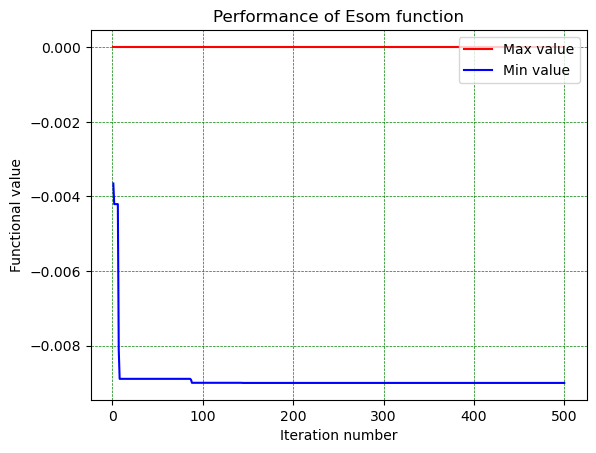

-->Test number 5
Best max solution found is:  [1.39661663 5.76089923]
And function result for this solution is:  7.493145605352741e-06
Best min solution found is:  [3.13570996 1.30477758]
And function result for this solution is:  -0.009005207158905112
Totally elapsed  3.4642788  seconds


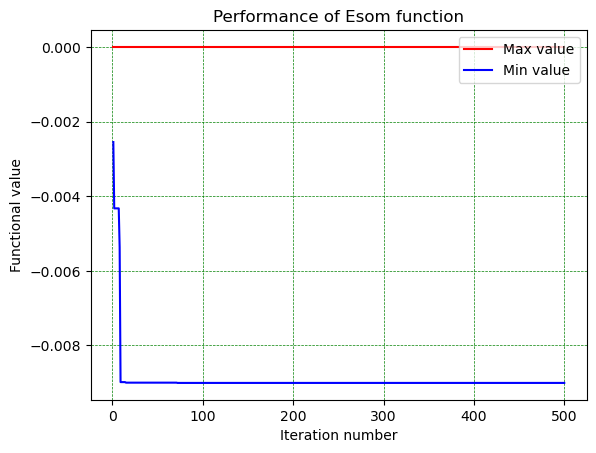

-->Test number 6
Best max solution found is:  [13.86962786 12.59467884]
And function result for this solution is:  4.264103972023885e-90
Best min solution found is:  [3.11927441 5.25114428]
And function result for this solution is:  -0.005986178123800044
Totally elapsed  3.5614346  seconds


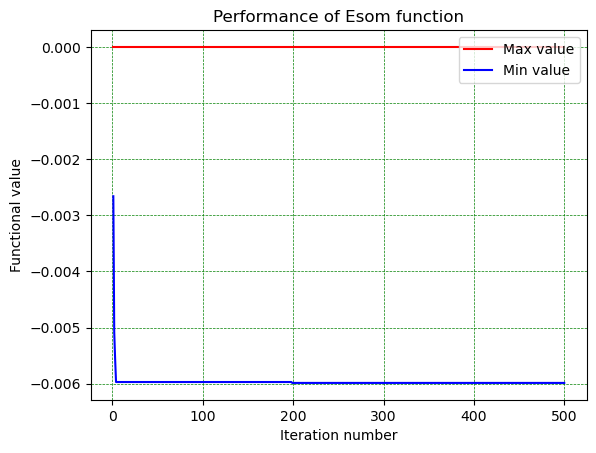

-->Test number 7
Best max solution found is:  [15.47843094 14.75370991]
And function result for this solution is:  1.2335660059133048e-125
Best min solution found is:  [7.63198314 3.17008847]
And function result for this solution is:  -3.8486176820416435e-10
Totally elapsed  3.4050813  seconds


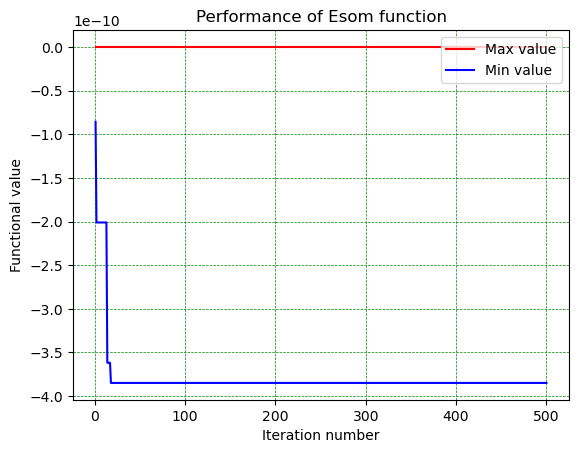

-->Test number 8
Best max solution found is:  [6.51895408 1.33598125]
And function result for this solution is:  9.656772828931231e-08
Best min solution found is:  [4.99496607 3.13840227]
And function result for this solution is:  -0.008985383508304171
Totally elapsed  3.3473177  seconds


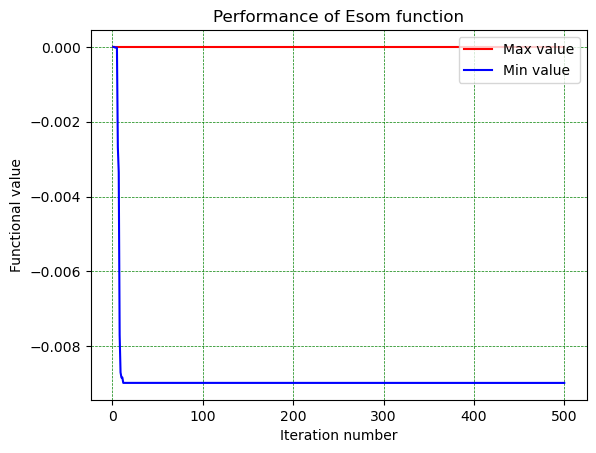

-->Test number 9
Best max solution found is:  [5.07880503 6.67542089]
And function result for this solution is:  2.9285329777460976e-08
Best min solution found is:  [3.14263637 4.97823679]
And function result for this solution is:  -0.009005663269657694
Totally elapsed  3.3734951  seconds


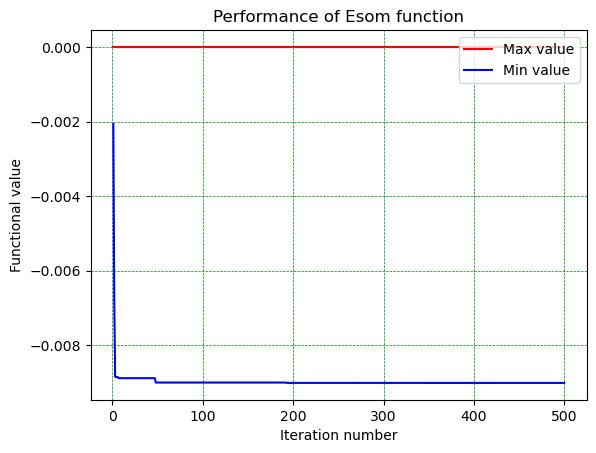

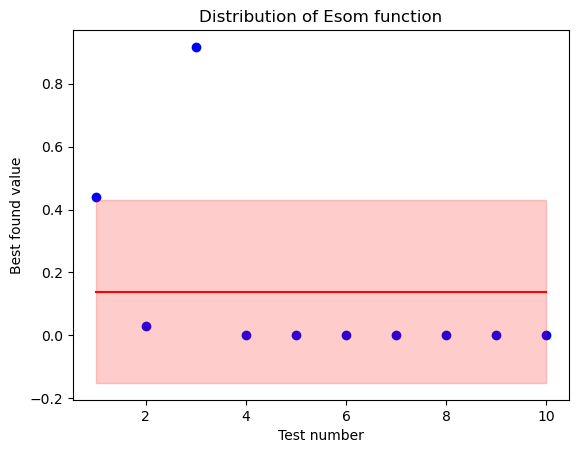

Dispersion is 0.08424775561509598


In [61]:
function_name = "Esom function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_esom_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test_furleb_modification(function_name, esom_function, -20.0, 20.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)
    average_esom_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_esom_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Прерывистый тест

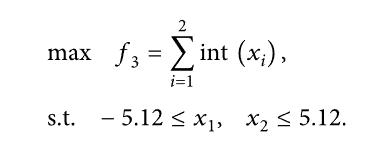

In [62]:
@jit(nopython=True)
def discontinuous_test(arguments):
    return int(arguments[0]) + int(arguments[1])

-->Test number 0
Best max solution found is:  [5.12 5.12]
And function result for this solution is:  10
Best min solution found is:  [-5.04567279 -5.12      ]
And function result for this solution is:  -10
Totally elapsed  6.3824927  seconds


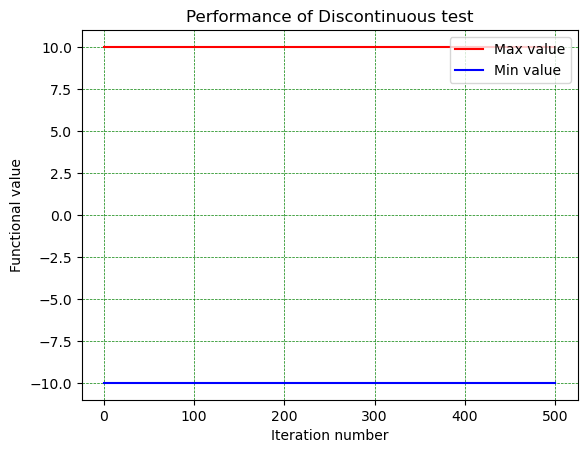

-->Test number 1
Best max solution found is:  [5.1167769  0.30682901]
And function result for this solution is:  5
Best min solution found is:  [-5.12 -5.12]
And function result for this solution is:  -10
Totally elapsed  2.4004598  seconds


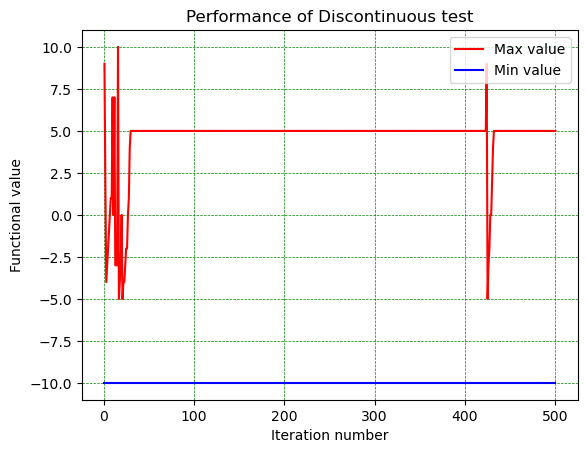

-->Test number 2
Best max solution found is:  [5.12 5.12]
And function result for this solution is:  10
Best min solution found is:  [-5.12       -5.11468149]
And function result for this solution is:  -10
Totally elapsed  1.1890984  seconds


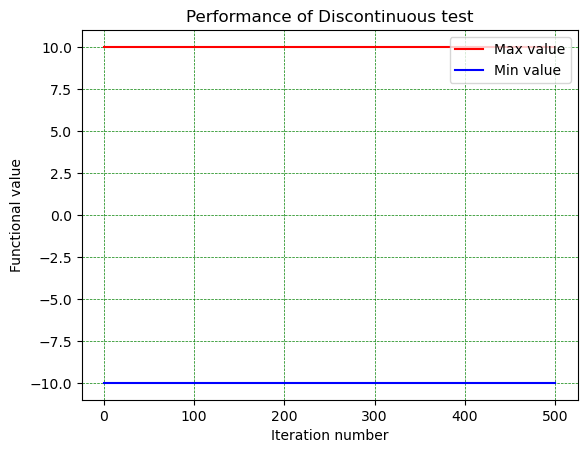

-->Test number 3
Best max solution found is:  [5.12 5.12]
And function result for this solution is:  10
Best min solution found is:  [-5.12 -5.12]
And function result for this solution is:  -10
Totally elapsed  1.2773839  seconds


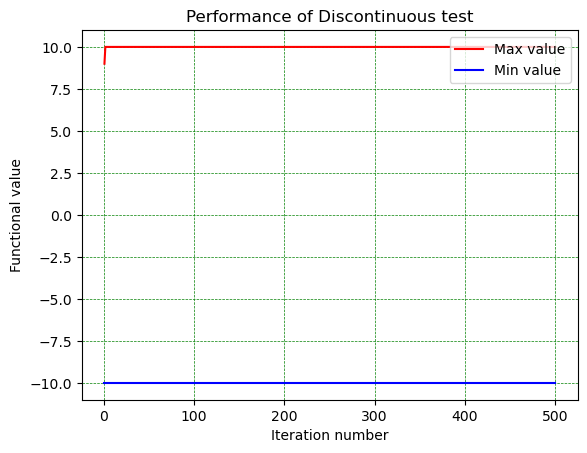

-->Test number 4
Best max solution found is:  [5.12 5.12]
And function result for this solution is:  10
Best min solution found is:  [-5.12 -5.12]
And function result for this solution is:  -10
Totally elapsed  1.1418234  seconds


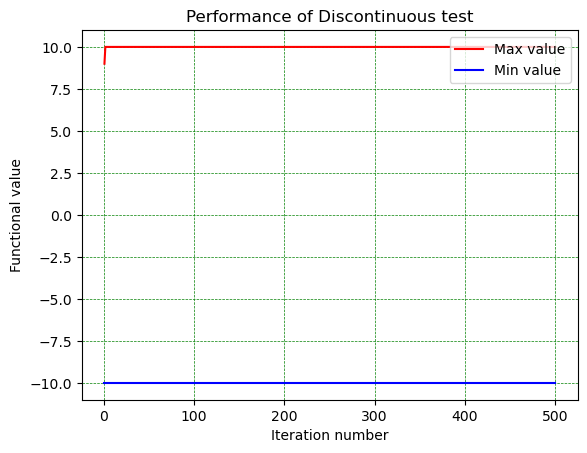

-->Test number 5
Best max solution found is:  [-5.12       -2.14291108]
And function result for this solution is:  -7
Best min solution found is:  [-5.12 -5.12]
And function result for this solution is:  -10
Totally elapsed  2.4331692  seconds


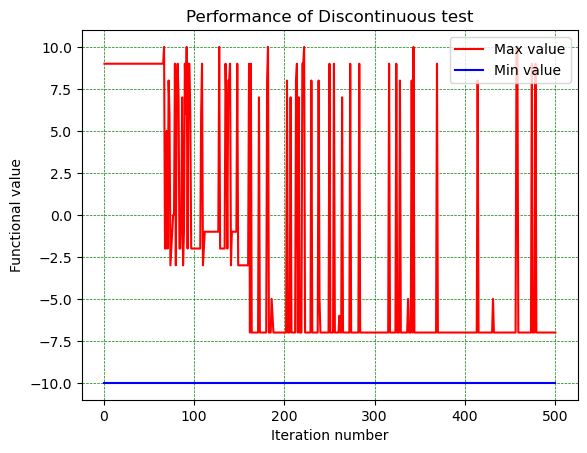

-->Test number 6
Best max solution found is:  [5.12 5.12]
And function result for this solution is:  10
Best min solution found is:  [-5.05946054 -5.12      ]
And function result for this solution is:  -10
Totally elapsed  1.1773259  seconds


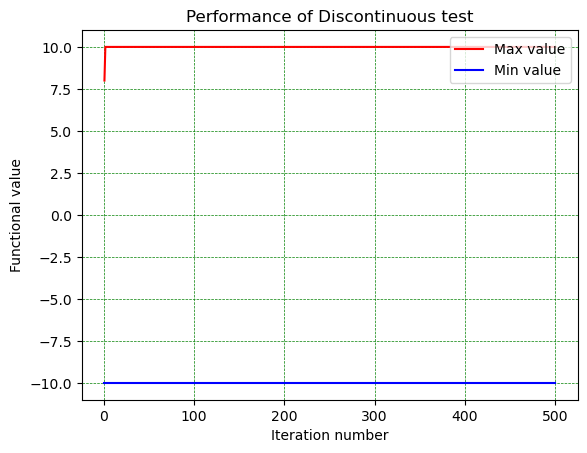

-->Test number 7
Best max solution found is:  [-0.53818935 -0.01712497]
And function result for this solution is:  0
Best min solution found is:  [-5.12 -5.12]
And function result for this solution is:  -10
Totally elapsed  1.2660605  seconds


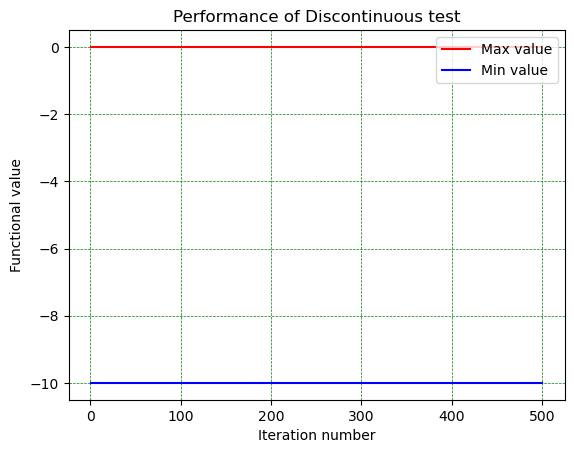

-->Test number 8
Best max solution found is:  [5.12 5.12]
And function result for this solution is:  10
Best min solution found is:  [-5.12 -5.12]
And function result for this solution is:  -10
Totally elapsed  2.4214199  seconds


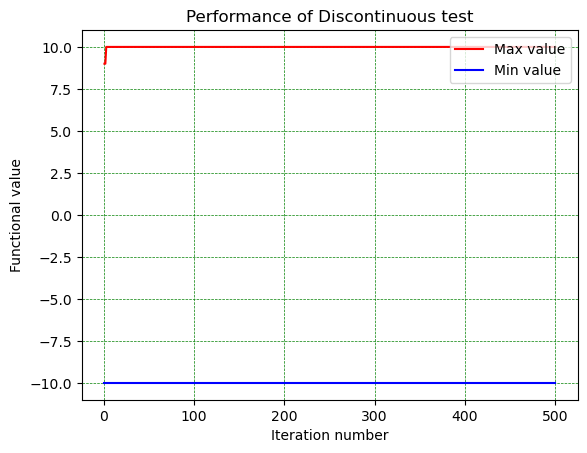

-->Test number 9
Best max solution found is:  [5.12 5.12]
And function result for this solution is:  10
Best min solution found is:  [-5.12       -3.10759009]
And function result for this solution is:  -8
Totally elapsed  1.1714497  seconds


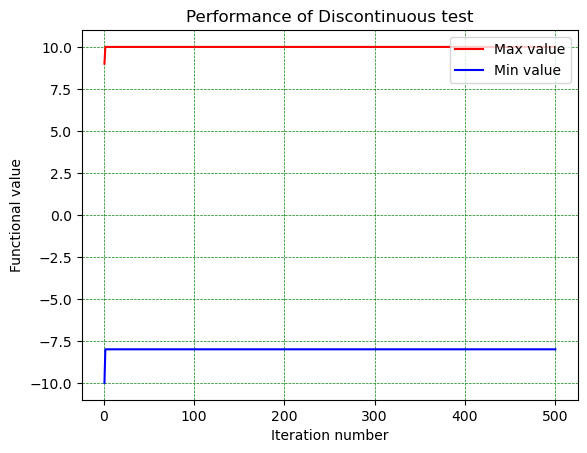

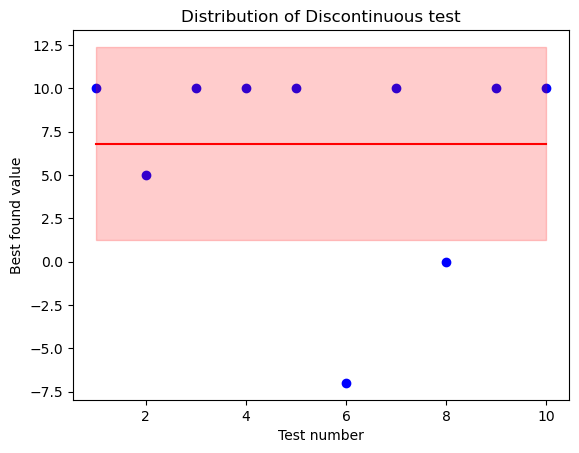

Dispersion is 31.160000000000004


In [63]:
function_name = "Discontinuous test"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_discontinuous_test_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test_furleb_modification(function_name, discontinuous_test, -5.12, 5.12, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)
    average_discontinuous_test_python_time += time_elapsed
    best_values[test_number] = best_value
average_discontinuous_test_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Мишры

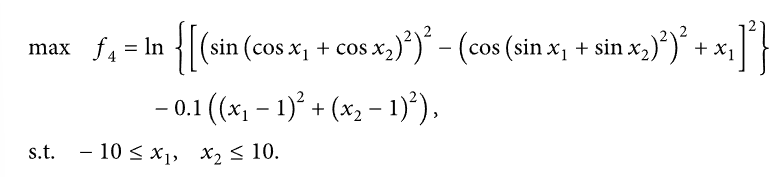

In [64]:
@jit(nopython=True)
def mishra_function(arguments):
    return np.log(
        np.power((
                np.power(np.sin(
                    np.power((np.cos(arguments[0]) + np.cos(arguments[1])), 2)),
                    2) - np.power(
            np.cos(np.power((np.sin(arguments[0]) + np.sin(arguments[1])), 2)),
            2) + arguments[0]
        ), 2)
    ) - 0.1 * (np.power(arguments[0] - 1, 2) + np.power(arguments[1] - 1, 2))

-->Test number 0
Best max solution found is:  [-2.05939153  0.96021451]
And function result for this solution is:  1.3001990559473806
Best min solution found is:  [ 0.92091693 -1.64491432]
And function result for this solution is:  -24.08802690749266
Totally elapsed  8.0933798  seconds


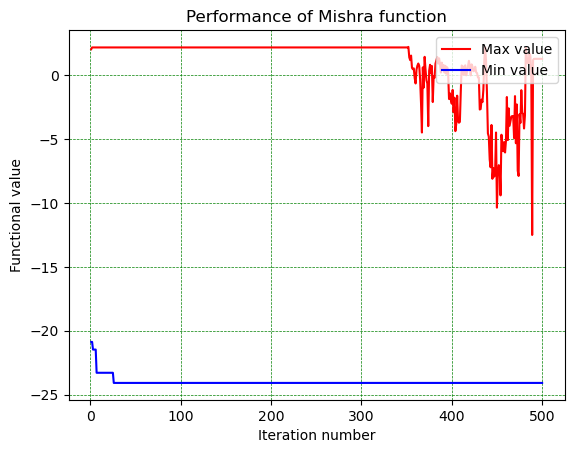

-->Test number 1
Best max solution found is:  [2.92361522 1.7817632 ]
And function result for this solution is:  2.278375282427402
Best min solution found is:  [-0.03810012  4.47941663]
And function result for this solution is:  -21.659921510843258
Totally elapsed  2.9089889  seconds


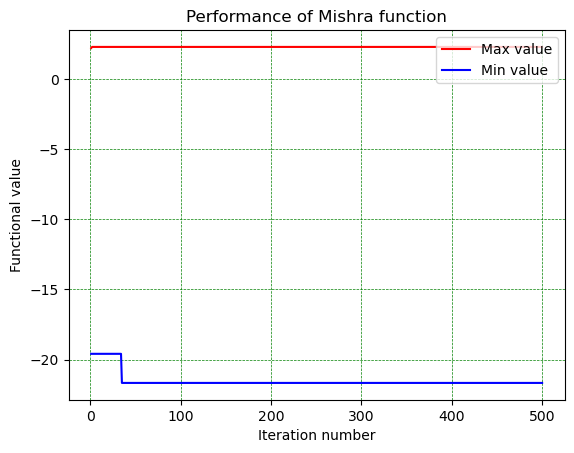

-->Test number 2
Best max solution found is:  [-2.13274539  1.05107562]
And function result for this solution is:  1.3021480045025087
Best min solution found is:  [ 0.57706157 -9.44305292]
And function result for this solution is:  -30.9536376144087
Totally elapsed  3.0705003  seconds


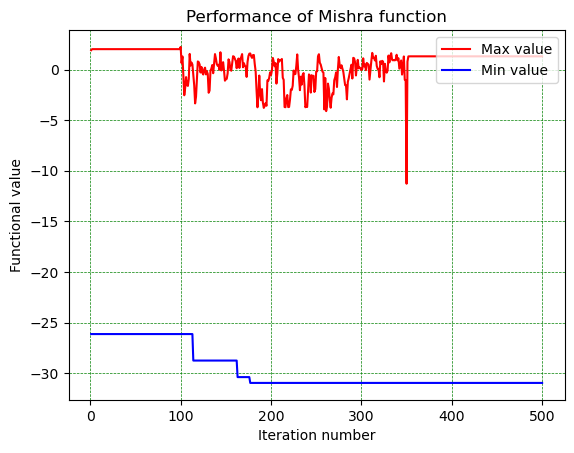

-->Test number 3
Best max solution found is:  [-2.25108869 -0.44969909]
And function result for this solution is:  0.9361779724329622
Best min solution found is:  [ 0.9269271  -9.11206584]
And function result for this solution is:  -25.81305081592155
Totally elapsed  2.1136376  seconds


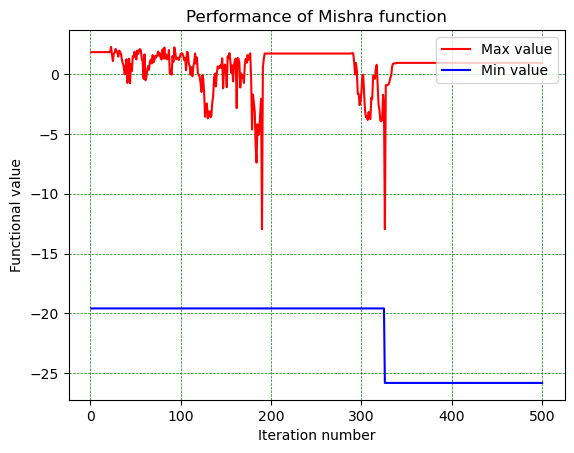

-->Test number 4
Best max solution found is:  [2.02895295 3.02114737]
And function result for this solution is:  1.3557903106617142
Best min solution found is:  [ 0.57674081 -9.58479359]
And function result for this solution is:  -35.786709412469556
Totally elapsed  3.1436251  seconds


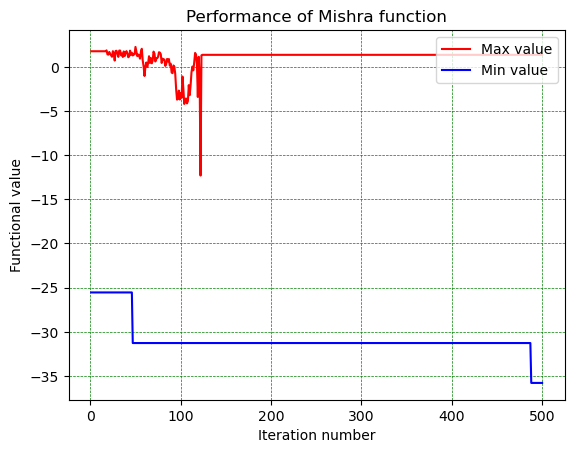

-->Test number 5
Best max solution found is:  [3.03571371 1.93670254]
And function result for this solution is:  2.1408641998849403
Best min solution found is:  [ 0.57671907 -9.30364396]
And function result for this solution is:  -27.58528214927226
Totally elapsed  2.987913  seconds


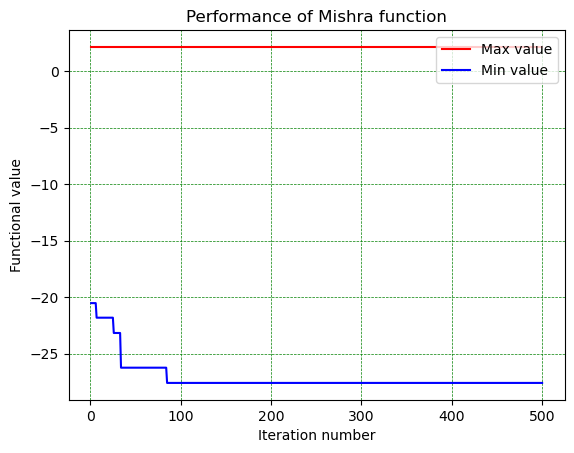

-->Test number 6
Best max solution found is:  [3.16081339 1.7874453 ]
And function result for this solution is:  2.131330952738143
Best min solution found is:  [ 0.43723707 -7.26251588]
And function result for this solution is:  -23.622404872196597
Totally elapsed  2.9986887  seconds


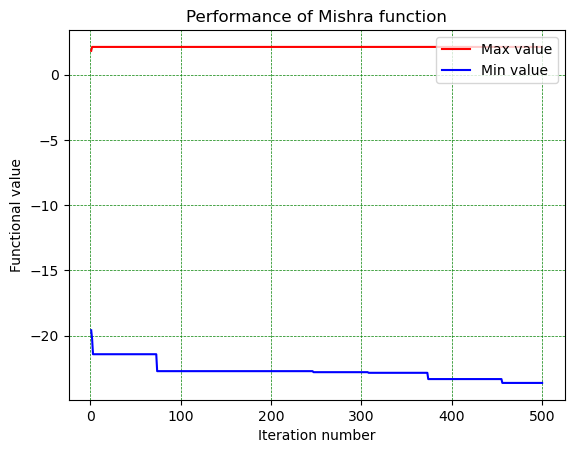

-->Test number 7
Best max solution found is:  [2.87574478 1.89832516]
And function result for this solution is:  2.2672707395081364
Best min solution found is:  [ 0.64563862 -6.08546544]
And function result for this solution is:  -26.711561056266742
Totally elapsed  3.2208389  seconds


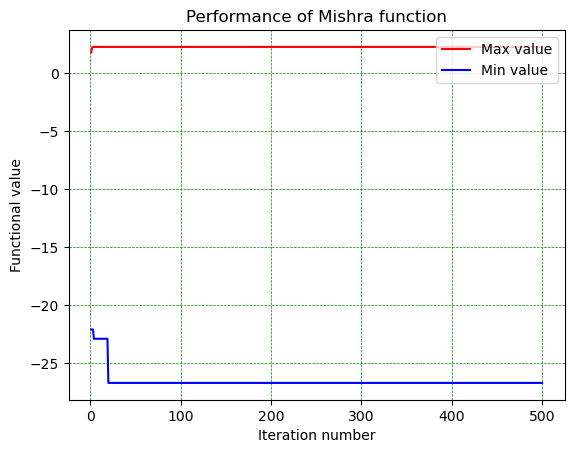

-->Test number 8
Best max solution found is:  [2.91119224 1.88051626]
And function result for this solution is:  2.26698165811695
Best min solution found is:  [ 0.93361716 -4.24741849]
And function result for this solution is:  -24.13961276941587
Totally elapsed  3.1441572  seconds


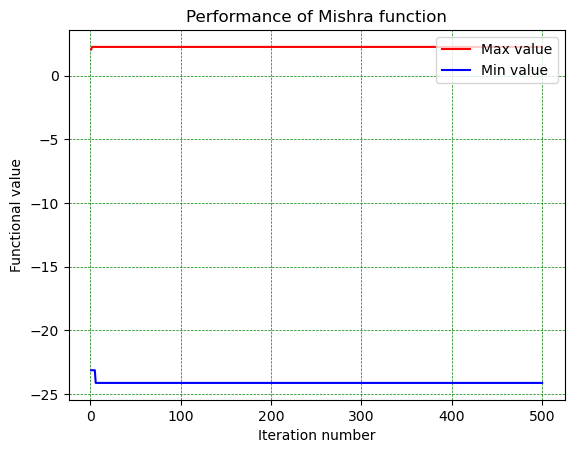

-->Test number 9
Best max solution found is:  [2.90799936 1.79892828]
And function result for this solution is:  2.282063292227371
Best min solution found is:  [ 0.90777591 -9.16506739]
And function result for this solution is:  -25.61784963744175
Totally elapsed  2.9206835  seconds


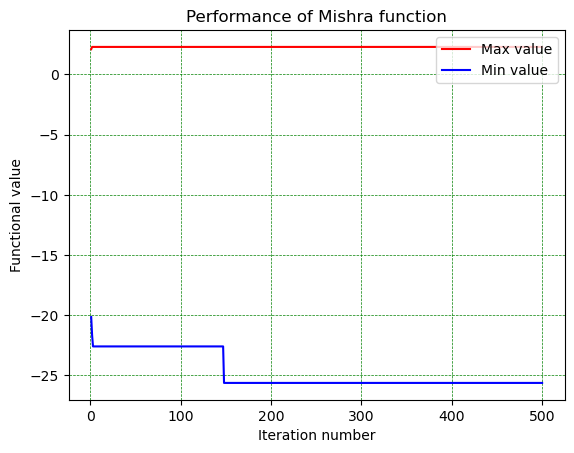

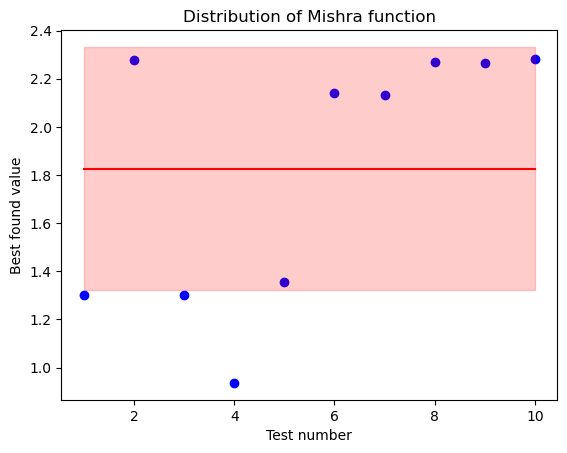

Dispersion is 0.2557956060371146


In [65]:
function_name = "Mishra function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_mishra_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test_furleb_modification(function_name, mishra_function, -10.0, 10.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)
    average_mishra_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_mishra_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Стохастический тест

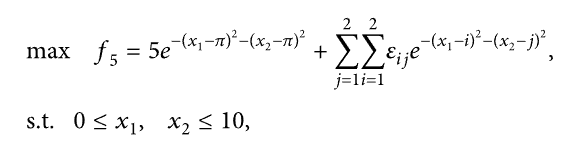

In [66]:
@jit(nopython=True)
def stochastic_test(arguments):
    return 5 * np.exp(-1*np.power((arguments[0] - np.pi), 2) - np.power((arguments[1] - np.pi), 2)) + sum([np.random.rand() * np.exp(-1*np.power((arguments[0] - i), 2) - np.power((arguments[1] - j), 2)) for i in range(2) for j in range(2)])

-->Test number 0
Best max solution found is:  [3.14230541 3.13850675]
And function result for this solution is:  5.000008306272825
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  7.8937162  seconds


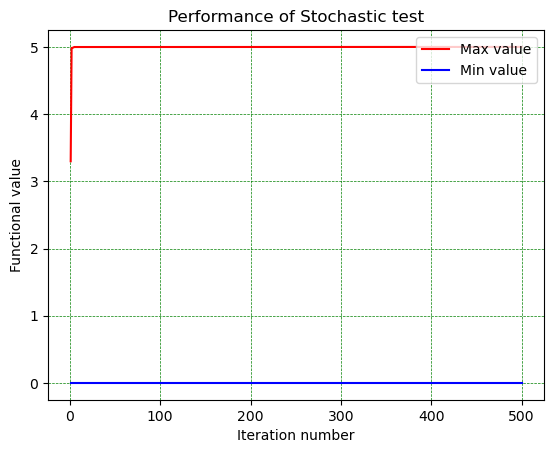

-->Test number 1
Best max solution found is:  [3.13903069 3.14044272]
And function result for this solution is:  4.999996307110135
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.2597785  seconds


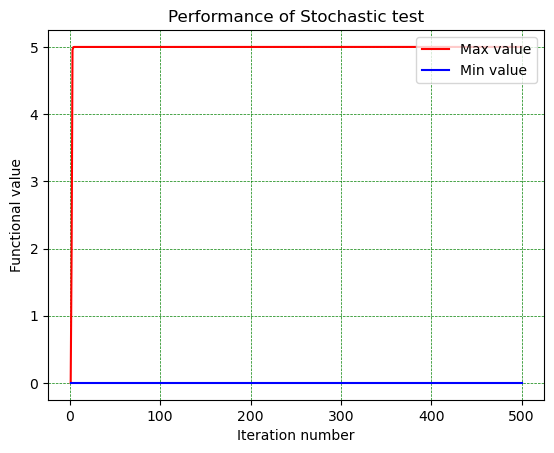

-->Test number 2
Best max solution found is:  [3.14301007 3.141163  ]
And function result for this solution is:  5.000019625024328
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.1950818  seconds


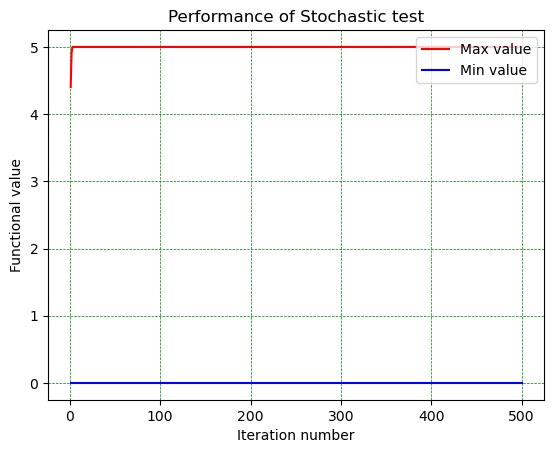

-->Test number 3
Best max solution found is:  [3.14015164 3.1414825 ]
And function result for this solution is:  5.0000942619971696
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.3189512  seconds


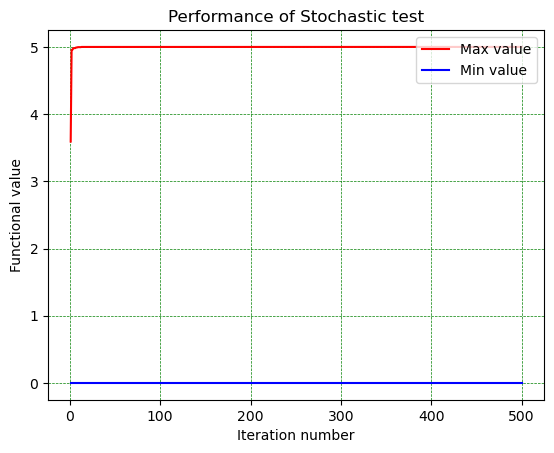

-->Test number 4
Best max solution found is:  [3.14365302 3.14290262]
And function result for this solution is:  4.99998115903569
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.2342048  seconds


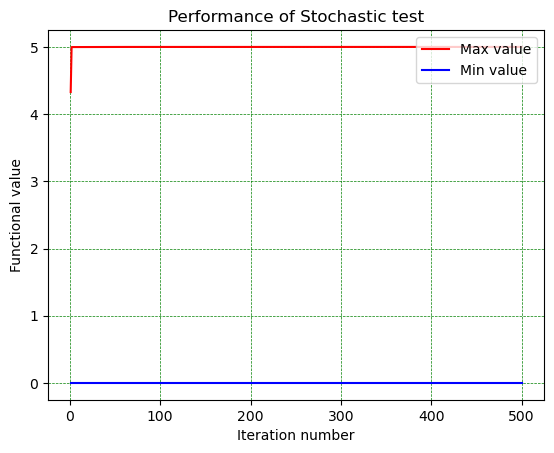

-->Test number 5
Best max solution found is:  [3.13922918 3.14005981]
And function result for this solution is:  5.0000238356645434
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.1898499  seconds


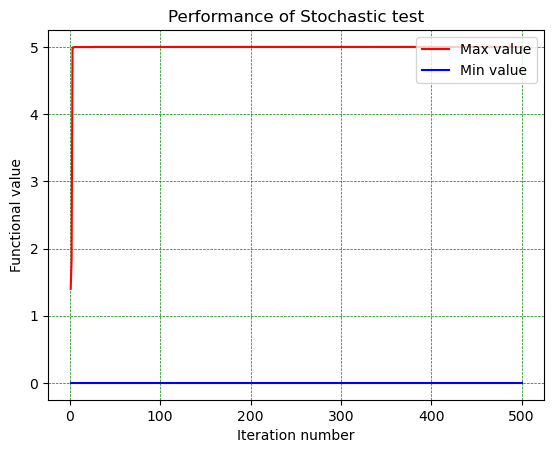

-->Test number 6
Best max solution found is:  [3.14147448 3.14249946]
And function result for this solution is:  5.0000471902823405
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.2510871  seconds


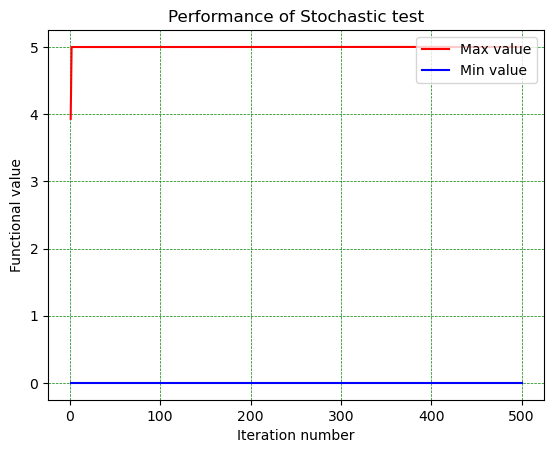

-->Test number 7
Best max solution found is:  [3.14435046 3.1420075 ]
And function result for this solution is:  4.9999756054826285
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.3629025  seconds


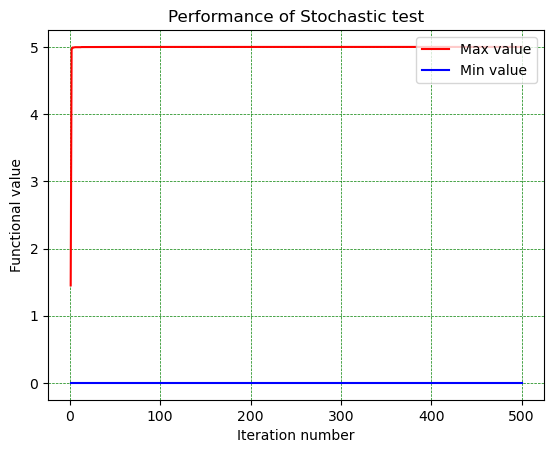

-->Test number 8
Best max solution found is:  [3.14391299 3.14010389]
And function result for this solution is:  4.9999927279378475
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.2707694  seconds


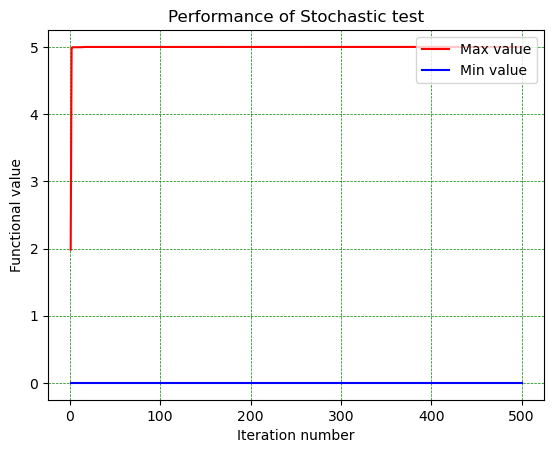

-->Test number 9
Best max solution found is:  [3.14369854 3.14276146]
And function result for this solution is:  5.000049138837604
Best min solution found is:  [10. 10.]
And function result for this solution is:  6.958222589098276e-41
Totally elapsed  2.1999931  seconds


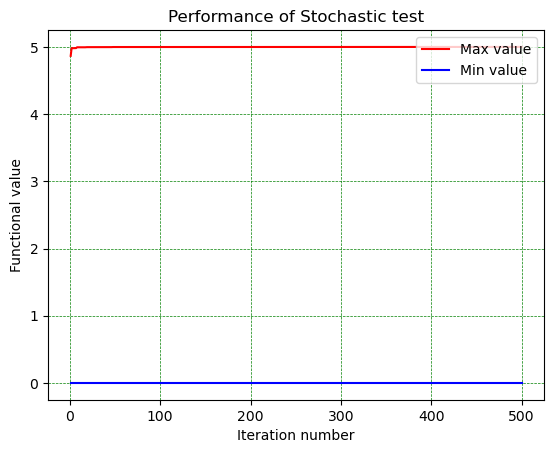

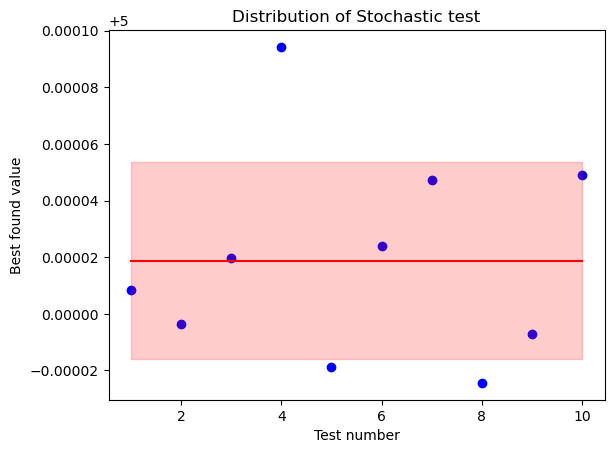

Dispersion is 1.2025411667196998e-09


In [67]:
function_name = "Stochastic test"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_stochastic_test_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test_furleb_modification(function_name, stochastic_test, 0.0, 10.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)
    average_stochastic_test_python_time += time_elapsed
    best_values[test_number] = best_value
average_stochastic_test_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Стеблинского

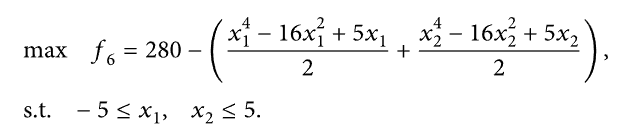

In [68]:
@jit(nopython=True)
def styblinski_function(arguments):
    return 280 - ((arguments[0] ** 4 - 16 * arguments[0] ** 2 + 5 * arguments[
        0]) / 2 + (arguments[1] ** 4 - 16 * arguments[1] ** 2 + 5 * arguments[
        1]) / 2)

-->Test number 0
Best max solution found is:  [-2.8681338  -2.88419047]
And function result for this solution is:  358.30449084023786
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  6.8531894  seconds


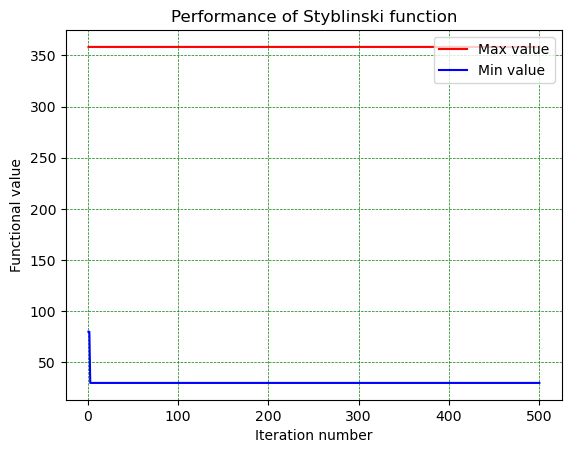

-->Test number 1
Best max solution found is:  [-2.8680412  -2.90140951]
And function result for this solution is:  358.310729426423
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  2.5711854  seconds


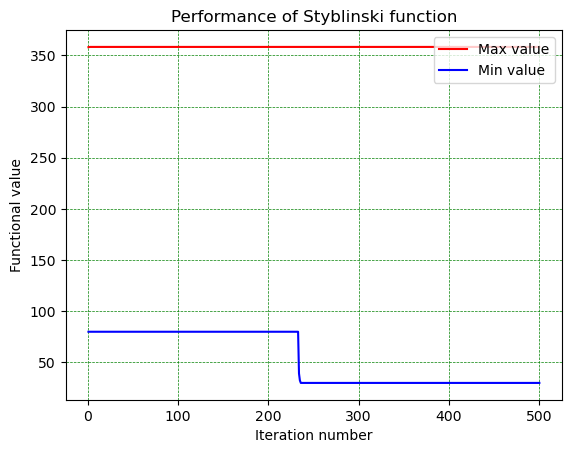

-->Test number 2
Best max solution found is:  [-2.90037355 -2.89815393]
And function result for this solution is:  358.3316592652982
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  1.3814805  seconds


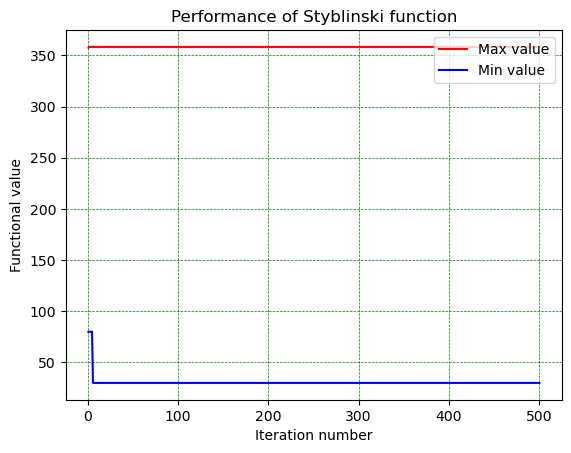

-->Test number 3
Best max solution found is:  [-2.86791967 -2.8974188 ]
And function result for this solution is:  358.3100153395344
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  1.3816887  seconds


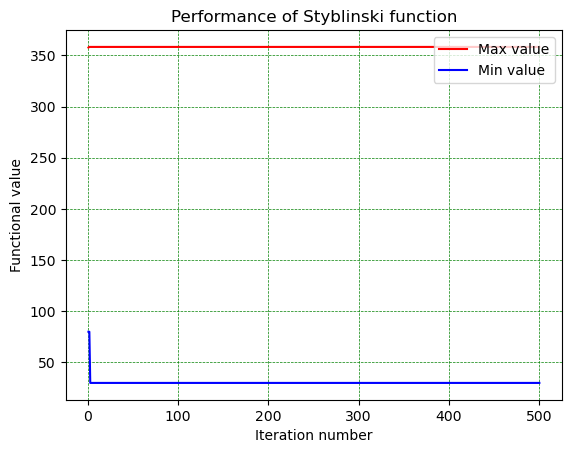

-->Test number 4
Best max solution found is:  [-2.87688353 -2.835331  ]
And function result for this solution is:  358.2415571093527
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  1.3116542  seconds


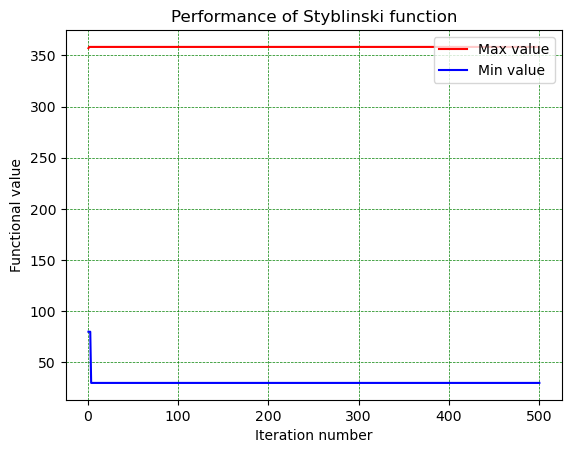

-->Test number 5
Best max solution found is:  [-2.89340197 -2.90220374]
And function result for this solution is:  358.3305317307385
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  1.2691986  seconds


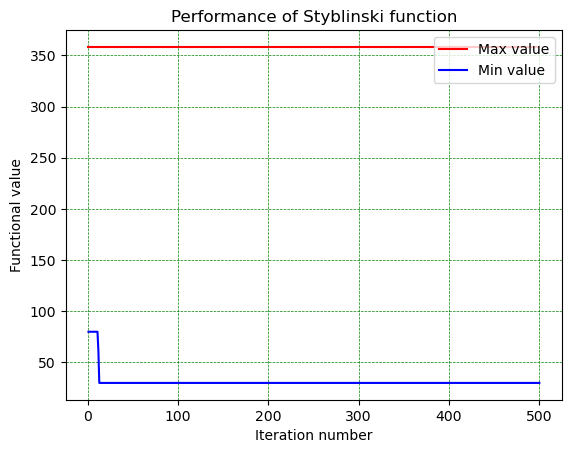

-->Test number 6
Best max solution found is:  [-2.77194306 -2.90145064]
And function result for this solution is:  358.04591550970633
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  1.3630794  seconds


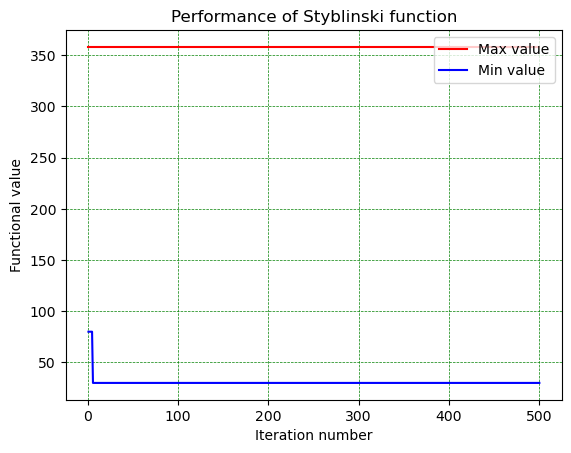

-->Test number 7
Best max solution found is:  [-2.88467593 -2.89761457]
And function result for this solution is:  358.3256162496113
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  1.3650206  seconds


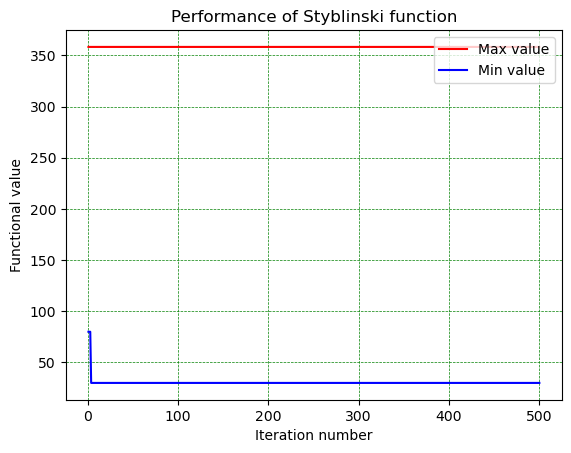

-->Test number 8
Best max solution found is:  [-2.87519052 -2.88262581]
And function result for this solution is:  358.31106600981457
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  1.3360413  seconds


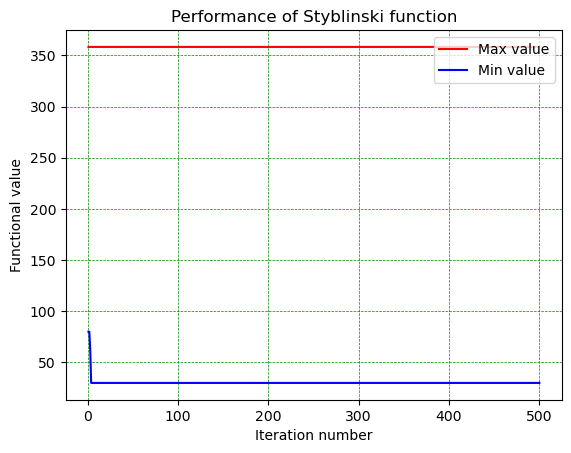

-->Test number 9
Best max solution found is:  [-2.91116527 -2.86274161]
And function result for this solution is:  358.30294115972345
Best min solution found is:  [5. 5.]
And function result for this solution is:  30.0
Totally elapsed  1.4312403  seconds


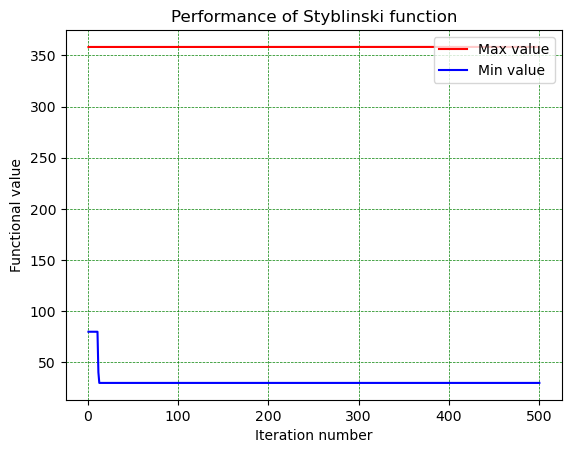

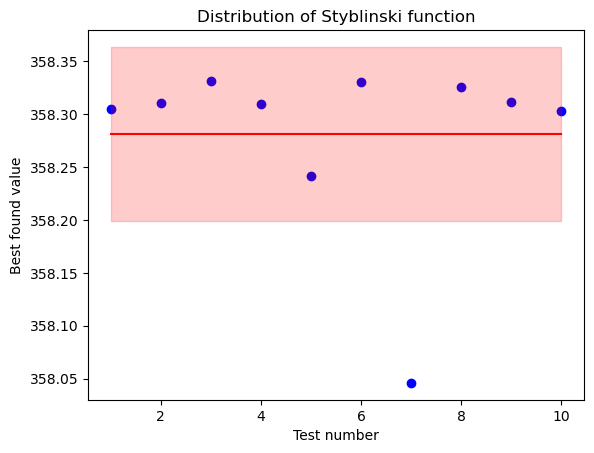

Dispersion is 0.006749170474647388


In [69]:
function_name = "Styblinski function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_styblinski_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test_furleb_modification(function_name, styblinski_function, -5.0, 5.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)
    average_styblinski_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_styblinski_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

## Тестирование функции Шуберта

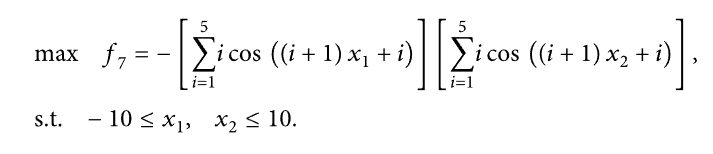

In [70]:
@jit(nopython=True)
def shubert_function(arguments):
    return -1 * sum([i * np.cos((i + 1)*arguments[0] + i) for i in range(1, 6)]) * sum([i * np.cos((i + 1)*arguments[1] + i) for i in range(1, 6)])

-->Test number 0
Best max solution found is:  [-7.0793851  -7.70639535]
And function result for this solution is:  186.6848176784057
Best min solution found is:  [-7.08568649 -0.8005252 ]
And function result for this solution is:  -210.47034800578052
Totally elapsed  11.5367523  seconds


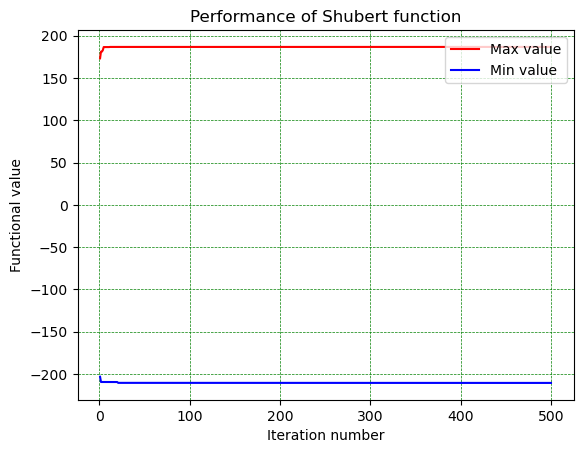

-->Test number 1
Best max solution found is:  [-1.42272757  5.48558034]
And function result for this solution is:  186.70117006188684
Best min solution found is:  [-7.08389726 -7.08488899]
And function result for this solution is:  -210.4771510915564
Totally elapsed  5.6684042  seconds


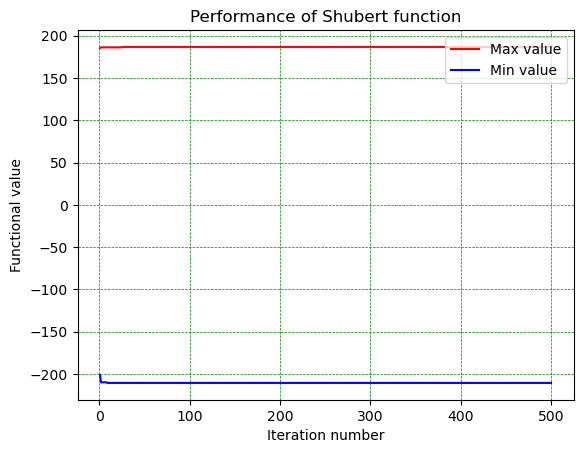

-->Test number 2
Best max solution found is:  [-0.80232308 -1.42566214]
And function result for this solution is:  186.7213858382185
Best min solution found is:  [-7.08362885 -7.08640392]
And function result for this solution is:  -210.46133583139226
Totally elapsed  5.6646989  seconds


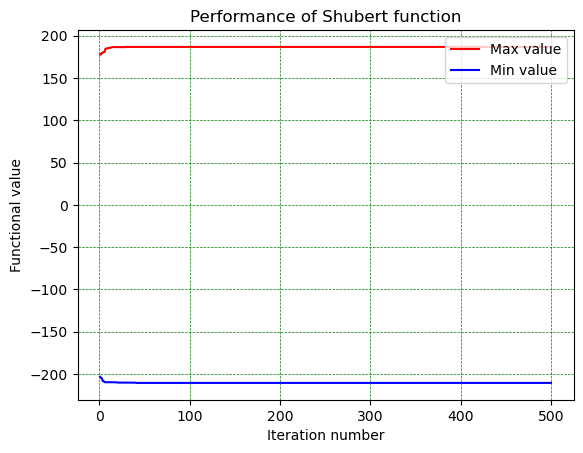

-->Test number 3
Best max solution found is:  [-7.71302902 -7.08104739]
And function result for this solution is:  186.6658114203724
Best min solution found is:  [-0.79691401  5.48324375]
And function result for this solution is:  -210.45303516558516
Totally elapsed  5.7425358  seconds


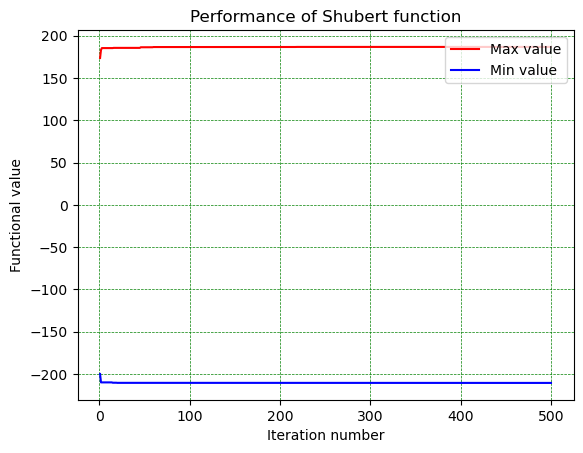

-->Test number 4
Best max solution found is:  [-7.7073421  -7.08332509]
And function result for this solution is:  186.72863518748304
Best min solution found is:  [-7.07984023 -7.08419662]
And function result for this solution is:  -210.44764609898908
Totally elapsed  5.894163  seconds


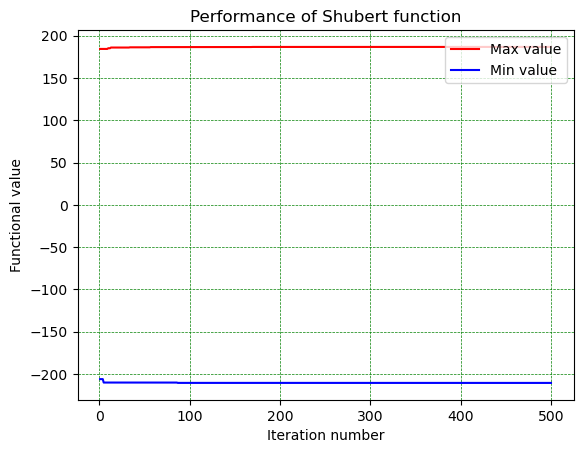

-->Test number 5
Best max solution found is:  [-7.08637954 -7.70538346]
And function result for this solution is:  186.69263207751328
Best min solution found is:  [-7.08454008 -7.08123064]
And function result for this solution is:  -210.46673599984612
Totally elapsed  6.0634524  seconds


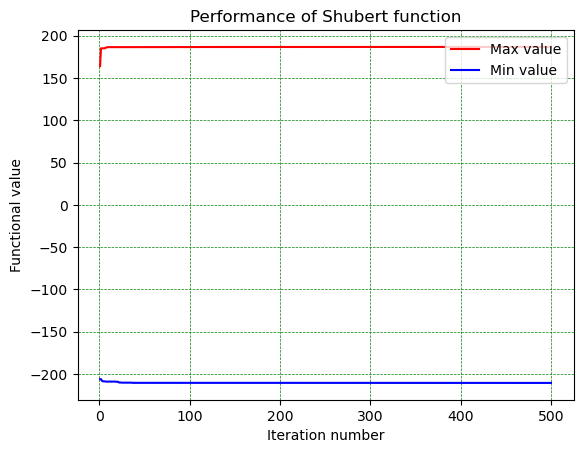

-->Test number 6
Best max solution found is:  [ 4.85446037 -7.08322948]
And function result for this solution is:  186.70062591022253
Best min solution found is:  [-0.80254899 -0.79962975]
And function result for this solution is:  -210.4687362506527
Totally elapsed  6.260079  seconds


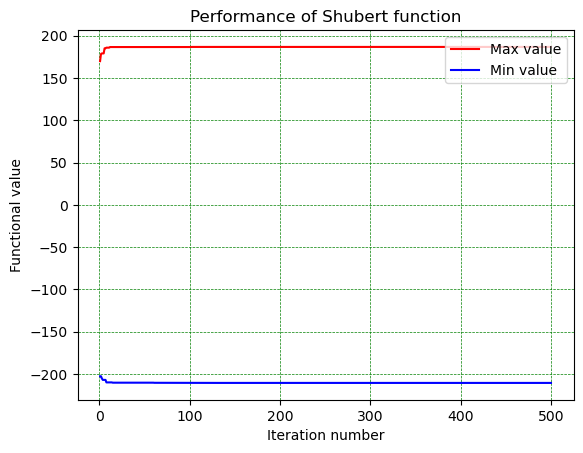

-->Test number 7
Best max solution found is:  [4.85645481 5.48177299]
And function result for this solution is:  186.72229806556265
Best min solution found is:  [-7.08510043 -7.08444097]
And function result for this solution is:  -210.4737876911395
Totally elapsed  6.1725571  seconds


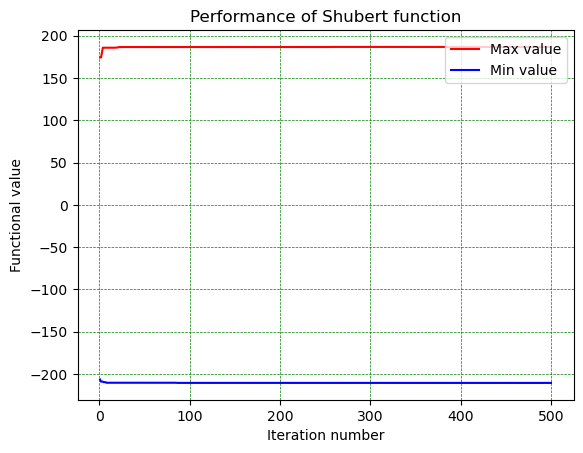

-->Test number 8
Best max solution found is:  [-1.42419095 -0.79813949]
And function result for this solution is:  186.71834587500226
Best min solution found is:  [-7.08177494 -7.08223757]
And function result for this solution is:  -210.47081892695675
Totally elapsed  6.0792171  seconds


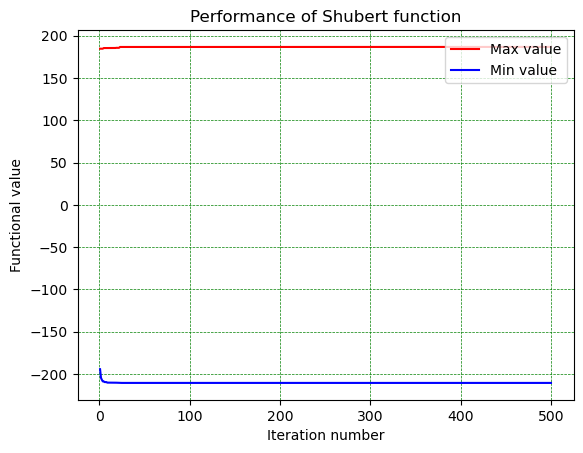

-->Test number 9
Best max solution found is:  [4.86145893 5.48651268]
And function result for this solution is:  186.67451132480568
Best min solution found is:  [-7.08637405 -7.08631124]
And function result for this solution is:  -210.44220049001444
Totally elapsed  6.2486888  seconds


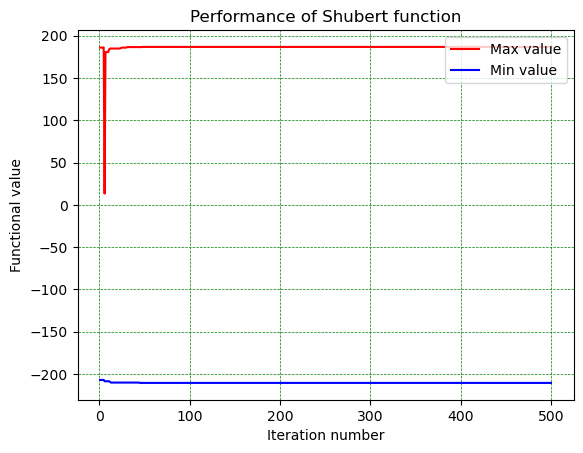

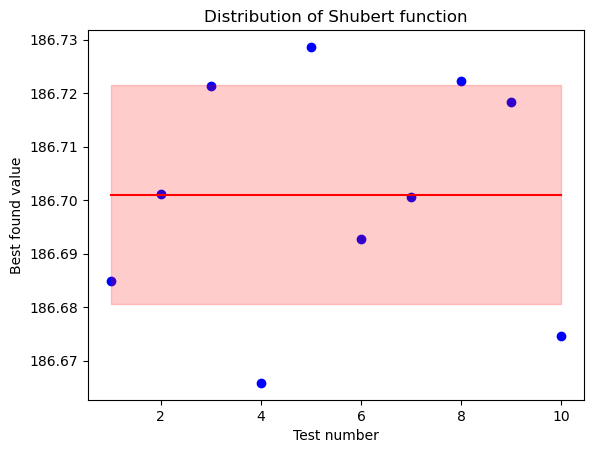

Dispersion is 0.00042057120868910886


In [71]:
function_name = "Shubert function"
best_values = np.arange(TESTS_AMOUNT, dtype=float)
average_shubert_function_python_time = 0.0
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    best_value, time_elapsed = perform_test_furleb_modification(function_name, shubert_function, -10.0, 10.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)
    average_shubert_function_python_time += time_elapsed
    best_values[test_number] = best_value
average_shubert_function_python_time /= TESTS_AMOUNT
draw_distribution_graphic(best_values, TESTS_AMOUNT, function_name)
print("Dispersion is " + str(np.var(best_values)))

# Сравнительные тесты

## Тестирование функции Де Джонга

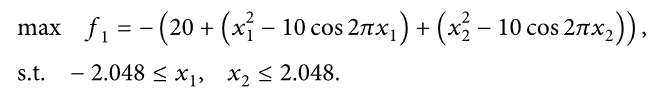

-->Test number 0
Best solution found by original is:  [-0.00546277  1.00334639]
And function result for this solution is:  -1.0148341791036675
Totally elapsed for original  0.5568218  seconds
Best solution found by furleb modification is:  -1.002915986914699
And function result for this solution is:  [0.99671916 0.00608386]
Totally elapsed for furleb modification  3.2950858  seconds


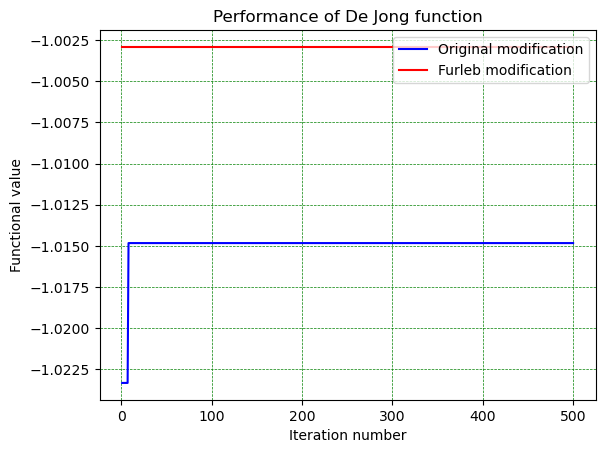

-->Test number 1
Best solution found by original is:  [0.99499115 0.04899335]
And function result for this solution is:  -1.467439570510253
Totally elapsed for original  0.5735284  seconds
Best solution found by furleb modification is:  -1.9963522978906774
And function result for this solution is:  [-0.98958342 -0.99306963]
Totally elapsed for furleb modification  2.9211094  seconds


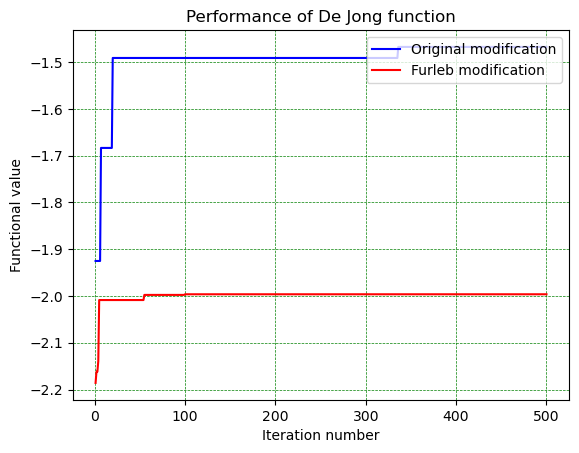

-->Test number 2
Best solution found by original is:  [0.99384099 0.03206202]
And function result for this solution is:  -1.1984632114411813
Totally elapsed for original  0.59529  seconds
Best solution found by furleb modification is:  -1.9904930640345881
And function result for this solution is:  [-0.9946396 -0.9932859]
Totally elapsed for furleb modification  3.5300996  seconds


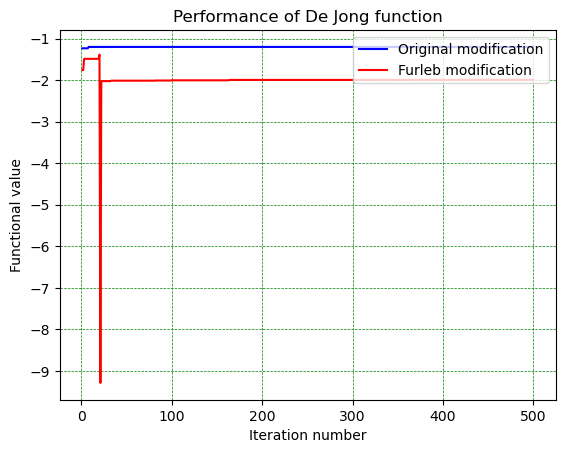

-->Test number 3
Best solution found by original is:  [0.00394332 0.99177889]
And function result for this solution is:  -1.0000482758251703
Totally elapsed for original  0.5205615  seconds
Best solution found by furleb modification is:  -1.2040434450068158
And function result for this solution is:  [1.02744121e+00 8.26910802e-04]
Totally elapsed for furleb modification  3.381148  seconds


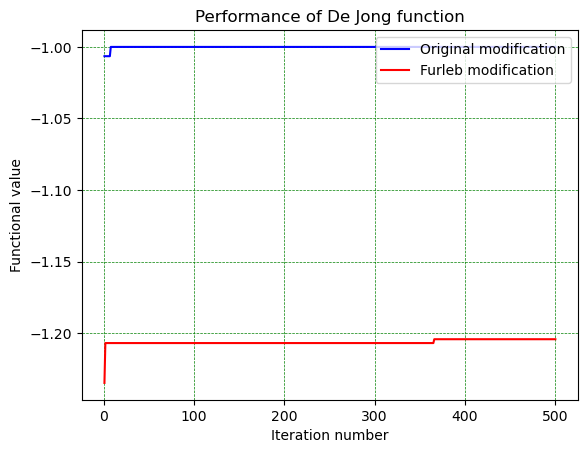

-->Test number 4
Best solution found by original is:  [0.03684758 0.02401444]
And function result for this solution is:  -0.38236630834432717
Totally elapsed for original  0.1700812  seconds
Best solution found by furleb modification is:  -0.43300232289325535
And function result for this solution is:  [0.04275962 0.01911874]
Totally elapsed for furleb modification  3.0071941  seconds


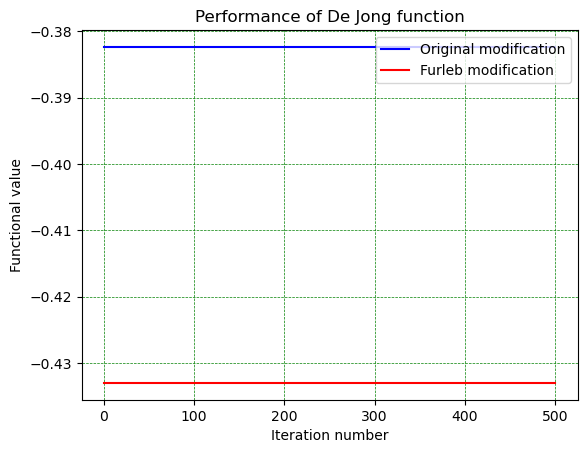

-->Test number 5
Best solution found by original is:  [1.02416392 0.03620737]
And function result for this solution is:  -1.4229194207055187
Totally elapsed for original  0.567189  seconds
Best solution found by furleb modification is:  -0.4449352382278775
And function result for this solution is:  [-0.00311096  0.04742936]
Totally elapsed for furleb modification  3.3844911  seconds


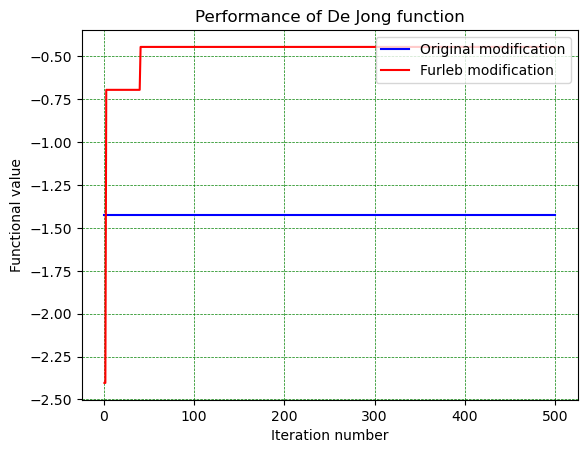

-->Test number 6
Best solution found by original is:  [ 0.01209519 -0.98067189]
And function result for this solution is:  -1.064377308041399
Totally elapsed for original  0.1746195  seconds
Best solution found by furleb modification is:  -1.196669812097948
And function result for this solution is:  [0.02471457 1.01514135]
Totally elapsed for furleb modification  3.0976139  seconds


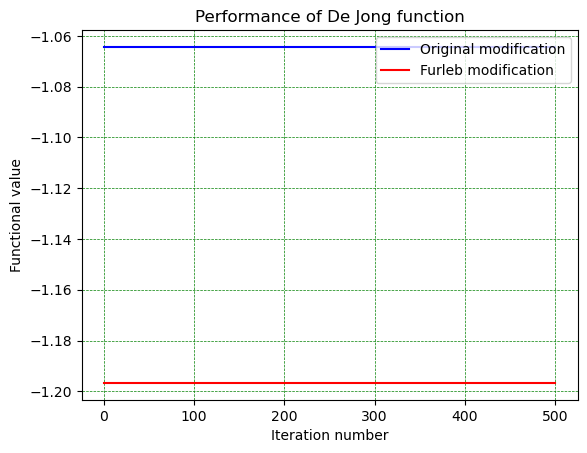

-->Test number 7
Best solution found by original is:  [-0.99137482  0.03531533]
And function result for this solution is:  -1.2439259611097437
Totally elapsed for original  0.1600257  seconds
Best solution found by furleb modification is:  -1.9905986348274478
And function result for this solution is:  [-0.99680993 -0.99489365]
Totally elapsed for furleb modification  3.0749479  seconds


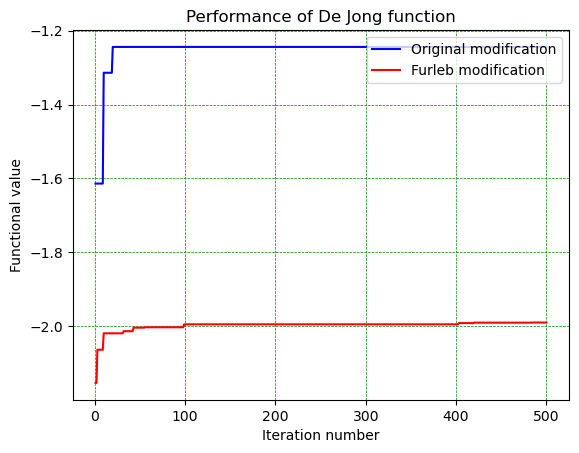

-->Test number 8
Best solution found by original is:  [0.03383689 0.02880785]
And function result for this solution is:  -0.39049340816694844
Totally elapsed for original  0.2023279  seconds
Best solution found by furleb modification is:  -0.11256079274749986
And function result for this solution is:  [-0.00520958  0.02326341]
Totally elapsed for furleb modification  3.6717852  seconds


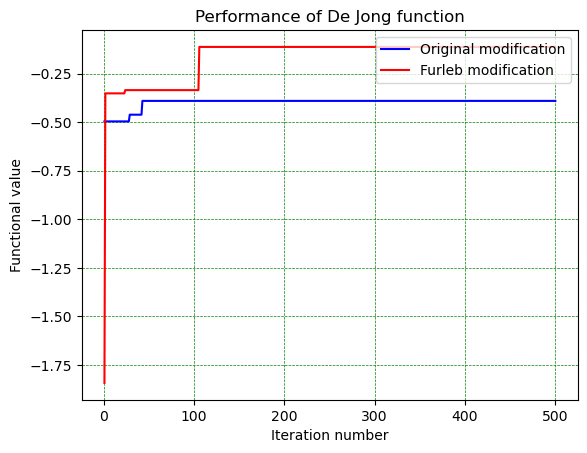

-->Test number 9
Best solution found by original is:  [0.06290187 0.04302213]
And function result for this solution is:  -1.139839075926048
Totally elapsed for original  0.3093128  seconds
Best solution found by furleb modification is:  -0.1404447807046747
And function result for this solution is:  [ 0.02539841 -0.00801313]
Totally elapsed for furleb modification  3.40585  seconds


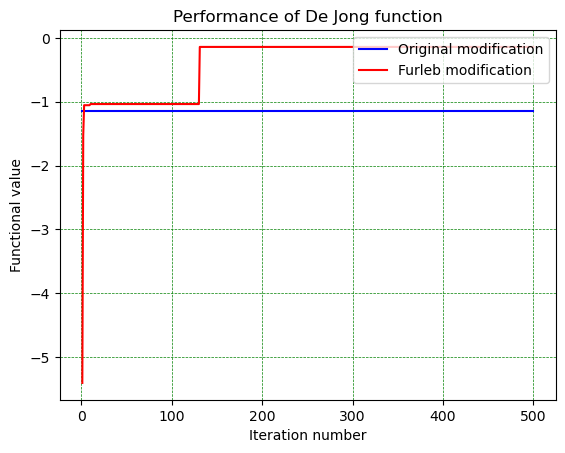

In [75]:
function_name = "De Jong function"
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    perform_comparsion_test(function_name, second_de_jong_function, -2.048, 2.048, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)

## Тестирование функции Есома

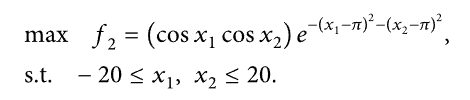

-->Test number 0
Best solution found by original is:  [3.71369539 3.1168747 ]
And function result for this solution is:  0.605523548903075
Totally elapsed for original  1.0835625  seconds
Best solution found by furleb modification is:  6.78856410422056e-12
And function result for this solution is:  [ 3.548646   -1.66777597]
Totally elapsed for furleb modification  3.1979908  seconds


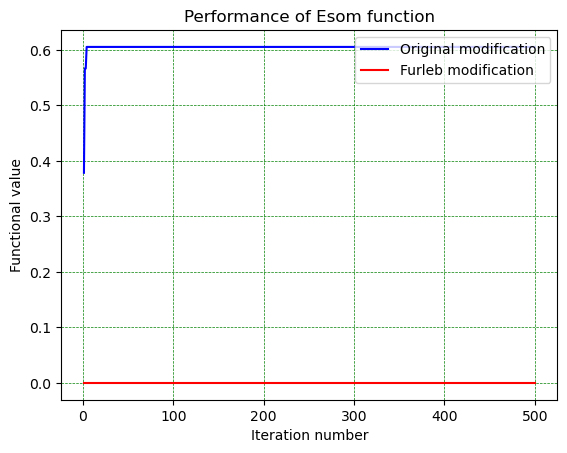

-->Test number 1
Best solution found by original is:  [4.41200197 3.11571492]
And function result for this solution is:  0.05885301823932838
Totally elapsed for original  2.2295793  seconds
Best solution found by furleb modification is:  7.533211341848882e-65
And function result for this solution is:  [11.09497364 12.19767442]
Totally elapsed for furleb modification  3.4425411  seconds


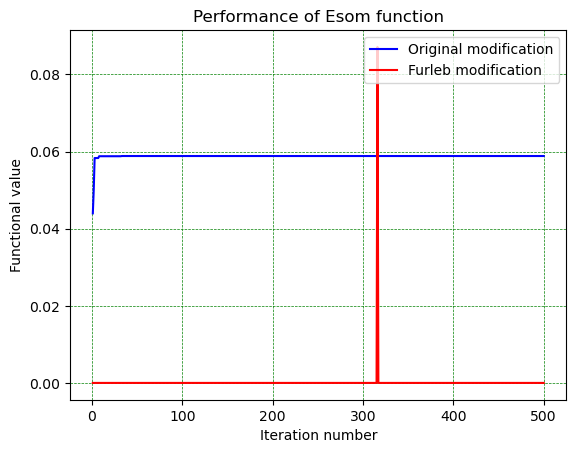

-->Test number 2
Best solution found by original is:  [4.14602881 3.4756281 ]
And function result for this solution is:  0.16531538514513935
Totally elapsed for original  0.9260596  seconds
Best solution found by furleb modification is:  4.149982552364665e-08
And function result for this solution is:  [6.63760865 4.99130642]
Totally elapsed for furleb modification  3.4462704  seconds


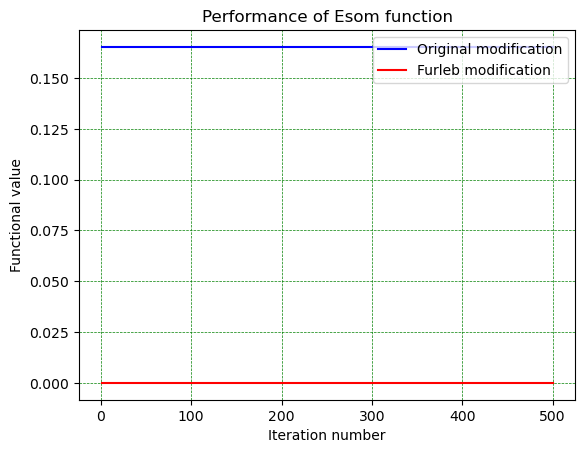

-->Test number 3
Best solution found by original is:  [3.2148181  3.29651377]
And function result for this solution is:  0.956863539652353
Totally elapsed for original  1.0624047  seconds
Best solution found by furleb modification is:  1.103862681907977e-216
And function result for this solution is:  [-19.04728297   1.13242139]
Totally elapsed for furleb modification  3.5831919  seconds


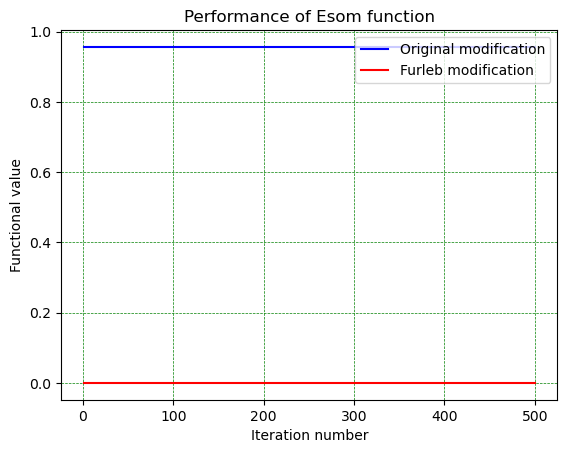

-->Test number 4
Best solution found by original is:  [3.11529317 3.74021702]
And function result for this solution is:  0.5767109406888355
Totally elapsed for original  2.2321573  seconds
Best solution found by furleb modification is:  0.946044361093682
And function result for this solution is:  [3.16732385 3.33196442]
Totally elapsed for furleb modification  3.4231406  seconds


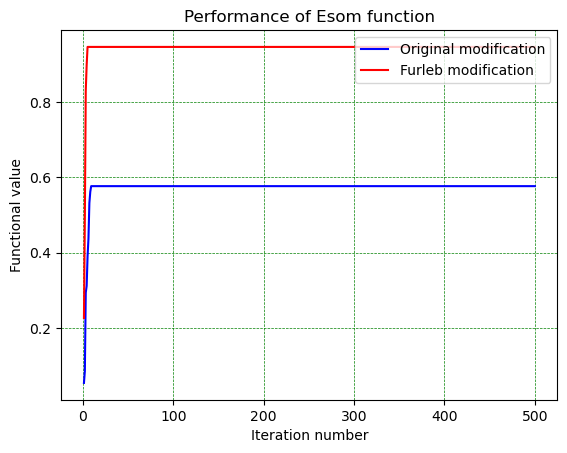

-->Test number 5
Best solution found by original is:  [3.41471825 3.31977411]
And function result for this solution is:  0.852077981618046
Totally elapsed for original  2.116841  seconds
Best solution found by furleb modification is:  0.019453369493629764
And function result for this solution is:  [3.17382882 4.56435029]
Totally elapsed for furleb modification  3.7560759  seconds


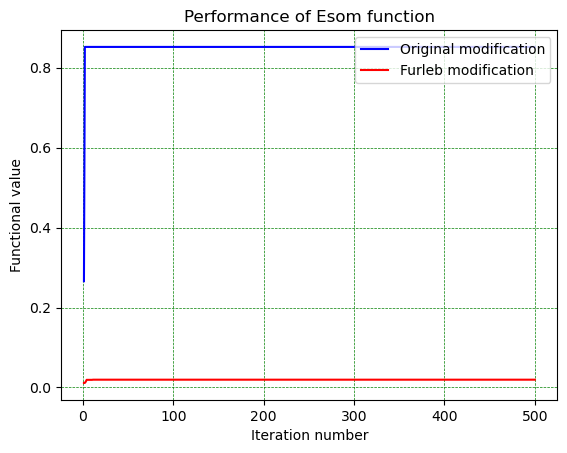

-->Test number 6
Best solution found by original is:  [3.83146553 4.29993886]
And function result for this solution is:  0.05021263885587583
Totally elapsed for original  2.1380115  seconds
Best solution found by furleb modification is:  2.0382352373570536e-211
And function result for this solution is:  [-11.06036776 -13.59287189]
Totally elapsed for furleb modification  3.4879866  seconds


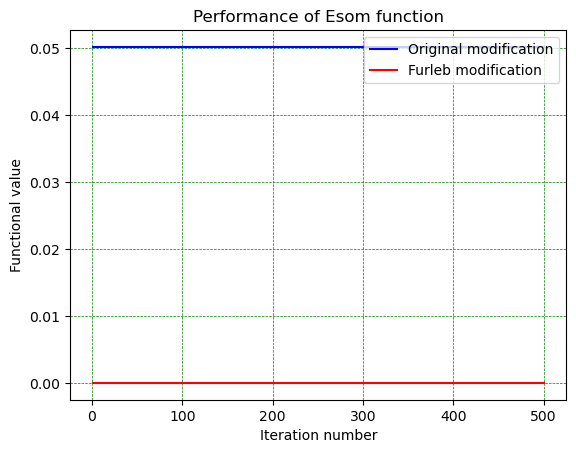

-->Test number 7
Best solution found by original is:  [5.71508744 1.31176959]
And function result for this solution is:  1.0089294247125422e-05
Totally elapsed for original  0.977587  seconds
Best solution found by furleb modification is:  0.5615361186085117
And function result for this solution is:  [3.14995792 3.75470743]
Totally elapsed for furleb modification  3.6105579  seconds


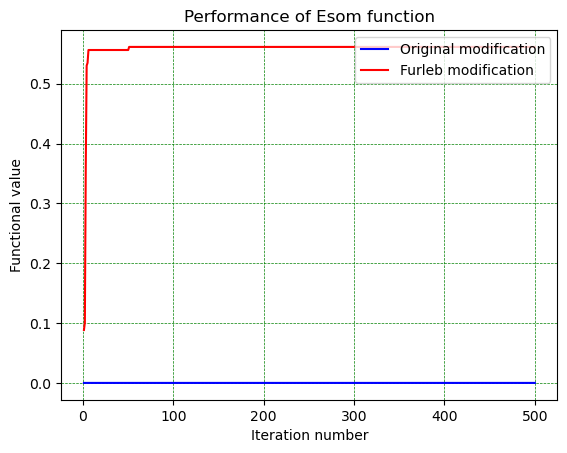

-->Test number 8
Best solution found by original is:  [3.18078971 4.6231714 ]
And function result for this solution is:  0.009898375948731183
Totally elapsed for original  1.0066231  seconds
Best solution found by furleb modification is:  1.2082683188318075e-196
And function result for this solution is:  [-17.94637662   5.50779531]
Totally elapsed for furleb modification  3.5642692  seconds


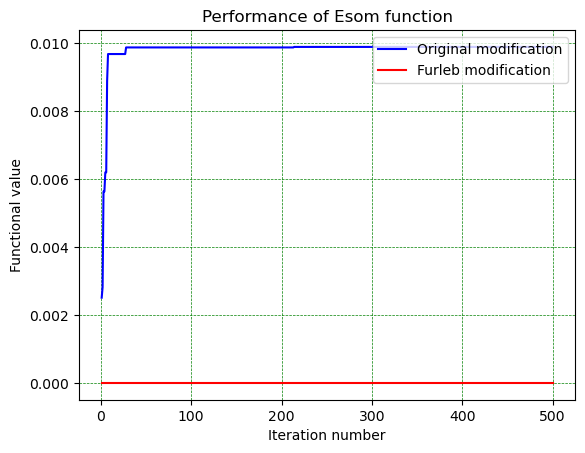

-->Test number 9
Best solution found by original is:  [3.11708182 4.70793562]
And function result for this solution is:  0.00038263412865925206
Totally elapsed for original  0.2982084  seconds
Best solution found by furleb modification is:  0.9902025192259575
And function result for this solution is:  [3.16090995 3.22026008]
Totally elapsed for furleb modification  3.6278511  seconds


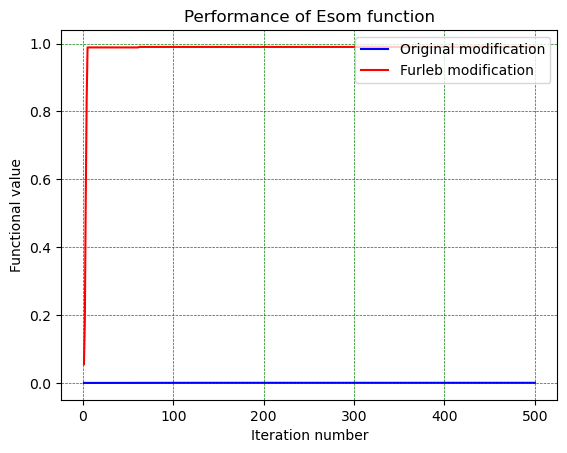

In [76]:
function_name = "Esom function"
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    perform_comparsion_test(function_name, esom_function, -20.0, 20.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)

## Прерывистый тест

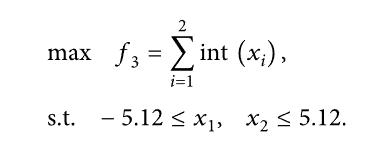

-->Test number 0
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  2.113687  seconds
Best solution found by furleb modification is:  10
And function result for this solution is:  [5.12 5.12]
Totally elapsed for furleb modification  1.172748  seconds


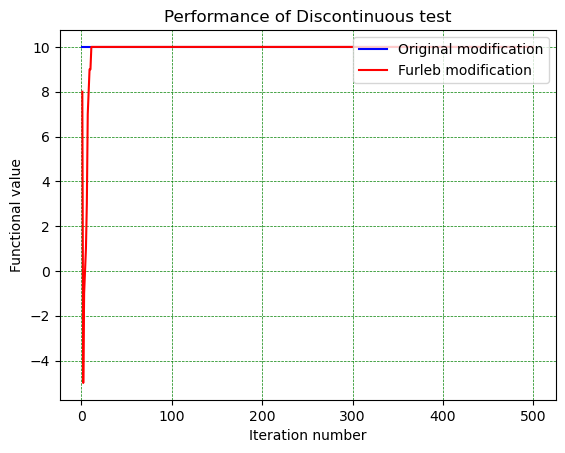

-->Test number 1
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  0.1170972  seconds
Best solution found by furleb modification is:  10
And function result for this solution is:  [5.12 5.12]
Totally elapsed for furleb modification  1.2992339  seconds


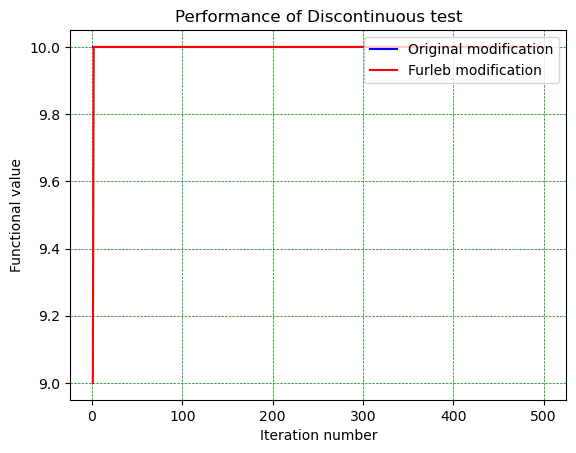

-->Test number 2
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  0.1372955  seconds
Best solution found by furleb modification is:  -7
And function result for this solution is:  [-5.12       -2.34547945]
Totally elapsed for furleb modification  2.6553768  seconds


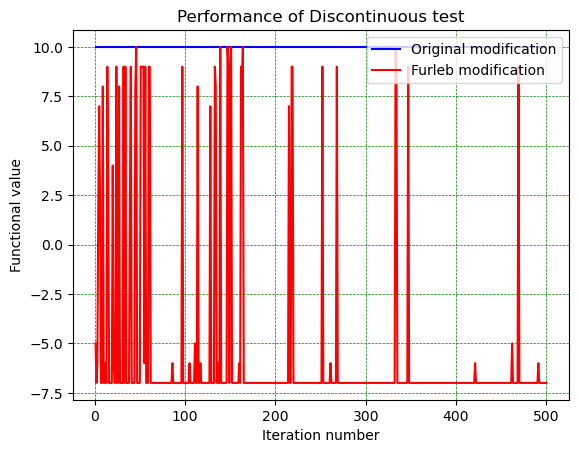

-->Test number 3
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  0.1226785  seconds
Best solution found by furleb modification is:  -7
And function result for this solution is:  [-5.12       -2.36337931]
Totally elapsed for furleb modification  2.5668396  seconds


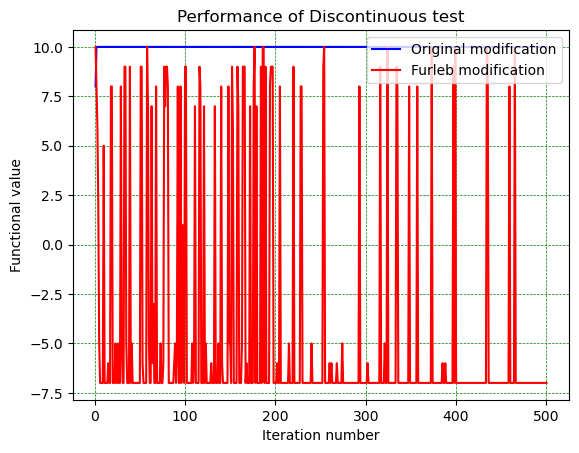

-->Test number 4
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  0.1474328  seconds
Best solution found by furleb modification is:  10
And function result for this solution is:  [5.12       5.08393438]
Totally elapsed for furleb modification  1.3372397  seconds


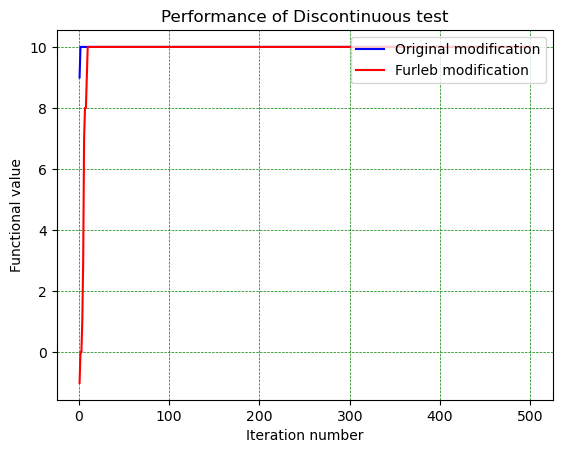

-->Test number 5
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  0.1231607  seconds
Best solution found by furleb modification is:  10
And function result for this solution is:  [5.12 5.12]
Totally elapsed for furleb modification  1.264308  seconds


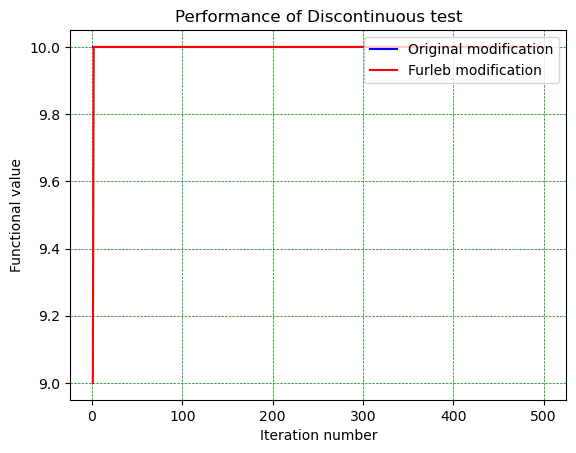

-->Test number 6
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  0.1427495  seconds
Best solution found by furleb modification is:  -3
And function result for this solution is:  [-4.63973984  1.03987189]
Totally elapsed for furleb modification  2.8145409  seconds


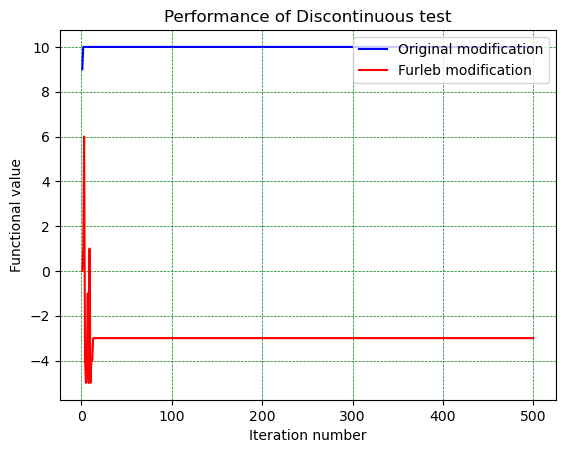

-->Test number 7
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  0.1315126  seconds
Best solution found by furleb modification is:  10
And function result for this solution is:  [5.12 5.12]
Totally elapsed for furleb modification  0.1409232  seconds


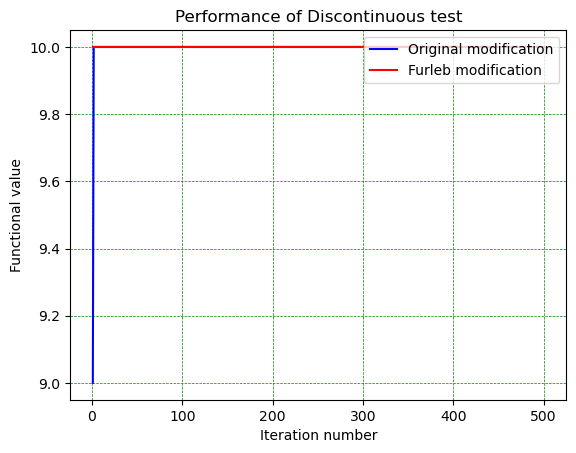

-->Test number 8
Best solution found by original is:  [5.12       5.11056536]
And function result for this solution is:  10
Totally elapsed for original  0.130822  seconds
Best solution found by furleb modification is:  9
And function result for this solution is:  [5.12       4.04459718]
Totally elapsed for furleb modification  1.4126617  seconds


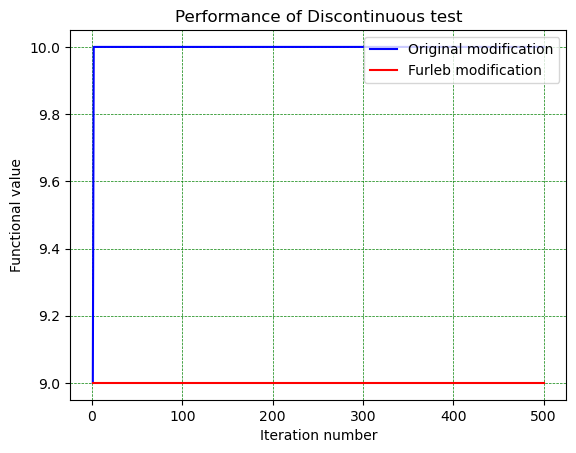

-->Test number 9
Best solution found by original is:  [5.12 5.12]
And function result for this solution is:  10
Totally elapsed for original  0.1340738  seconds
Best solution found by furleb modification is:  10
And function result for this solution is:  [5.12 5.12]
Totally elapsed for furleb modification  1.2635824  seconds


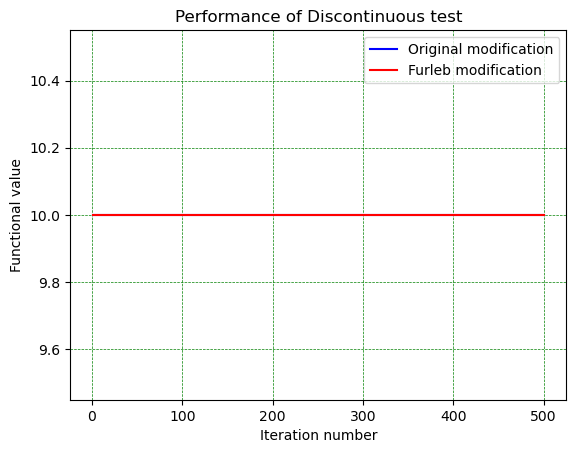

In [77]:
function_name = "Discontinuous test"
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    perform_comparsion_test(function_name, discontinuous_test, -5.12, 5.12, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)

## Тестирование функции Мишры

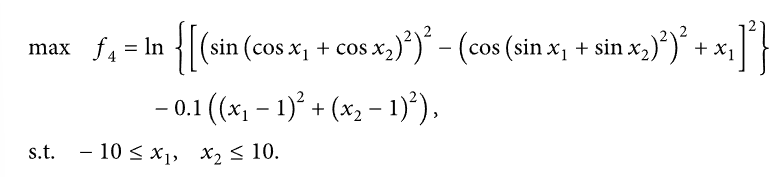

-->Test number 0
Best solution found by original is:  [2.88567111 1.82315224]
And function result for this solution is:  2.283948297564592
Totally elapsed for original  2.8180141  seconds
Best solution found by furleb modification is:  2.231111130967745
And function result for this solution is:  [3.03687038 1.77999565]
Totally elapsed for furleb modification  3.050728  seconds


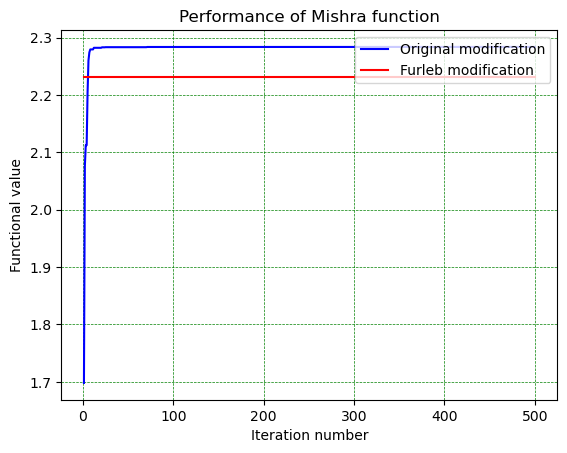

-->Test number 1
Best solution found by original is:  [2.88640805 1.82429906]
And function result for this solution is:  2.2839460933018767
Totally elapsed for original  1.1687336  seconds
Best solution found by furleb modification is:  1.30129269668464
And function result for this solution is:  [-2.21664769  1.07285812]
Totally elapsed for furleb modification  3.3731561  seconds


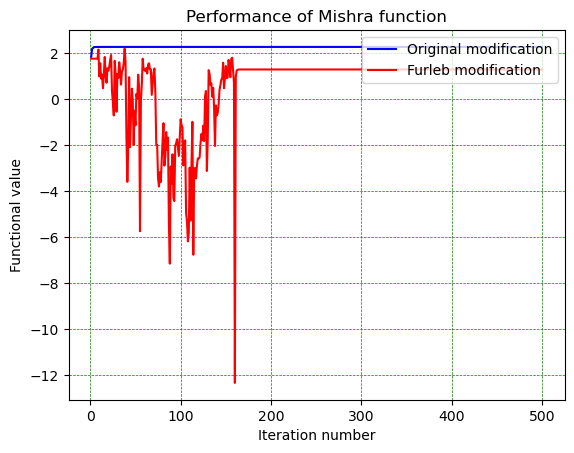

-->Test number 2
Best solution found by original is:  [2.88238692 1.82535619]
And function result for this solution is:  2.2839101615924866
Totally elapsed for original  0.9081653  seconds
Best solution found by furleb modification is:  2.2616861821455734
And function result for this solution is:  [2.86930677 1.74524688]
Totally elapsed for furleb modification  3.2246607  seconds


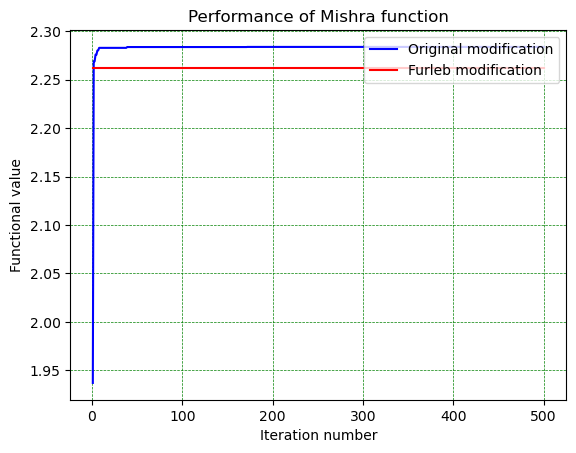

-->Test number 3
Best solution found by original is:  [2.88795838 1.82169811]
And function result for this solution is:  2.283940790353664
Totally elapsed for original  0.9841645  seconds
Best solution found by furleb modification is:  2.268366062070994
And function result for this solution is:  [2.95284122 1.75858271]
Totally elapsed for furleb modification  3.0809143  seconds


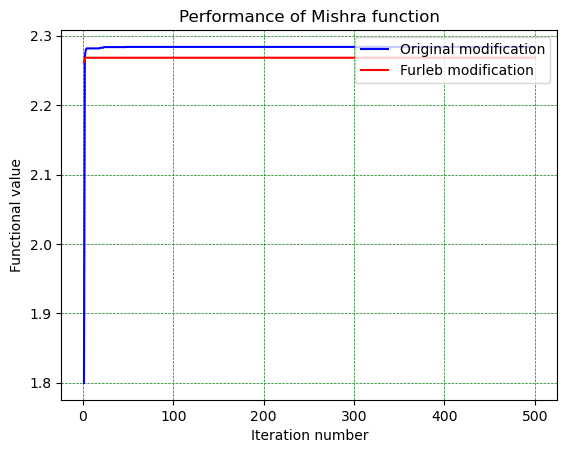

-->Test number 4
Best solution found by original is:  [ 4.8481342  -0.17942413]
And function result for this solution is:  1.8643350203531792
Totally elapsed for original  1.1895956  seconds
Best solution found by furleb modification is:  0.1032246597867652
And function result for this solution is:  [-1.56130634 -2.19681267]
Totally elapsed for furleb modification  3.3547893  seconds


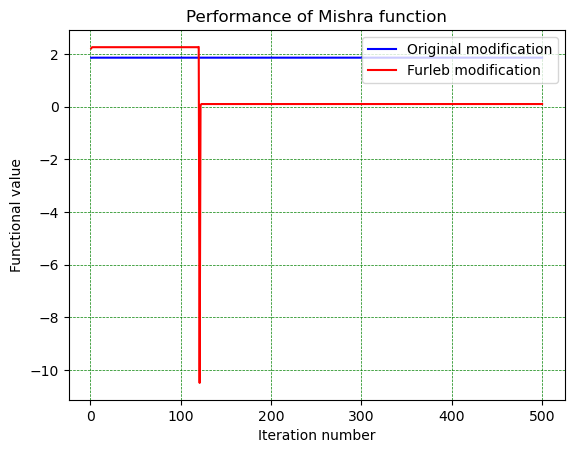

-->Test number 5
Best solution found by original is:  [2.88503215 1.82239566]
And function result for this solution is:  2.28393904254004
Totally elapsed for original  1.1554781  seconds
Best solution found by furleb modification is:  2.2679060831422992
And function result for this solution is:  [2.93193094 1.86168909]
Totally elapsed for furleb modification  3.2322504  seconds


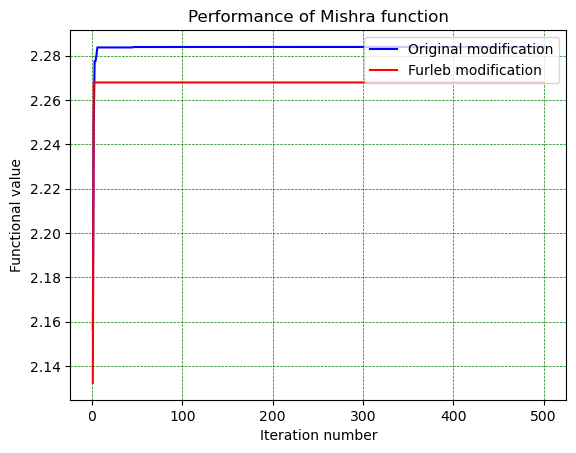

-->Test number 6
Best solution found by original is:  [2.88555797 1.82189953]
And function result for this solution is:  2.283939243169074
Totally elapsed for original  1.1406543  seconds
Best solution found by furleb modification is:  1.9805665808268305
And function result for this solution is:  [2.50553361 2.17704451]
Totally elapsed for furleb modification  3.0687728  seconds


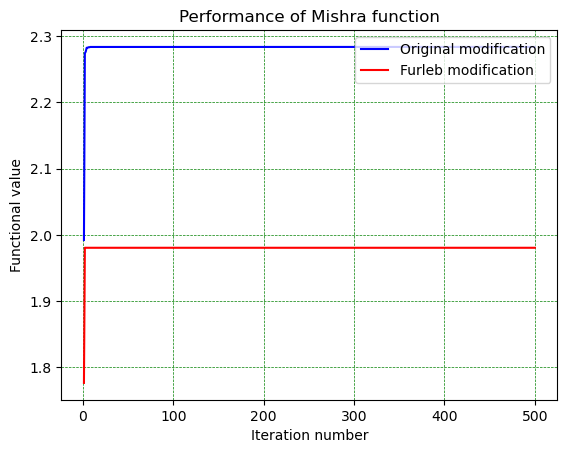

-->Test number 7
Best solution found by original is:  [2.88614792 1.82422051]
And function result for this solution is:  2.2839472862273786
Totally elapsed for original  1.4937359  seconds
Best solution found by furleb modification is:  2.2525949640324483
And function result for this solution is:  [2.78845234 1.92276806]
Totally elapsed for furleb modification  3.1715697  seconds


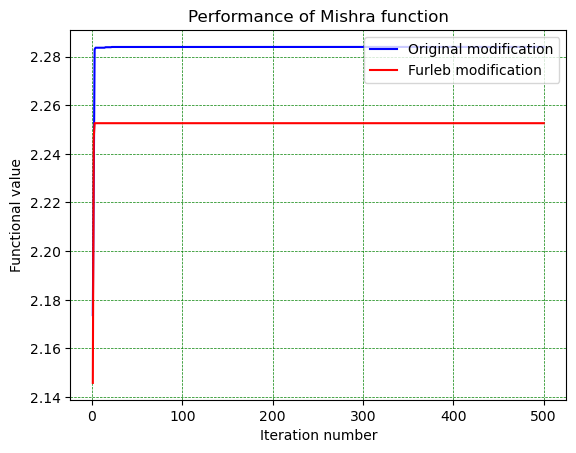

-->Test number 8
Best solution found by original is:  [2.88676963 1.8210474 ]
And function result for this solution is:  2.2839366659605096
Totally elapsed for original  1.1167738  seconds
Best solution found by furleb modification is:  2.2707670384792173
And function result for this solution is:  [2.81660322 1.84613331]
Totally elapsed for furleb modification  3.2615483  seconds


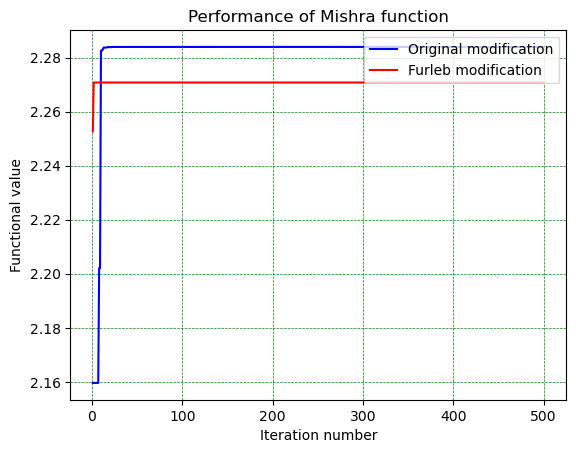

-->Test number 9
Best solution found by original is:  [2.88417409 1.82325247]
And function result for this solution is:  2.28393508869159
Totally elapsed for original  1.4666336  seconds
Best solution found by furleb modification is:  2.2683873098853344
And function result for this solution is:  [2.90695187 1.88025093]
Totally elapsed for furleb modification  3.194216  seconds


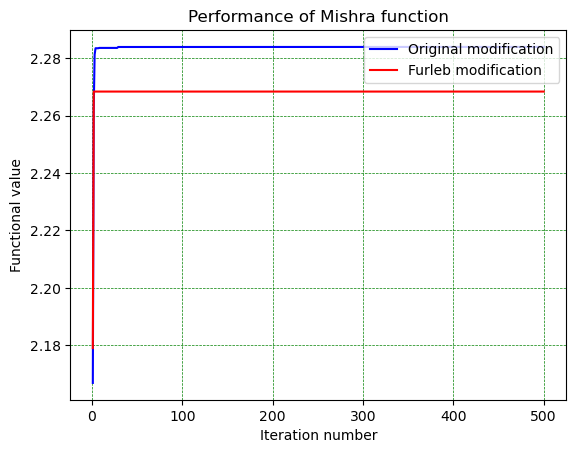

In [78]:
function_name = "Mishra function"
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    perform_comparsion_test(function_name, mishra_function, -10.0, 10.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)

## Стохастический тест

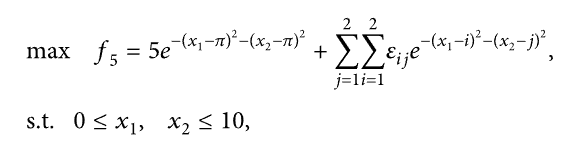

-->Test number 0
Best solution found by original is:  [3.14199332 3.1420193 ]
And function result for this solution is:  5.000092140769711
Totally elapsed for original  5.526018  seconds
Best solution found by furleb modification is:  5.000003697514925
And function result for this solution is:  [3.14454932 3.14047551]
Totally elapsed for furleb modification  2.5630287  seconds


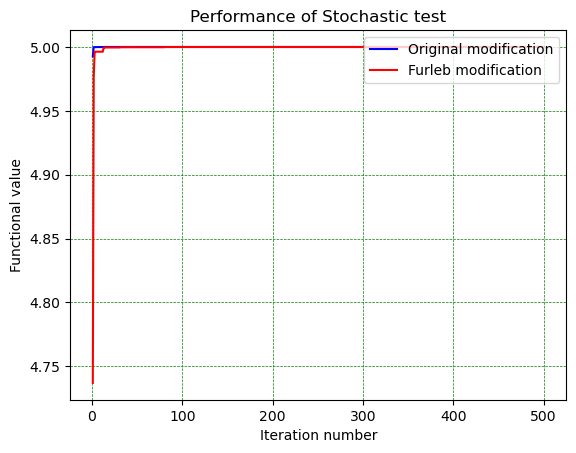

-->Test number 1
Best solution found by original is:  [3.1419554  3.14166542]
And function result for this solution is:  5.000099860812462
Totally elapsed for original  3.3649524  seconds
Best solution found by furleb modification is:  4.999987790385438
And function result for this solution is:  [3.13819796 3.14269271]
Totally elapsed for furleb modification  2.4548419  seconds


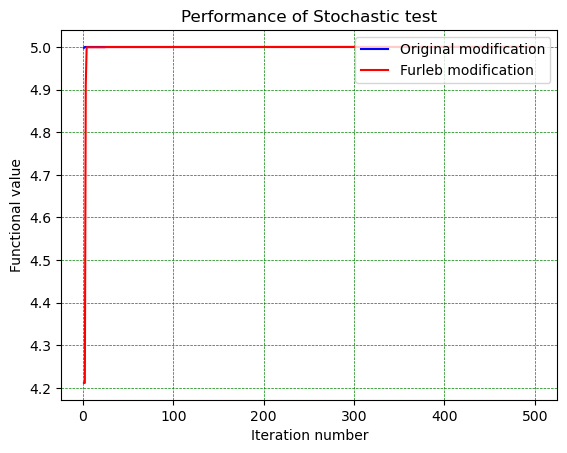

-->Test number 2
Best solution found by original is:  [3.14221018 3.14195504]
And function result for this solution is:  5.000091619974887
Totally elapsed for original  3.4302828  seconds
Best solution found by furleb modification is:  5.000054815402597
And function result for this solution is:  [3.14162992 3.14203242]
Totally elapsed for furleb modification  2.4348645  seconds


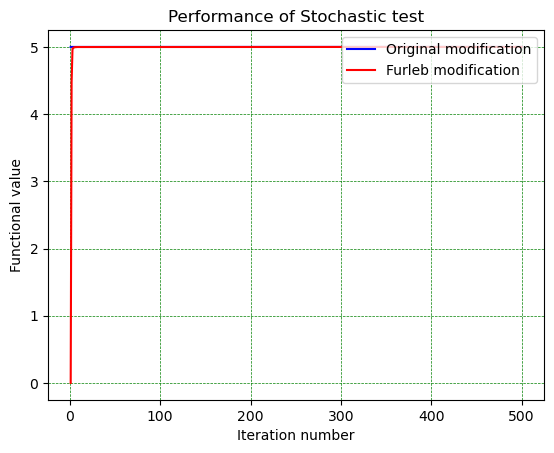

-->Test number 3
Best solution found by original is:  [3.14241199 3.14123215]
And function result for this solution is:  5.000095323607433
Totally elapsed for original  3.3217092  seconds
Best solution found by furleb modification is:  5.000014526568073
And function result for this solution is:  [3.14449269 3.14446023]
Totally elapsed for furleb modification  2.5295023  seconds


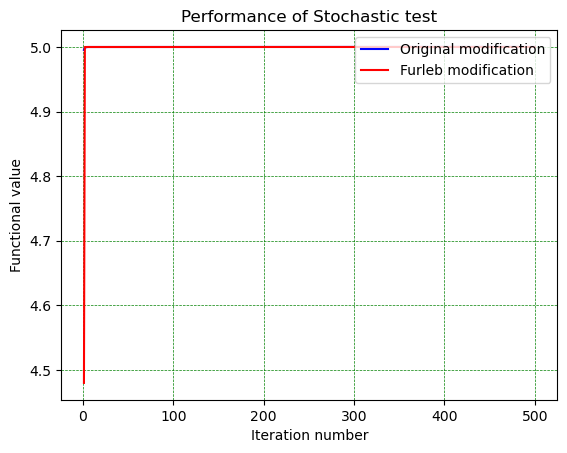

-->Test number 4
Best solution found by original is:  [3.14106614 3.14124346]
And function result for this solution is:  5.000094810404076
Totally elapsed for original  3.292504  seconds
Best solution found by furleb modification is:  5.000079139932549
And function result for this solution is:  [3.14041688 3.14049881]
Totally elapsed for furleb modification  2.4421811  seconds


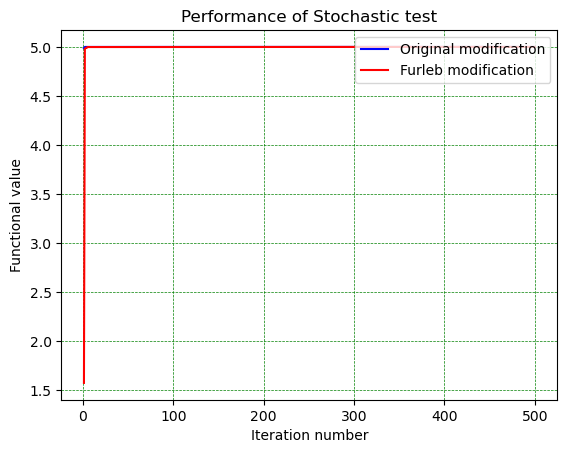

-->Test number 5
Best solution found by original is:  [3.14129141 3.14225226]
And function result for this solution is:  5.000091180952174
Totally elapsed for original  3.3961372  seconds
Best solution found by furleb modification is:  5.000037884465319
And function result for this solution is:  [3.14215539 3.14485086]
Totally elapsed for furleb modification  2.4353359  seconds


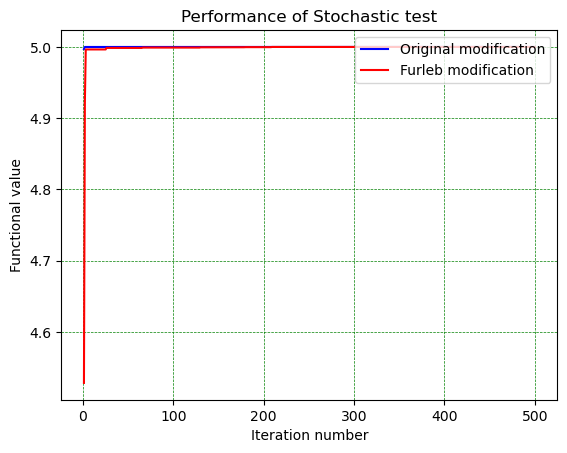

-->Test number 6
Best solution found by original is:  [3.14226091 3.14291358]
And function result for this solution is:  5.000087287724369
Totally elapsed for original  3.3295901  seconds
Best solution found by furleb modification is:  5.000000035950558
And function result for this solution is:  [3.14012393 3.14191742]
Totally elapsed for furleb modification  2.5094639  seconds


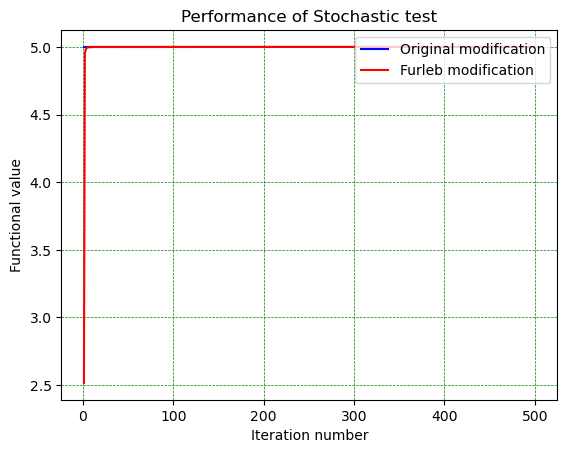

-->Test number 7
Best solution found by original is:  [3.14201216 3.14273016]
And function result for this solution is:  5.000092230853936
Totally elapsed for original  3.3387021  seconds
Best solution found by furleb modification is:  5.000028176784698
And function result for this solution is:  [3.14301843 3.14245306]
Totally elapsed for furleb modification  2.4105958  seconds


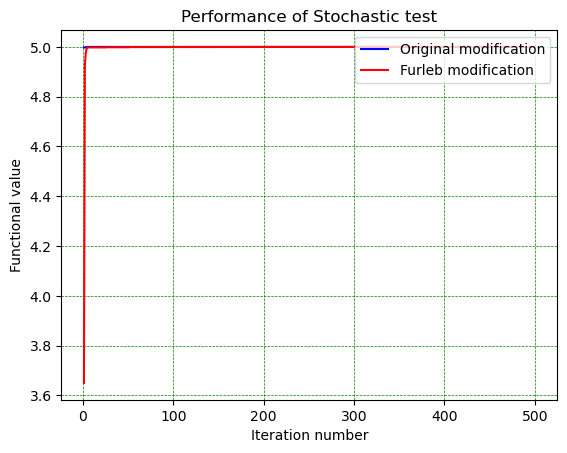

-->Test number 8
Best solution found by original is:  [3.14124423 3.14215434]
And function result for this solution is:  5.000099176258673
Totally elapsed for original  3.2970061  seconds
Best solution found by furleb modification is:  5.00001317649977
And function result for this solution is:  [3.14194948 3.14416599]
Totally elapsed for furleb modification  2.4414168  seconds


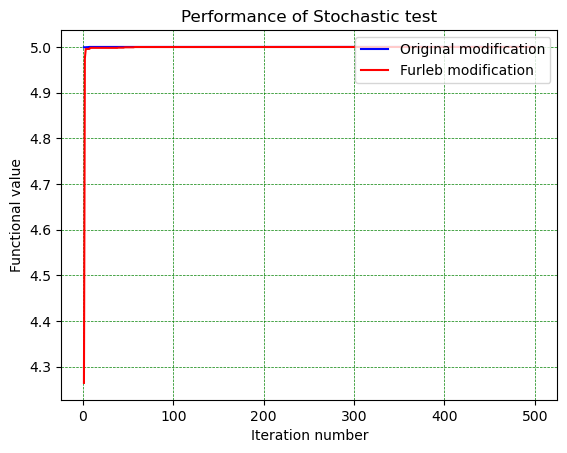

-->Test number 9
Best solution found by original is:  [3.14244209 3.14131208]
And function result for this solution is:  5.000083513336446
Totally elapsed for original  3.480807  seconds
Best solution found by furleb modification is:  5.000026677510338
And function result for this solution is:  [3.14030517 3.13929078]
Totally elapsed for furleb modification  2.4599739  seconds


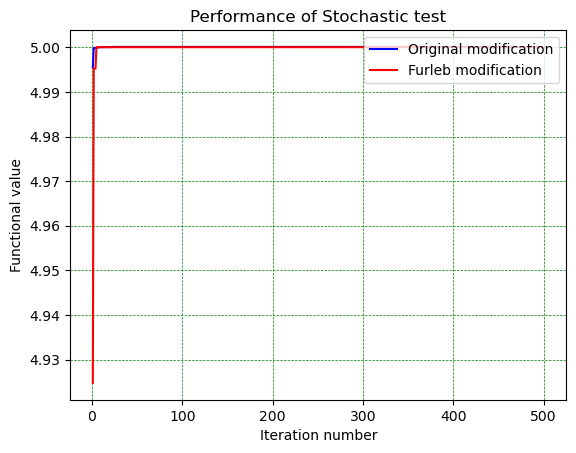

In [79]:
function_name = "Stochastic test"
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    perform_comparsion_test(function_name, stochastic_test, 0.0, 10.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)

## Тестирование функции Стеблинского

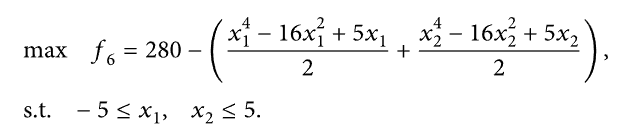

-->Test number 0
Best solution found by original is:  [-2.44827149 -2.91096328]
And function result for this solution is:  355.2739363788396
Totally elapsed for original  4.041305  seconds
Best solution found by furleb modification is:  358.3179295568586
And function result for this solution is:  [-2.9039292 -2.8745358]
Totally elapsed for furleb modification  1.3943274  seconds


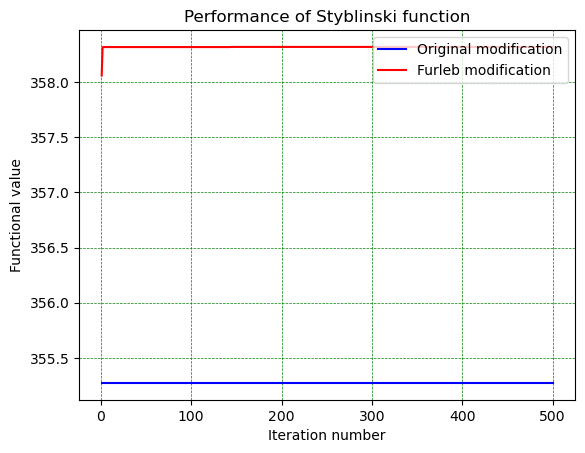

-->Test number 1
Best solution found by original is:  [-2.89726786 -2.87838645]
And function result for this solution is:  358.3208108616198
Totally elapsed for original  2.7584513  seconds
Best solution found by furleb modification is:  358.26021939070563
And function result for this solution is:  [-2.85379887 -2.86154971]
Totally elapsed for furleb modification  1.494771  seconds


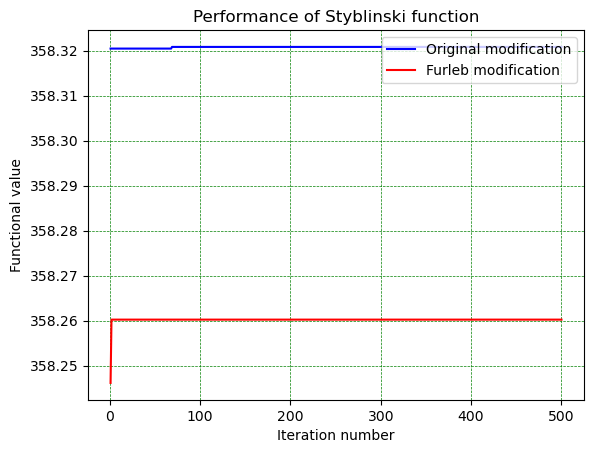

-->Test number 2
Best solution found by original is:  [-2.83097827 -2.85320043]
And function result for this solution is:  358.2004368560793
Totally elapsed for original  2.2444024  seconds
Best solution found by furleb modification is:  358.33150195444546
And function result for this solution is:  [-2.90444872 -2.89666083]
Totally elapsed for furleb modification  1.3383882  seconds


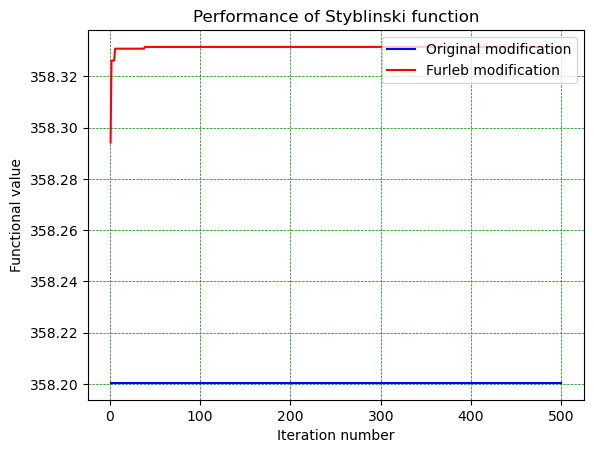

-->Test number 3
Best solution found by original is:  [-2.75937441 -2.74140848]
And function result for this solution is:  357.5600588483573
Totally elapsed for original  2.4014056  seconds
Best solution found by furleb modification is:  358.2939058371727
And function result for this solution is:  [-2.88783983 -2.8587312 ]
Totally elapsed for furleb modification  1.4938723  seconds


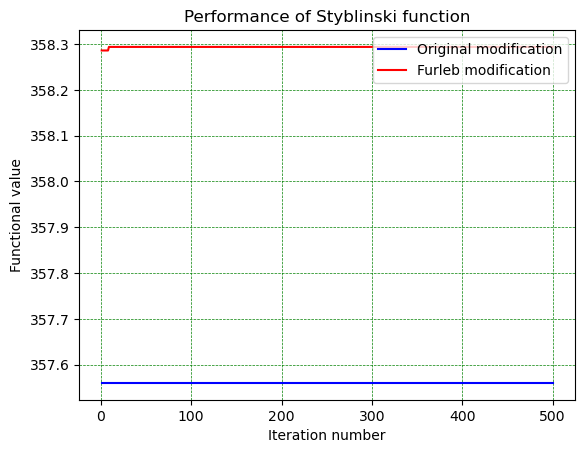

-->Test number 4
Best solution found by original is:  [-2.87666093 -2.6779477 ]
And function result for this solution is:  357.5053743279808
Totally elapsed for original  2.7525362  seconds
Best solution found by furleb modification is:  358.32921407033336
And function result for this solution is:  [-2.89125467 -2.89804082]
Totally elapsed for furleb modification  1.768416  seconds


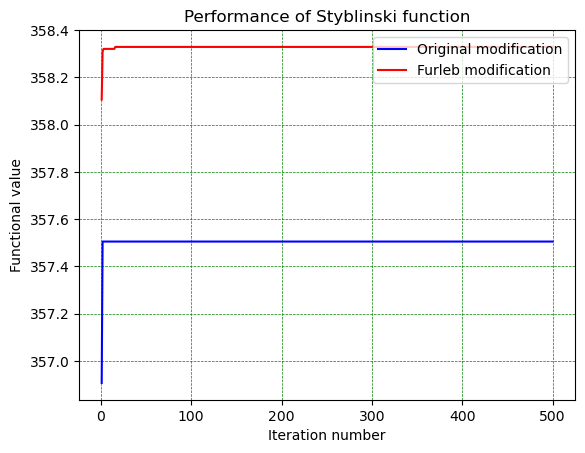

-->Test number 5
Best solution found by original is:  [-2.75870747 -2.82659327]
And function result for this solution is:  357.887330085071
Totally elapsed for original  2.3614805  seconds
Best solution found by furleb modification is:  358.31905542895123
And function result for this solution is:  [-2.89432567 -2.8772794 ]
Totally elapsed for furleb modification  1.3744544  seconds


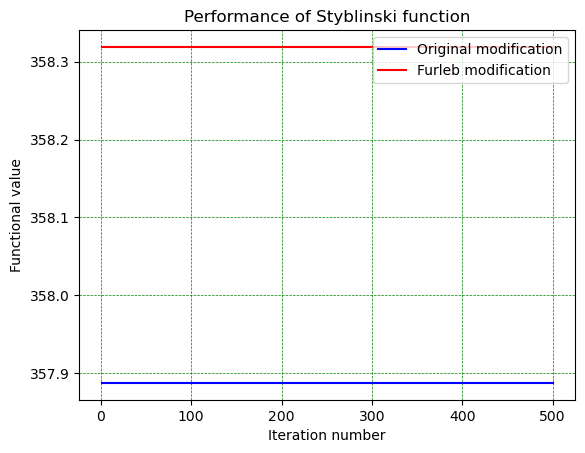

-->Test number 6
Best solution found by original is:  [-2.73269903 -2.89616086]
And function result for this solution is:  357.85527409729485
Totally elapsed for original  2.441896  seconds
Best solution found by furleb modification is:  358.3250136367031
And function result for this solution is:  [-2.89100357 -2.88715351]
Totally elapsed for furleb modification  1.382014  seconds


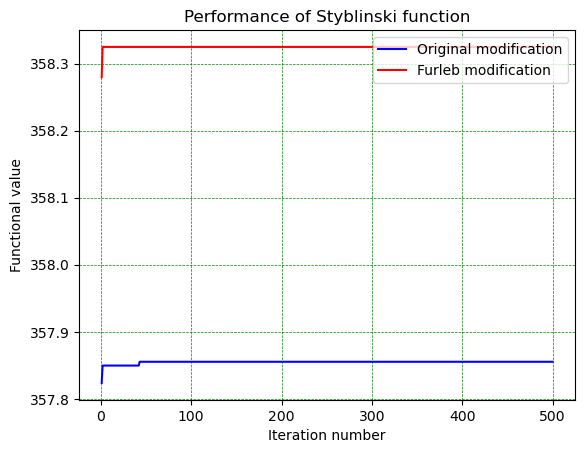

-->Test number 7
Best solution found by original is:  [-2.70551249 -2.92236384]
And function result for this solution is:  357.69243970260817
Totally elapsed for original  2.0752435  seconds
Best solution found by furleb modification is:  357.98381521842487
And function result for this solution is:  [-2.7825988  -2.82426272]
Totally elapsed for furleb modification  1.3857999  seconds


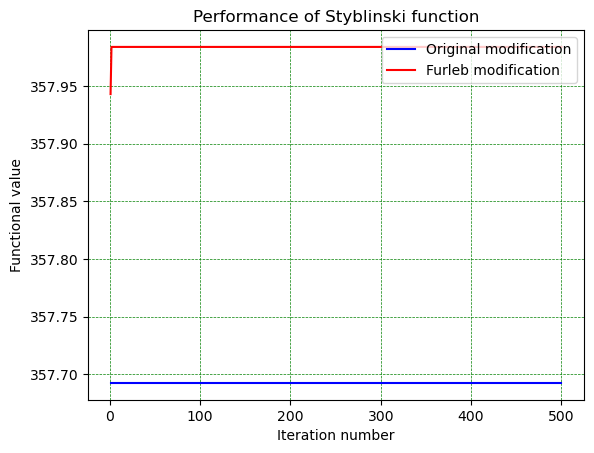

-->Test number 8
Best solution found by original is:  [-2.89296041 -2.85787681]
And function result for this solution is:  358.2949099737493
Totally elapsed for original  1.814064  seconds
Best solution found by furleb modification is:  358.3271998942829
And function result for this solution is:  [-2.89879282 -2.88692506]
Totally elapsed for furleb modification  1.4042069  seconds


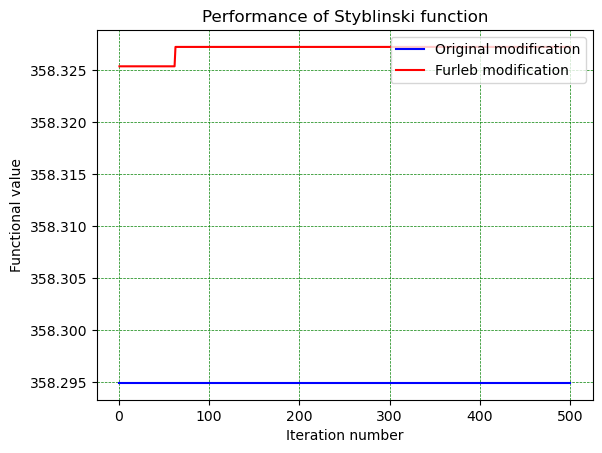

-->Test number 9
Best solution found by original is:  [-2.57930497 -2.89955127]
And function result for this solution is:  356.70669929375094
Totally elapsed for original  2.8590752  seconds
Best solution found by furleb modification is:  358.31467508609967
And function result for this solution is:  [-2.87208734 -2.89699863]
Totally elapsed for furleb modification  1.4645257  seconds


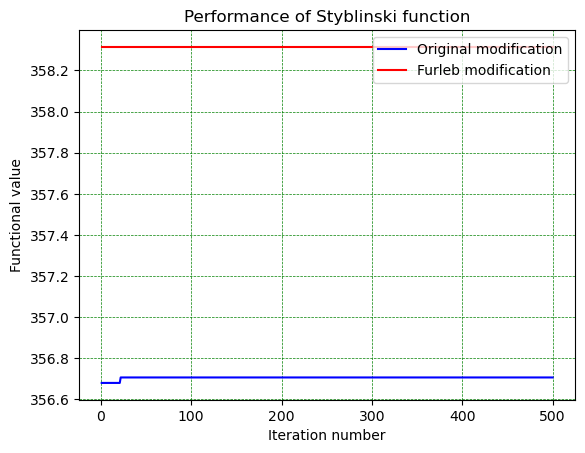

In [80]:
function_name = "Styblinski function"
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    perform_comparsion_test(function_name, styblinski_function, -5.0, 5.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)

## Тестирование функции Шуберта

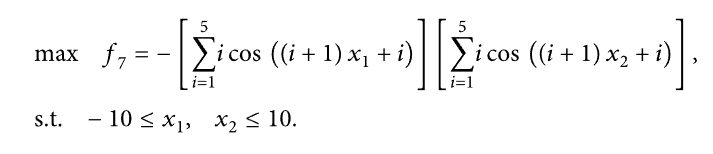

-->Test number 0
Best solution found by original is:  [-7.70941883  5.48607899]
And function result for this solution is:  186.70523676297333
Totally elapsed for original  2.7964502  seconds
Best solution found by furleb modification is:  186.71342244948877
And function result for this solution is:  [-7.70583965 -0.79911579]
Totally elapsed for furleb modification  6.1452085  seconds


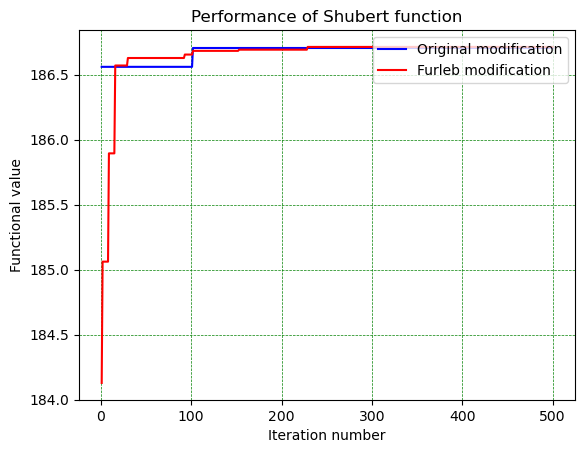

-->Test number 1
Best solution found by original is:  [-7.69937792 -0.79088001]
And function result for this solution is:  186.34787380231228
Totally elapsed for original  0.8400163  seconds
Best solution found by furleb modification is:  186.68360652826524
And function result for this solution is:  [-1.42067519 -7.08282631]
Totally elapsed for furleb modification  6.0728429  seconds


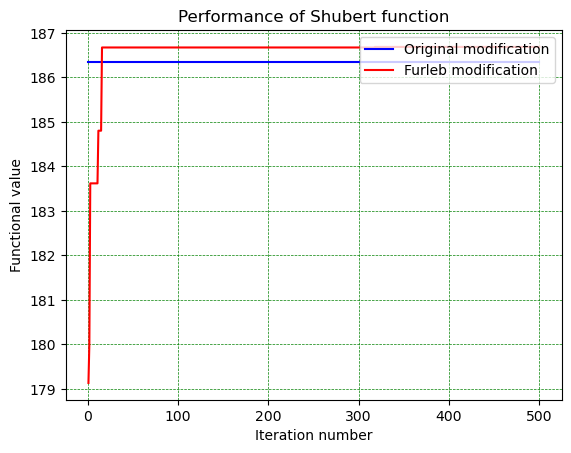

-->Test number 2
Best solution found by original is:  [ 4.85033414 -0.78092732]
And function result for this solution is:  185.76475749561502
Totally elapsed for original  0.744961  seconds
Best solution found by furleb modification is:  186.71596629999812
And function result for this solution is:  [-0.80063477 -1.42261581]
Totally elapsed for furleb modification  6.2258195  seconds


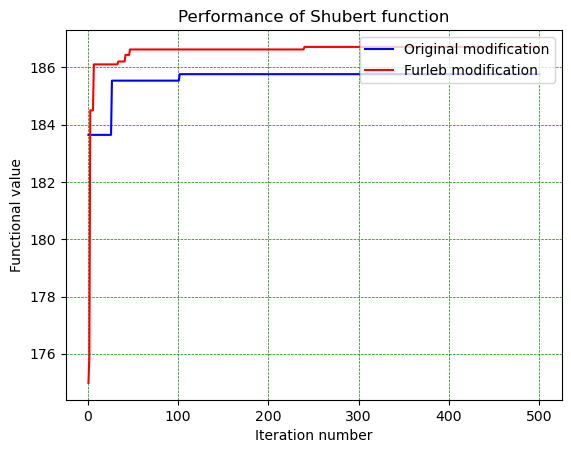

-->Test number 3
Best solution found by original is:  [ 4.86586787 -0.7823202 ]
And function result for this solution is:  185.87528255962073
Totally elapsed for original  0.8955138  seconds
Best solution found by furleb modification is:  186.7199384989358
And function result for this solution is:  [-1.42650583 -7.08178449]
Totally elapsed for furleb modification  6.1534639  seconds


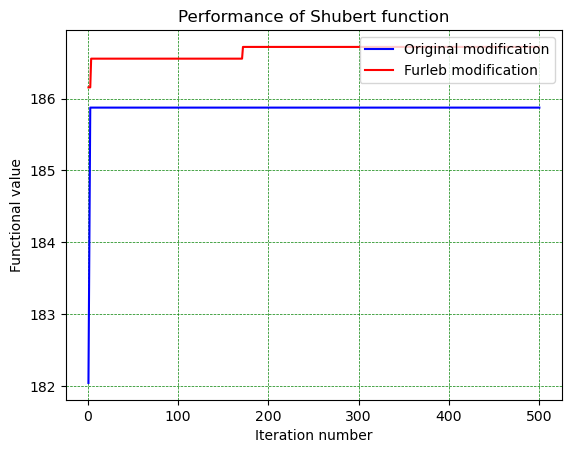

-->Test number 4
Best solution found by original is:  [-1.40158075  5.48074211]
And function result for this solution is:  185.42122029439784
Totally elapsed for original  0.766845  seconds
Best solution found by furleb modification is:  186.7282902414853
And function result for this solution is:  [-0.79978134 -1.42420806]
Totally elapsed for furleb modification  5.9788716  seconds


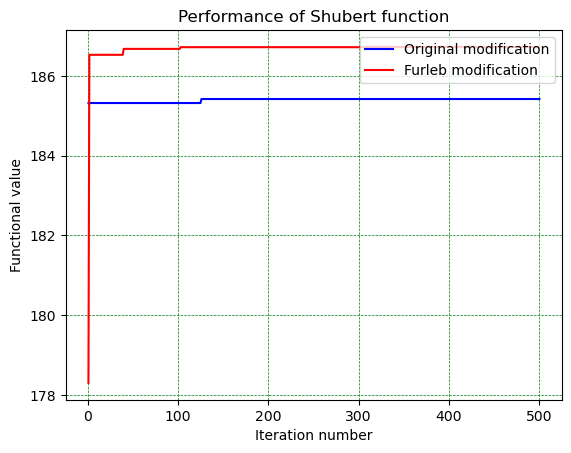

-->Test number 5
Best solution found by original is:  [ 4.88020778 -0.79618543]
And function result for this solution is:  185.54349856220136
Totally elapsed for original  0.7092854  seconds
Best solution found by furleb modification is:  186.72611400899035
And function result for this solution is:  [-1.42434662 -7.08227139]
Totally elapsed for furleb modification  6.1211062  seconds


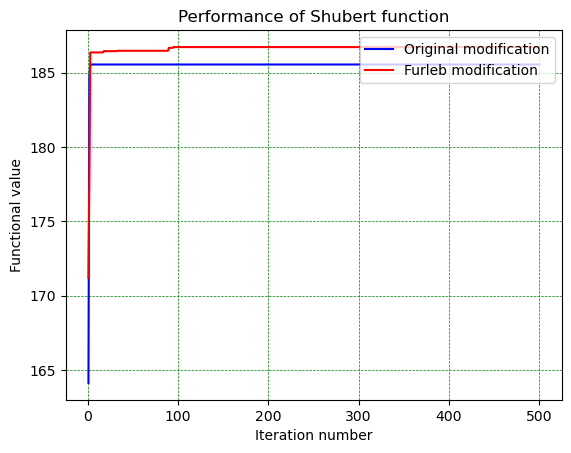

-->Test number 6
Best solution found by original is:  [-0.79741674 -1.35672847]
And function result for this solution is:  175.70826080579081
Totally elapsed for original  0.3745732  seconds
Best solution found by furleb modification is:  186.7162385263493
And function result for this solution is:  [-7.70743041 -0.80273225]
Totally elapsed for furleb modification  6.2019094  seconds


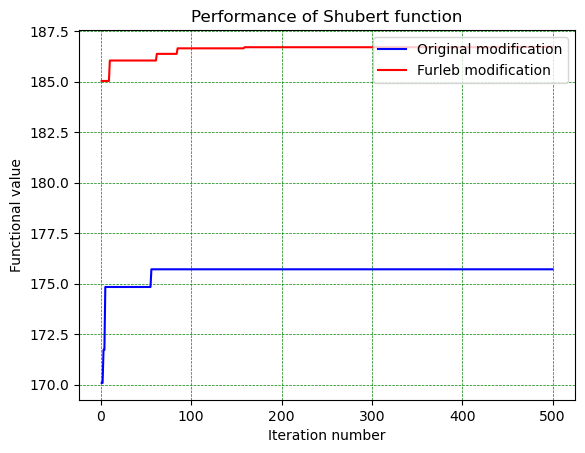

-->Test number 7
Best solution found by original is:  [-1.40594221 -0.80139203]
And function result for this solution is:  185.86622911562364
Totally elapsed for original  0.7316282  seconds
Best solution found by furleb modification is:  186.72077340270144
And function result for this solution is:  [-7.70982798 -7.08203337]
Totally elapsed for furleb modification  6.1882122  seconds


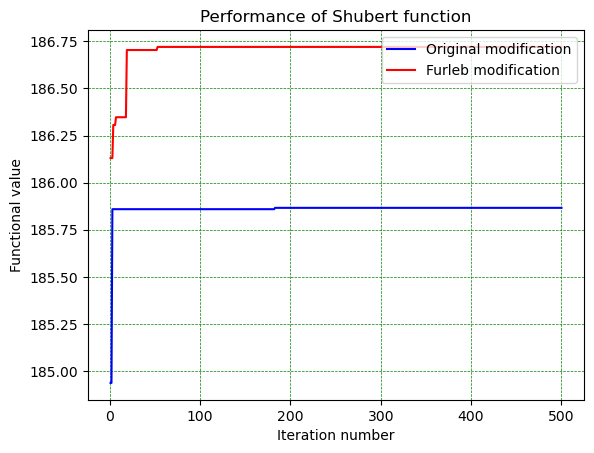

-->Test number 8
Best solution found by original is:  [ 4.86751965 -0.80191985]
And function result for this solution is:  186.51601542722975
Totally elapsed for original  0.7070864  seconds
Best solution found by furleb modification is:  186.72967277717058
And function result for this solution is:  [-1.42454046 -7.08306518]
Totally elapsed for furleb modification  6.261848  seconds


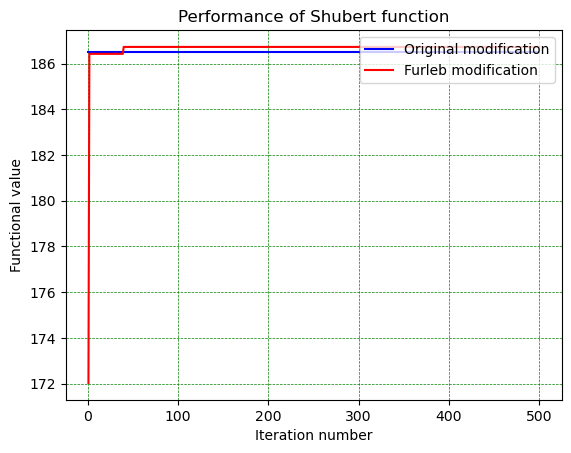

-->Test number 9
Best solution found by original is:  [5.49156924 4.87395952]
And function result for this solution is:  185.97233677031812
Totally elapsed for original  0.8417254  seconds
Best solution found by furleb modification is:  186.7085126472763
And function result for this solution is:  [-7.08082384  4.85972656]
Totally elapsed for furleb modification  6.1707242  seconds


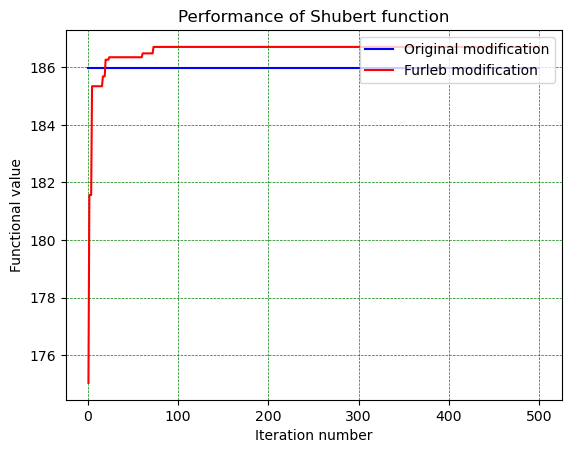

In [81]:
function_name = "Shubert function"
for test_number in range(TESTS_AMOUNT):
    print("-->Test number " + str(test_number))
    perform_comparsion_test(function_name, shubert_function, -10.0, 10.0, 100, 500, 0.4, 0.3, 0.5, draw_graph=True)